# 16 — Difference Maps and Spatial Diagnostics

**Origin:** Consolidates Existing Notebooks 10, 16, and 23  
**Refactor status:** Finished           
**Validation status:** Finished           
**Completion gate passed:** Yes              
**Output root:** `outputs/16_difference_maps_and_spatial_diagnostics/`  
**Depends on:** Notebooks 02, 08–13, including Notebook 12A

## Purpose

Generate normalized, model-agnostic spatial diagnostics for every completed and technically valid restoration candidate produced by:

- OpenCV Telea;
- LaMa;
- HINT;
- Stable Diffusion inpainting;
- the technically validated SDXL bounded scope.

For each candidate, the notebook computes:

1. clean-versus-damaged absolute error;
2. clean-versus-restored absolute error;
3. signed restoration improvement;
4. masked signed restoration improvement;
5. restoration-change and spillover diagnostics.

Signed improvement is defined as:

`damaged absolute error - restored absolute error`

Positive values indicate reduced reference error. Negative values indicate that restoration increased reference error.

Diagnostics are summarized over the canonical region policy:

- `full_image`;
- `content_region`;
- `masked_region`;
- `mask_bbox_crop`;
- `inner_boundary_band`;
- `outer_boundary_band`;
- `boundary_ring`;
- `outside_mask_content`;
- `outside_boundary_ring`;
- `degradation_support`.

The floating-point computations and normalized CSV summaries are the scientific evidence. PNG maps use standardized global scales and are downstream visualization assets.

Zero-control candidates remain in the canonical diagnostic table, but redundant all-zero map images are not persisted.

These diagnostics are descriptive evidence. They do not independently establish perceptual quality, semantic correctness, conservation validity, historical plausibility, or final trustworthiness.

## Approved candidate scope

- 2,620 OpenCV Telea candidates;
- 2,620 LaMa candidates;
- 2,620 HINT candidates;
- 8,520 Stable Diffusion candidates;
- 24 technically validated SDXL candidates from 35 recorded attempts;
- 16,404 evaluated candidates total;
- 15,204 nonzero candidates;
- 1,200 zero-control candidates;
- 11 explicit SDXL exclusions: ten budget skips and one timeout.

## Canonical outputs

- `metrics/spatial_diagnostics.csv`
- `images/maps/<model_id>/<map_id>/<map_type>.png`
- `figures/selected_spatial_panels/`
- `manifests/map_images.csv`
- `manifests/run_manifest.json`
- `manifests/artifacts.csv`
- `validation/checks.csv`

In [1]:
from pathlib import Path
import json
import platform
import sys

import matplotlib
import numpy as np
import pandas as pd
import PIL
import yaml
from IPython.display import display


# ---------------------------------------------------------------------------
# Minimal repository bootstrap
# ---------------------------------------------------------------------------

CURRENT_DIRECTORY = Path.cwd().resolve()

PROJECT_ROOT_MATCHES = [
    candidate
    for candidate in (
        CURRENT_DIRECTORY,
        *CURRENT_DIRECTORY.parents,
    )
    if (
        (candidate / ".git").exists()
        and (
            candidate
            / "src"
            / "restoration_eval"
        ).is_dir()
        and (candidate / "notebooks").is_dir()
    )
]

if not PROJECT_ROOT_MATCHES:
    raise FileNotFoundError(
        "Could not locate the painting-restoration repository root "
        f"from {CURRENT_DIRECTORY}."
    )

PROJECT_ROOT = PROJECT_ROOT_MATCHES[0]
SOURCE_DIRECTORY = PROJECT_ROOT / "src"

if str(SOURCE_DIRECTORY) not in sys.path:
    sys.path.insert(
        0,
        str(SOURCE_DIRECTORY),
    )


# ---------------------------------------------------------------------------
# Versioned project helpers
# ---------------------------------------------------------------------------

from restoration_eval import (
    __version__ as PACKAGE_VERSION,
)

from restoration_eval.error_maps import (
    CANDIDATE_MAP_TYPES,
    ERROR_MAP_MODULE_NAME,
    ERROR_MAP_VERSION,
    SPATIAL_DIAGNOSTIC_VERSION,
    SPATIAL_MAP_MANIFEST_VERSION,
    SPATIAL_MAP_RENDERER_VERSION,
    SPATIAL_REGION_ORDER,
    load_spatial_diagnostics_config,
    make_map_id,
)

from restoration_eval.evaluation_inputs import (
    EVALUATION_INPUTS_MODULE_VERSION,
    EVALUATION_WORKLIST_SCHEMA_VERSION,
)

from restoration_eval.manifests import (
    MANIFESTS_MODULE_VERSION,
    sha256_file,
    utc_now_iso,
)

from restoration_eval.paths import (
    PATHS_MODULE_VERSION,
    ensure_output_subdirs,
    load_project_paths_registry,
    notebook_output_root,
    resolve_repo_path,
    to_repo_relative,
    validate_project_paths_registry,
)

from restoration_eval.regions import (
    REGIONS_MODULE_VERSION,
)

from restoration_eval.schemas import (
    ARTIFACT_MANIFEST_SCHEMA,
    CASE_REGISTRY_SCHEMA,
    CLASSICAL_METRICS_SCHEMA,
    MODEL_ELIGIBILITY_SCHEMA,
    PREPROCESSED_IMAGES_SCHEMA,
    REGION_POLICY_SCHEMA,
    RESTORATIONS_SCHEMA,
    SCHEMAS_MODULE_VERSION,
    SDXL_PARTIAL_CANDIDATES_SCHEMA,
    SPATIAL_DIAGNOSTICS_SCHEMA,
    SPATIAL_MAP_IMAGE_MANIFEST_SCHEMA,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
)

from restoration_eval.validation import (
    VALIDATION_MODULE_VERSION,
    ValidationCollector,
)


# ---------------------------------------------------------------------------
# Notebook identity and owned output directories
# ---------------------------------------------------------------------------

NOTEBOOK_ID = "16"
NOTEBOOK_STEM = (
    "16_difference_maps_and_spatial_diagnostics"
)

SUPPORTED_PYTHON_MINORS = {
    (3, 11),
    (3, 12),
}

RUN_STARTED_AT_UTC = utc_now_iso()

NOTEBOOK_OUTPUT_ROOT = notebook_output_root(
    NOTEBOOK_STEM,
    PROJECT_ROOT,
    create=False,
)

OUTPUT_DIRECTORIES = ensure_output_subdirs(
    NOTEBOOK_STEM,
    (
        "metrics",
        "images",
        "figures",
        "manifests",
        "validation",
        "work",
    ),
    PROJECT_ROOT,
)

print("Notebook 16 repository bootstrap complete.")
print("Project root:", PROJECT_ROOT)
print("Notebook output root:", NOTEBOOK_OUTPUT_ROOT)
print("Package version:", PACKAGE_VERSION)
print("Spatial helper:", ERROR_MAP_MODULE_NAME)
print("Spatial helper version:", ERROR_MAP_VERSION)
print(
    "Spatial diagnostic schema:",
    SPATIAL_DIAGNOSTIC_VERSION,
)
print(
    "Map-image manifest schema:",
    SPATIAL_MAP_MANIFEST_VERSION,
)
print(
    "Map renderer version:",
    SPATIAL_MAP_RENDERER_VERSION,
)
print("Run started at UTC:", RUN_STARTED_AT_UTC)

Notebook 16 repository bootstrap complete.
Project root: D:\Masters\FH\Thesis\painting-restoration-eval
Notebook output root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\16_difference_maps_and_spatial_diagnostics
Package version: 0.1.0
Spatial helper: restoration_eval.error_maps
Spatial helper version: 4.1.0
Spatial diagnostic schema: spatial_diagnostics.v1
Map-image manifest schema: spatial_map_images.v1
Map renderer version: spatial_map_renderer.v1
Run started at UTC: 2026-09-15T06:15:58.852758Z


In [2]:
# ---------------------------------------------------------------------------
# Governing paths
# ---------------------------------------------------------------------------

SPATIAL_CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "spatial_diagnostics.yaml"
)

NOTEBOOK_ROADMAP_PATH = (
    PROJECT_ROOT
    / "docs"
    / "final_notebook_roadmap.md"
)

IMPLEMENTATION_GUIDELINES_PATH = (
    PROJECT_ROOT
    / "docs"
    / "refactoring_implementation_guidelines.md"
)

NOTEBOOK_PATH = (
    PROJECT_ROOT
    / "notebooks"
    / f"{NOTEBOOK_STEM}.ipynb"
)

HELPER_PATHS = {
    "error_maps_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "error_maps.py"
    ),
    "evaluation_inputs_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "evaluation_inputs.py"
    ),
    "regions_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "regions.py"
    ),
    "schemas_helper": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "schemas.py"
    ),
}


# ---------------------------------------------------------------------------
# Approved spatial-diagnostics configuration
# ---------------------------------------------------------------------------

with SPATIAL_CONFIG_PATH.open(
    "r",
    encoding="utf-8-sig",
) as handle:
    spatial_config_document = yaml.safe_load(handle)

SPATIAL_CONFIG = load_spatial_diagnostics_config(
    SPATIAL_CONFIG_PATH
)

CONFIG_SCHEMA_VERSION = spatial_config_document[
    "config_schema_version"
]

CONFIGURED_INPUTS = SPATIAL_CONFIG["inputs"]
CONFIGURED_OUTPUTS = SPATIAL_CONFIG["output"]
EXPECTED_COUNTS = SPATIAL_CONFIG["expected_counts"]

if SPATIAL_CONFIG["notebook_id"] != NOTEBOOK_ID:
    raise ValueError(
        "Configured notebook ID disagrees with Notebook 16."
    )

if SPATIAL_CONFIG["notebook_stem"] != NOTEBOOK_STEM:
    raise ValueError(
        "Configured notebook stem disagrees with Notebook 16."
    )

if (
    CONFIGURED_OUTPUTS["root"]
    != f"outputs/{NOTEBOOK_STEM}"
):
    raise ValueError(
        "Configured output root violates Notebook 16 ownership."
    )


# ---------------------------------------------------------------------------
# Explicit input paths
# ---------------------------------------------------------------------------

INPUTS = {
    "project_inventory": resolve_repo_path(
        CONFIGURED_INPUTS["inventory_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "inventory_run": resolve_repo_path(
        CONFIGURED_INPUTS["inventory_run_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "project_paths_registry": resolve_repo_path(
        CONFIGURED_INPUTS["project_paths_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "preprocessing_geometry": resolve_repo_path(
        CONFIGURED_INPUTS["geometry_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "preprocessing_run_manifest": resolve_repo_path(
        CONFIGURED_INPUTS[
            "geometry_run_manifest_path"
        ],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "contracts_run_manifest": resolve_repo_path(
        CONFIGURED_INPUTS[
            "contracts_run_manifest_path"
        ],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "contracts_artifacts": resolve_repo_path(
        CONFIGURED_INPUTS[
            "contracts_artifacts_path"
        ],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "evaluation_contract_config": resolve_repo_path(
        CONFIGURED_INPUTS[
            "evaluation_contract_config_path"
        ],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "case_registry": resolve_repo_path(
        CONFIGURED_INPUTS["case_registry_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "model_eligibility": resolve_repo_path(
        CONFIGURED_INPUTS["model_eligibility_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "region_policy": resolve_repo_path(
        CONFIGURED_INPUTS["region_policy_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "schema_registry": resolve_repo_path(
        CONFIGURED_INPUTS["schema_registry_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "classical_metrics": resolve_repo_path(
        CONFIGURED_INPUTS["classical_metrics_path"],
        PROJECT_ROOT,
        must_exist=True,
    ),
    "classical_metrics_run_manifest": resolve_repo_path(
        CONFIGURED_INPUTS[
            "classical_metrics_run_manifest_path"
        ],
        PROJECT_ROOT,
        must_exist=True,
    ),
}

SOURCE_CONFIGS = {
    source["source_table_id"]: source
    for source in CONFIGURED_INPUTS[
        "upstream_sources"
    ]
}

SOURCE_BY_MODEL = {
    source["model_id"]: source
    for source in CONFIGURED_INPUTS[
        "upstream_sources"
    ]
}

for source_id, source_config in SOURCE_CONFIGS.items():
    INPUTS[
        f"{source_id}_table"
    ] = resolve_repo_path(
        source_config["path"],
        PROJECT_ROOT,
        must_exist=True,
    )

    INPUTS[
        f"{source_id}_run_manifest"
    ] = resolve_repo_path(
        source_config["run_manifest_path"],
        PROJECT_ROOT,
        must_exist=True,
    )


# ---------------------------------------------------------------------------
# Canonical output paths
# ---------------------------------------------------------------------------

OUTPUTS = {
    "spatial_diagnostics": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["diagnostics_path"]
    ),
    "maps_root": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["maps_root"]
    ),
    "selected_panels_root": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "selected_panels_root"
        ]
    ),
    "map_manifest": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "map_manifest_path"
        ]
    ),
    "run_manifest": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "run_manifest_path"
        ]
    ),
    "artifacts": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["artifacts_path"]
    ),
    "validation": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS["validation_path"]
    ),
}

WORK_PATHS = {
    "diagnostics_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "diagnostics_checkpoint_path"
        ]
    ),
    "map_manifest_checkpoint": (
        NOTEBOOK_OUTPUT_ROOT
        / CONFIGURED_OUTPUTS[
            "map_manifest_checkpoint_path"
        ]
    ),
}

OUTPUTS["maps_root"].mkdir(
    parents=True,
    exist_ok=True,
)

OUTPUTS["selected_panels_root"].mkdir(
    parents=True,
    exist_ok=True,
)


# ---------------------------------------------------------------------------
# Inventory and project path registry
# ---------------------------------------------------------------------------

inventory_df = pd.read_csv(
    INPUTS["project_inventory"],
    low_memory=False,
)

with INPUTS["inventory_run"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    inventory_run = json.load(handle)

project_paths_registry = load_project_paths_registry(
    PROJECT_ROOT
)

inventory_relative_paths = set(
    inventory_df["relative_path"].astype(str)
)

registry_artifacts = {
    record["artifact_key"]: record
    for record in project_paths_registry["artifacts"]
}


# ---------------------------------------------------------------------------
# Upstream run manifests
# ---------------------------------------------------------------------------

UPSTREAM_MANIFEST_PATHS = {
    "notebook_02": (
        INPUTS["preprocessing_run_manifest"]
    ),
    "notebook_08": (
        INPUTS["contracts_run_manifest"]
    ),
    "notebook_13": (
        INPUTS["classical_metrics_run_manifest"]
    ),
}

for source_id in SOURCE_CONFIGS:
    UPSTREAM_MANIFEST_PATHS[
        source_id
    ] = INPUTS[
        f"{source_id}_run_manifest"
    ]

upstream_manifests = {}

for producer, manifest_path in (
    UPSTREAM_MANIFEST_PATHS.items()
):
    with manifest_path.open(
        "r",
        encoding="utf-8-sig",
    ) as handle:
        upstream_manifests[producer] = json.load(
            handle
        )


# ---------------------------------------------------------------------------
# Provenance checksums
# ---------------------------------------------------------------------------

CONFIGURATION_PATHS = {
    "spatial_diagnostics": SPATIAL_CONFIG_PATH,
    "evaluation_contract": (
        INPUTS["evaluation_contract_config"]
    ),
}

GOVERNING_PATHS = {
    "notebook_roadmap": NOTEBOOK_ROADMAP_PATH,
    "implementation_guidelines": (
        IMPLEMENTATION_GUIDELINES_PATH
    ),
    "notebook": NOTEBOOK_PATH,
}

CONFIGURATION_CHECKSUMS = {
    key: sha256_file(path)
    for key, path in CONFIGURATION_PATHS.items()
}

HELPER_CHECKSUMS = {
    key: sha256_file(path)
    for key, path in HELPER_PATHS.items()
}

print("Notebook 16 paths and configuration loaded.")
print(
    "Inventory run ID:",
    inventory_run["inventory_run_id"],
)
print("Inventory rows:", len(inventory_df))
print(
    "Registered project artifacts:",
    len(registry_artifacts),
)
print(
    "Upstream run manifests:",
    len(upstream_manifests),
)
print(
    "Declared candidate sources:",
    len(SOURCE_CONFIGS),
)
print(
    "Declared canonical outputs:",
    len(OUTPUTS),
)

Notebook 16 paths and configuration loaded.
Inventory run ID: inventory_20260914T181754Z_e464522c
Inventory rows: 29846
Registered project artifacts: 235
Upstream run manifests: 8
Declared candidate sources: 5
Declared canonical outputs: 7


In [3]:
# ---------------------------------------------------------------------------
# Explicit input contract
# ---------------------------------------------------------------------------

def input_contract_record(
    input_key,
    producer,
    path,
    file_format,
    schema_version,
    expected_cardinality,
    role,
):
    return {
        "input_key": input_key,
        "producer": producer,
        "relative_path": to_repo_relative(
            path,
            PROJECT_ROOT,
        ),
        "format": file_format,
        "schema_version": schema_version,
        "expected_cardinality": expected_cardinality,
        "role": role,
        "required": True,
    }


input_contract_records = [
    input_contract_record(
        "project_inventory",
        "tools/build_project_inventory.py",
        INPUTS["project_inventory"],
        "csv",
        "project_file_inventory.v1",
        inventory_run["summary"]["file_count"],
        "repository discovery",
    ),
    input_contract_record(
        "inventory_run",
        "tools/build_project_inventory.py",
        INPUTS["inventory_run"],
        "json",
        "inventory_run.v1",
        1,
        "inventory provenance",
    ),
    input_contract_record(
        "project_paths_registry",
        "validated notebook handoffs",
        INPUTS["project_paths_registry"],
        "json",
        project_paths_registry[
            "registry_schema_version"
        ],
        len(project_paths_registry["artifacts"]),
        "artifact discovery",
    ),
    input_contract_record(
        "preprocessing_geometry",
        "Notebook 02",
        INPUTS["preprocessing_geometry"],
        "csv",
        PREPROCESSED_IMAGES_SCHEMA.version,
        EXPECTED_COUNTS[
            "preprocessed_images_rows"
        ],
        "content-box geometry and clean-image metadata",
    ),
    input_contract_record(
        "case_registry",
        "Notebook 08",
        INPUTS["case_registry"],
        "csv",
        CASE_REGISTRY_SCHEMA.version,
        EXPECTED_COUNTS["case_registry_rows"],
        "normalized evaluation cases",
    ),
    input_contract_record(
        "model_eligibility",
        "Notebook 08",
        INPUTS["model_eligibility"],
        "csv",
        MODEL_ELIGIBILITY_SCHEMA.version,
        EXPECTED_COUNTS[
            "model_eligibility_rows"
        ],
        "model and case routing",
    ),
    input_contract_record(
        "region_policy",
        "Notebook 08",
        INPUTS["region_policy"],
        "csv",
        REGION_POLICY_SCHEMA.version,
        EXPECTED_COUNTS["region_policy_rows"],
        "canonical region compatibility policy",
    ),
    input_contract_record(
        "contracts_artifacts",
        "Notebook 08",
        INPUTS["contracts_artifacts"],
        "csv",
        ARTIFACT_MANIFEST_SCHEMA.version,
        EXPECTED_COUNTS[
            "contracts_artifact_rows"
        ],
        "contract artifact provenance",
    ),
    input_contract_record(
        "schema_registry",
        "Notebook 08",
        INPUTS["schema_registry"],
        "json",
        "schema_registry.v1",
        1,
        "upstream schema discovery",
    ),
    input_contract_record(
        "classical_metrics",
        "Notebook 13",
        INPUTS["classical_metrics"],
        "csv",
        CLASSICAL_METRICS_SCHEMA.version,
        EXPECTED_COUNTS[
            "classical_metric_rows"
        ],
        "candidate scope and downstream comparison evidence",
    ),
    input_contract_record(
        "spatial_diagnostics_config",
        "Repository configuration",
        SPATIAL_CONFIG_PATH,
        "yaml",
        CONFIG_SCHEMA_VERSION,
        1,
        "map, region, scale, execution, and output policy",
    ),
    input_contract_record(
        "evaluation_contract_config",
        "Repository configuration",
        INPUTS["evaluation_contract_config"],
        "yaml",
        "evaluation_contract_config.v1",
        1,
        "evaluation and region policy",
    ),
]

for producer, manifest_path in (
    UPSTREAM_MANIFEST_PATHS.items()
):
    input_contract_records.append(
        input_contract_record(
            f"{producer}_run_manifest",
            producer,
            manifest_path,
            "json",
            "run_manifest.v1",
            1,
            "upstream execution provenance",
        )
    )

SOURCE_SCHEMA_BY_MODEL = {
    "opencv_telea": RESTORATIONS_SCHEMA,
    "lama": RESTORATIONS_SCHEMA,
    "hint_places2": RESTORATIONS_SCHEMA,
    "stable_diffusion_inpainting": (
        STABLE_DIFFUSION_CANDIDATES_SCHEMA
    ),
    "sdxl_inpainting": (
        SDXL_PARTIAL_CANDIDATES_SCHEMA
    ),
}

for source_id, source_config in SOURCE_CONFIGS.items():
    model_id = source_config["model_id"]
    source_schema = SOURCE_SCHEMA_BY_MODEL[model_id]

    input_contract_records.append(
        input_contract_record(
            f"{source_id}_table",
            source_id,
            INPUTS[f"{source_id}_table"],
            "csv",
            source_schema.version,
            EXPECTED_COUNTS[
                "source_rows_by_model"
            ][model_id],
            (
                "recorded restoration candidate or "
                "attempt rows before technical filtering"
            ),
        )
    )

input_contract_df = pd.DataFrame(
    input_contract_records
)


# ---------------------------------------------------------------------------
# Explicit output contract
# ---------------------------------------------------------------------------

output_contract_records = [
    {
        "output_key": "spatial_diagnostics",
        "relative_path": to_repo_relative(
            OUTPUTS["spatial_diagnostics"],
            PROJECT_ROOT,
        ),
        "format": "csv",
        "schema_version": (
            SPATIAL_DIAGNOSTICS_SCHEMA.version
        ),
        "expected_cardinality": (
            EXPECTED_COUNTS[
                "spatial_diagnostic_rows"
            ]
        ),
        "artifact_role": "primary normalized evidence",
        "downstream_consumers": (
            "spatial comparison, XAI, uncertainty, "
            "case-report, and dashboard notebooks"
        ),
    },
    {
        "output_key": "candidate_map_images",
        "relative_path": to_repo_relative(
            OUTPUTS["maps_root"],
            PROJECT_ROOT,
        ),
        "format": "png directory",
        "schema_version": (
            SPATIAL_MAP_RENDERER_VERSION
        ),
        "expected_cardinality": (
            EXPECTED_COUNTS[
                "candidate_map_images"
            ]
        ),
        "artifact_role": "downstream visualization evidence",
        "downstream_consumers": (
            "XAI, uncertainty, case-report, "
            "comparison, and dashboard notebooks"
        ),
    },
    {
        "output_key": "selected_spatial_panels",
        "relative_path": to_repo_relative(
            OUTPUTS["selected_panels_root"],
            PROJECT_ROOT,
        ),
        "format": "png directory",
        "schema_version": (
            SPATIAL_MAP_RENDERER_VERSION
        ),
        "expected_cardinality": (
            EXPECTED_COUNTS[
                "selected_panels_total"
            ]
        ),
        "artifact_role": "human-review figures",
        "downstream_consumers": (
            "reports, thesis figures, and case studies"
        ),
    },
    {
        "output_key": "map_manifest",
        "relative_path": to_repo_relative(
            OUTPUTS["map_manifest"],
            PROJECT_ROOT,
        ),
        "format": "csv",
        "schema_version": (
            SPATIAL_MAP_IMAGE_MANIFEST_SCHEMA.version
        ),
        "expected_cardinality": (
            EXPECTED_COUNTS["map_manifest_rows"]
        ),
        "artifact_role": "normalized image manifest",
        "downstream_consumers": (
            "all downstream spatial-image consumers"
        ),
    },
    {
        "output_key": "run_manifest",
        "relative_path": to_repo_relative(
            OUTPUTS["run_manifest"],
            PROJECT_ROOT,
        ),
        "format": "json",
        "schema_version": "run_manifest.v1",
        "expected_cardinality": 1,
        "artifact_role": "run provenance",
        "downstream_consumers": (
            "inventory and downstream notebooks"
        ),
    },
    {
        "output_key": "artifacts",
        "relative_path": to_repo_relative(
            OUTPUTS["artifacts"],
            PROJECT_ROOT,
        ),
        "format": "csv",
        "schema_version": (
            ARTIFACT_MANIFEST_SCHEMA.version
        ),
        "expected_cardinality": (
            "one row per canonical file or directory artifact"
        ),
        "artifact_role": "artifact discovery",
        "downstream_consumers": (
            "project path registry and downstream notebooks"
        ),
    },
    {
        "output_key": "validation",
        "relative_path": to_repo_relative(
            OUTPUTS["validation"],
            PROJECT_ROOT,
        ),
        "format": "csv",
        "schema_version": "validation_checks.v1",
        "expected_cardinality": (
            "one row per unique validation check"
        ),
        "artifact_role": "QA evidence",
        "downstream_consumers": (
            "completion gate and audit"
        ),
    },
]

output_contract_df = pd.DataFrame(
    output_contract_records
)

print("Notebook 16 input/output contracts assembled.")
print(
    "Required input artifacts:",
    len(input_contract_df),
)
print(
    "Canonical output artifacts:",
    len(output_contract_df),
)
print(
    "Expected candidate maps:",
    EXPECTED_COUNTS["candidate_map_images"],
)
print(
    "Expected selected panels:",
    EXPECTED_COUNTS["selected_panels_total"],
)

Notebook 16 input/output contracts assembled.
Required input artifacts: 25
Canonical output artifacts: 7
Expected candidate maps: 76020
Expected selected panels: 14


In [4]:
# ---------------------------------------------------------------------------
# Batch 1 preflight validation
# ---------------------------------------------------------------------------

VALIDATION = ValidationCollector()
VALIDATION_STAGE = "batch_1_preflight"


def add_preflight_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    severity="blocking",
    details="",
):
    VALIDATION.add(
        validation_stage=VALIDATION_STAGE,
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


python_minor = (
    sys.version_info.major,
    sys.version_info.minor,
)

add_preflight_check(
    "supported_python",
    "Python minor version is supported.",
    sorted(SUPPORTED_PYTHON_MINORS),
    python_minor,
    python_minor in SUPPORTED_PYTHON_MINORS,
)

add_preflight_check(
    "notebook_identity",
    "Configuration identifies Notebook 16 exactly.",
    {
        "notebook_id": NOTEBOOK_ID,
        "notebook_stem": NOTEBOOK_STEM,
    },
    {
        "notebook_id": SPATIAL_CONFIG["notebook_id"],
        "notebook_stem": SPATIAL_CONFIG[
            "notebook_stem"
        ],
    },
    (
        SPATIAL_CONFIG["notebook_id"] == NOTEBOOK_ID
        and SPATIAL_CONFIG["notebook_stem"]
        == NOTEBOOK_STEM
    ),
)

add_preflight_check(
    "owned_output_root",
    "Configured output root is notebook-owned.",
    f"outputs/{NOTEBOOK_STEM}",
    CONFIGURED_OUTPUTS["root"],
    (
        CONFIGURED_OUTPUTS["root"]
        == f"outputs/{NOTEBOOK_STEM}"
    ),
)

missing_input_keys = sorted(
    key
    for key, path in INPUTS.items()
    if not path.is_file()
)

add_preflight_check(
    "required_inputs_exist",
    "Every explicitly declared input file exists.",
    [],
    missing_input_keys,
    not missing_input_keys,
)

missing_governing_paths = sorted(
    key
    for key, path in GOVERNING_PATHS.items()
    if not path.is_file()
)

add_preflight_check(
    "governing_files_exist",
    "Notebook, roadmap, and implementation guidelines exist.",
    [],
    missing_governing_paths,
    not missing_governing_paths,
)

missing_helper_paths = sorted(
    key
    for key, path in HELPER_PATHS.items()
    if not path.is_file()
)

add_preflight_check(
    "required_helpers_exist",
    "Every required helper module exists.",
    [],
    missing_helper_paths,
    not missing_helper_paths,
)

inventory_summary = inventory_run["summary"]

add_preflight_check(
    "inventory_completed",
    "Inventory run completed successfully.",
    "completed",
    inventory_run["status"],
    inventory_run["status"] == "completed",
)

add_preflight_check(
    "inventory_has_no_read_errors",
    "Inventory contains no file-read errors.",
    {
        "read_error_file_count": 0,
        "read_error_count": 0,
    },
    {
        "read_error_file_count": inventory_summary[
            "read_error_file_count"
        ],
        "read_error_count": inventory_summary[
            "read_error_count"
        ],
    },
    (
        inventory_summary[
            "read_error_file_count"
        ] == 0
        and inventory_summary[
            "read_error_count"
        ] == 0
    ),
)

add_preflight_check(
    "inventory_row_count",
    "Inventory CSV row count matches its run manifest.",
    inventory_summary["file_count"],
    len(inventory_df),
    len(inventory_df)
    == inventory_summary["file_count"],
)

# The inventory intentionally excludes its own generated CSV and
# run manifest to avoid self-referential and unstable inventory rows.
inventory_self_exclusions = {
    to_repo_relative(
        INPUTS["project_inventory"],
        PROJECT_ROOT,
    ),
    to_repo_relative(
        INPUTS["inventory_run"],
        PROJECT_ROOT,
    ),
}

required_inventory_paths = {
    to_repo_relative(path, PROJECT_ROOT)
    for path in (
        *INPUTS.values(),
        *HELPER_PATHS.values(),
        *GOVERNING_PATHS.values(),
        SPATIAL_CONFIG_PATH,
    )
} - inventory_self_exclusions


missing_inventory_paths = sorted(
    required_inventory_paths
    - inventory_relative_paths
)

add_preflight_check(
    "inputs_are_in_inventory",
    "Required inputs and governing files are inventoried.",
    [],
    missing_inventory_paths,
    not missing_inventory_paths,
)

registry_errors = validate_project_paths_registry(
    project_paths_registry
)

add_preflight_check(
    "project_paths_registry_valid",
    "Project paths registry satisfies its normalized contract.",
    [],
    registry_errors,
    not registry_errors,
)

upstream_manifest_status_df = pd.DataFrame(
    [
        {
            "producer": producer,
            "relative_path": to_repo_relative(
                UPSTREAM_MANIFEST_PATHS[producer],
                PROJECT_ROOT,
            ),
            "manifest_schema_version": manifest.get(
                "manifest_schema_version"
            ),
            "run_status": manifest.get("run_status"),
            "validation_status": manifest.get(
                "validation_status"
            ),
            "completion_gate_passed": manifest.get(
                "completion_gate_passed"
            ),
        }
        for producer, manifest in (
            upstream_manifests.items()
        )
    ]
)

upstream_manifests_pass = bool(
    upstream_manifest_status_df[
        "manifest_schema_version"
    ].eq("run_manifest.v1").all()
    and upstream_manifest_status_df[
        "run_status"
    ].eq("completed").all()
    and upstream_manifest_status_df[
        "validation_status"
    ].eq("passed").all()
    and upstream_manifest_status_df[
        "completion_gate_passed"
    ].eq(True).all()
)

add_preflight_check(
    "upstream_completion_gates",
    "Every declared upstream run passed its completion gate.",
    {
        "manifest_schema_version": "run_manifest.v1",
        "run_status": "completed",
        "validation_status": "passed",
        "completion_gate_passed": True,
    },
    upstream_manifest_status_df.to_dict(
        orient="records"
    ),
    upstream_manifests_pass,
)

configured_model_counts = EXPECTED_COUNTS[
    "candidates_by_model"
]

add_preflight_check(
    "candidate_count_arithmetic",
    "Configured model counts sum to the approved candidate total.",
    EXPECTED_COUNTS["evaluated_candidates"],
    sum(configured_model_counts.values()),
    (
        sum(configured_model_counts.values())
        == EXPECTED_COUNTS[
            "evaluated_candidates"
        ]
    ),
)

add_preflight_check(
    "zero_control_arithmetic",
    "Nonzero and zero-control counts sum to the candidate total.",
    EXPECTED_COUNTS["evaluated_candidates"],
    (
        EXPECTED_COUNTS["nonzero_candidates"]
        + EXPECTED_COUNTS[
            "zero_control_candidates"
        ]
    ),
    (
        EXPECTED_COUNTS["nonzero_candidates"]
        + EXPECTED_COUNTS[
            "zero_control_candidates"
        ]
        == EXPECTED_COUNTS[
            "evaluated_candidates"
        ]
    ),
)

expected_candidate_map_count = (
    EXPECTED_COUNTS["nonzero_candidates"]
    * EXPECTED_COUNTS[
        "candidate_maps_per_nonzero_candidate"
    ]
)

add_preflight_check(
    "candidate_map_count_arithmetic",
    "Nonzero candidate scope produces the expected map count.",
    EXPECTED_COUNTS["candidate_map_images"],
    expected_candidate_map_count,
    (
        expected_candidate_map_count
        == EXPECTED_COUNTS[
            "candidate_map_images"
        ]
    ),
)

expected_map_manifest_rows = (
    EXPECTED_COUNTS["candidate_map_images"]
    + EXPECTED_COUNTS["selected_panels_total"]
)

add_preflight_check(
    "map_manifest_count_arithmetic",
    "Candidate maps and selected panels produce the manifest total.",
    EXPECTED_COUNTS["map_manifest_rows"],
    expected_map_manifest_rows,
    (
        expected_map_manifest_rows
        == EXPECTED_COUNTS[
            "map_manifest_rows"
        ]
    ),
)

add_preflight_check(
    "canonical_region_contract",
    "Configuration and helper expose the same canonical region order.",
    list(SPATIAL_REGION_ORDER),
    SPATIAL_CONFIG["regions"]["region_order"],
    (
        tuple(
            SPATIAL_CONFIG[
                "regions"
            ]["region_order"]
        )
        == SPATIAL_REGION_ORDER
    ),
)

add_preflight_check(
    "candidate_map_type_contract",
    "Configuration and helper expose the same five candidate map types.",
    list(CANDIDATE_MAP_TYPES),
    SPATIAL_CONFIG[
        "visualization"
    ]["map_types"],
    (
        tuple(
            SPATIAL_CONFIG[
                "visualization"
            ]["map_types"]
        )
        == CANDIDATE_MAP_TYPES
    ),
)

example_map_id = make_map_id(
    "notebook_16_preflight_candidate"
)

add_preflight_check(
    "short_map_identifier",
    "Map identifiers satisfy the configured filename-length limit.",
    (
        f"maximum "
        f"{SPATIAL_CONFIG['execution']['maximum_map_filename_characters']} "
        "characters"
    ),
    {
        "example": example_map_id,
        "length": len(example_map_id),
    },
    (
        len(example_map_id)
        <= SPATIAL_CONFIG[
            "execution"
        ][
            "maximum_map_filename_characters"
        ]
    ),
)

canonical_output_paths = [
    path
    for key, path in OUTPUTS.items()
    if key not in {
        "maps_root",
        "selected_panels_root",
    }
]

output_ownership_violations = sorted(
    str(path)
    for path in canonical_output_paths
    if not path.resolve().is_relative_to(
        NOTEBOOK_OUTPUT_ROOT.resolve()
    )
)

add_preflight_check(
    "output_path_ownership",
    "Every canonical output remains inside the Notebook 16 root.",
    [],
    output_ownership_violations,
    not output_ownership_violations,
)

checksum_lengths = {
    **{
        f"config:{key}": len(value)
        for key, value in (
            CONFIGURATION_CHECKSUMS.items()
        )
    },
    **{
        f"helper:{key}": len(value)
        for key, value in (
            HELPER_CHECKSUMS.items()
        )
    },
}

invalid_checksum_lengths = {
    key: length
    for key, length in checksum_lengths.items()
    if length != 64
}

add_preflight_check(
    "provenance_checksums",
    "Configuration and helper checksums are SHA-256 values.",
    {},
    invalid_checksum_lengths,
    not invalid_checksum_lengths,
)

roadmap_text = NOTEBOOK_ROADMAP_PATH.read_text(
    encoding="utf-8"
)

guidelines_text = (
    IMPLEMENTATION_GUIDELINES_PATH.read_text(
        encoding="utf-8"
    )
)

manual_notebook_policy_present = (
    "Manual notebook editing policy"
    in guidelines_text
    and "otherwise edit an `.ipynb`"
    in guidelines_text
    and "file directly"
    in guidelines_text
    and "manual insertion, execution, and testing"
    in guidelines_text
)

guideline_owned_outputs_present = (
    "outputs/inventory/" in guidelines_text
    and "sole global output exception"
    in guidelines_text.lower()
)

add_preflight_check(
    "governing_document_alignment",
    "Roadmap and guidelines contain the approved Notebook 16 contract.",
    {
        "roadmap_notebook_stem": True,
        "guideline_owned_outputs": True,
        "guideline_manual_notebook_editing": True,
    },
    {
        "roadmap_notebook_stem": (
            NOTEBOOK_STEM in roadmap_text
        ),
        "guideline_owned_outputs": (
            guideline_owned_outputs_present
        ),
        "guideline_manual_notebook_editing": (
            manual_notebook_policy_present
        ),
    },
    (
        NOTEBOOK_STEM in roadmap_text
        and guideline_owned_outputs_present
        and manual_notebook_policy_present
    ),
)

schema_contract = {
    SPATIAL_DIAGNOSTICS_SCHEMA.name: (
        SPATIAL_DIAGNOSTICS_SCHEMA.version
    ),
    SPATIAL_MAP_IMAGE_MANIFEST_SCHEMA.name: (
        SPATIAL_MAP_IMAGE_MANIFEST_SCHEMA.version
    ),
}

add_preflight_check(
    "notebook_16_output_schemas",
    "Notebook 16 exposes both approved normalized output schemas.",
    {
        "spatial_diagnostics": (
            SPATIAL_DIAGNOSTIC_VERSION
        ),
        "spatial_map_images": (
            SPATIAL_MAP_MANIFEST_VERSION
        ),
    },
    schema_contract,
    (
        schema_contract
        == {
            "spatial_diagnostics": (
                SPATIAL_DIAGNOSTIC_VERSION
            ),
            "spatial_map_images": (
                SPATIAL_MAP_MANIFEST_VERSION
            ),
        }
    ),
)

print("Notebook 16 Batch 1 checks assembled.")
print(
    "Preflight checks:",
    VALIDATION.summary()["check_count"],
)
print(
    "Blocking failures:",
    VALIDATION.summary()[
        "blocking_failure_count"
    ],
)

Notebook 16 Batch 1 checks assembled.
Preflight checks: 23
Blocking failures: 0


In [5]:
# ---------------------------------------------------------------------------
# Human-readable Batch 1 review
# ---------------------------------------------------------------------------

environment_df = pd.DataFrame(
    [
        {
            "component": "Python",
            "version": platform.python_version(),
        },
        {
            "component": "restoration_eval",
            "version": PACKAGE_VERSION,
        },
        {
            "component": "error_maps",
            "version": ERROR_MAP_VERSION,
        },
        {
            "component": "evaluation_inputs",
            "version": EVALUATION_INPUTS_MODULE_VERSION,
        },
        {
            "component": "schemas",
            "version": SCHEMAS_MODULE_VERSION,
        },
        {
            "component": "regions",
            "version": REGIONS_MODULE_VERSION,
        },
        {
            "component": "paths",
            "version": PATHS_MODULE_VERSION,
        },
        {
            "component": "manifests",
            "version": MANIFESTS_MODULE_VERSION,
        },
        {
            "component": "validation",
            "version": VALIDATION_MODULE_VERSION,
        },
        {
            "component": "pandas",
            "version": pd.__version__,
        },
        {
            "component": "NumPy",
            "version": np.__version__,
        },
        {
            "component": "Matplotlib",
            "version": matplotlib.__version__,
        },
        {
            "component": "Pillow",
            "version": PIL.__version__,
        },
        {
            "component": "PyYAML",
            "version": yaml.__version__,
        },
    ]
)

preflight_checks_df = VALIDATION.to_dataframe()
preflight_summary = VALIDATION.summary()

display(environment_df)
display(input_contract_df)
display(output_contract_df)
display(upstream_manifest_status_df)
display(preflight_checks_df)

print("Notebook 16 Batch 1 summary")
print("---------------------------")
print("Inventory rows:", len(inventory_df))
print(
    "Inventory read errors:",
    inventory_run["summary"]["read_error_count"],
)
print(
    "Candidate sources:",
    sorted(SOURCE_BY_MODEL),
)
print(
    "Approved candidates:",
    EXPECTED_COUNTS["evaluated_candidates"],
)
print(
    "Expected candidate maps:",
    EXPECTED_COUNTS["candidate_map_images"],
)
print(
    "Expected selected panels:",
    EXPECTED_COUNTS["selected_panels_total"],
)
print(
    "Expected map-manifest rows:",
    EXPECTED_COUNTS["map_manifest_rows"],
)
print(
    "Preflight checks:",
    preflight_summary["check_count"],
)
print(
    "Passed checks:",
    preflight_summary["passed_count"],
)
print(
    "Failed checks:",
    preflight_summary["failed_count"],
)
print(
    "Blocking failures:",
    preflight_summary[
        "blocking_failure_count"
    ],
)

VALIDATION.raise_for_blocking()

print(
    "Batch 1 passed: repository bootstrap, explicit "
    "input/output contracts, provenance, schemas, and "
    "upstream completion gates are valid."
)

,component,version
0,Python,3.12.6
1,restoration_eval,0.1.0
2,error_maps,4.1.0
3,evaluation_inputs,1.0.1
4,schemas,1.19.0
5,regions,1.1.0
6,paths,1.1.0
7,manifests,1.0.0
8,validation,1.0.0
9,pandas,2.3.3


,input_key,producer,relative_path,format,schema_version,expected_cardinality,role,required
0,project_inventory,tools/build_project_inventory.py,outputs/inventory/project_file_inventory.csv,csv,project_file_inventory.v1,29846,repository discovery,True
1,inventory_run,tools/build_project_inventory.py,outputs/inventory/inventory_run.json,json,inventory_run.v1,1,inventory provenance,True
2,project_paths_registry,validated notebook handoffs,outputs/inventory/project_paths.json,json,project_paths.v1,235,artifact discovery,True
3,preprocessing_geometry,Notebook 02,outputs/02_image_preprocessing/data/preprocess...,csv,preprocessed_images.v1,300,content-box geometry and clean-image metadata,True
4,case_registry,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,csv,case_registry.v1,3425,normalized evaluation cases,True
5,model_eligibility,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,csv,model_eligibility.v1,17125,model and case routing,True
6,region_policy,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,csv,region_policy.v1,143,canonical region compatibility policy,True
7,contracts_artifacts,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,csv,artifact_manifest.v1,7,contract artifact provenance,True
8,schema_registry,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,json,schema_registry.v1,1,upstream schema discovery,True
9,classical_metrics,Notebook 13,outputs/13_classical_metrics/metrics/classical...,csv,classical_metrics.v1,477753,candidate scope and downstream comparison evid...,True


,output_key,relative_path,format,schema_version,expected_cardinality,artifact_role,downstream_consumers
0,spatial_diagnostics,outputs/16_difference_maps_and_spatial_diagnos...,csv,spatial_diagnostics.v1,143247,primary normalized evidence,"spatial comparison, XAI, uncertainty, case-rep..."
1,candidate_map_images,outputs/16_difference_maps_and_spatial_diagnos...,png directory,spatial_map_renderer.v1,76020,downstream visualization evidence,"XAI, uncertainty, case-report, comparison, and..."
2,selected_spatial_panels,outputs/16_difference_maps_and_spatial_diagnos...,png directory,spatial_map_renderer.v1,14,human-review figures,"reports, thesis figures, and case studies"
3,map_manifest,outputs/16_difference_maps_and_spatial_diagnos...,csv,spatial_map_images.v1,76034,normalized image manifest,all downstream spatial-image consumers
4,run_manifest,outputs/16_difference_maps_and_spatial_diagnos...,json,run_manifest.v1,1,run provenance,inventory and downstream notebooks
5,artifacts,outputs/16_difference_maps_and_spatial_diagnos...,csv,artifact_manifest.v1,one row per canonical file or directory artifact,artifact discovery,project path registry and downstream notebooks
6,validation,outputs/16_difference_maps_and_spatial_diagnos...,csv,validation_checks.v1,one row per unique validation check,QA evidence,completion gate and audit


,producer,relative_path,manifest_schema_version,run_status,validation_status,completion_gate_passed
0,notebook_02,outputs/02_image_preprocessing/manifests/run_m...,run_manifest.v1,completed,passed,True
1,notebook_08,outputs/08_experiment_contracts_and_region_pol...,run_manifest.v1,completed,passed,True
2,notebook_13,outputs/13_classical_metrics/manifests/run_man...,run_manifest.v1,completed,passed,True
3,notebook_09_opencv_telea,outputs/09_opencv_telea_restoration/manifests/...,run_manifest.v1,completed,passed,True
4,notebook_10_lama,outputs/10_lama_restoration/manifests/run_mani...,run_manifest.v1,completed,passed,True
5,notebook_11_stable_diffusion,outputs/11_stable_diffusion_restoration/manife...,run_manifest.v1,completed,passed,True
6,notebook_12_sdxl,outputs/12_sdxl_feasibility_or_restoration/man...,run_manifest.v1,completed,passed,True
7,notebook_12a_hint,outputs/12a_hint_restoration/manifests/run_man...,run_manifest.v1,completed,passed,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_1_preflight,supported_python,Python minor version is supported.,blocking,"[[3, 11], [3, 12]]","[3, 12]",True,
1,batch_1_preflight,notebook_identity,Configuration identifies Notebook 16 exactly.,blocking,"{""notebook_id"": ""16"", ""notebook_stem"": ""16_dif...","{""notebook_id"": ""16"", ""notebook_stem"": ""16_dif...",True,
2,batch_1_preflight,owned_output_root,Configured output root is notebook-owned.,blocking,outputs/16_difference_maps_and_spatial_diagnos...,outputs/16_difference_maps_and_spatial_diagnos...,True,
3,batch_1_preflight,required_inputs_exist,Every explicitly declared input file exists.,blocking,[],[],True,
4,batch_1_preflight,governing_files_exist,"Notebook, roadmap, and implementation guidelin...",blocking,[],[],True,
5,batch_1_preflight,required_helpers_exist,Every required helper module exists.,blocking,[],[],True,
6,batch_1_preflight,inventory_completed,Inventory run completed successfully.,blocking,completed,completed,True,
7,batch_1_preflight,inventory_has_no_read_errors,Inventory contains no file-read errors.,blocking,"{""read_error_count"": 0, ""read_error_file_count...","{""read_error_count"": 0, ""read_error_file_count...",True,
8,batch_1_preflight,inventory_row_count,Inventory CSV row count matches its run manifest.,blocking,29846,29846,True,
9,batch_1_preflight,inputs_are_in_inventory,Required inputs and governing files are invent...,blocking,[],[],True,


Notebook 16 Batch 1 summary
---------------------------
Inventory rows: 29846
Inventory read errors: 0
Candidate sources: ['hint_places2', 'lama', 'opencv_telea', 'sdxl_inpainting', 'stable_diffusion_inpainting']
Approved candidates: 16404
Expected candidate maps: 76020
Expected selected panels: 14
Expected map-manifest rows: 76034
Preflight checks: 23
Passed checks: 23
Failed checks: 0
Blocking failures: 0
Batch 1 passed: repository bootstrap, explicit input/output contracts, provenance, schemas, and upstream completion gates are valid.


## Batch 2 — Input loading and normalized spatial worklist

This batch:

- loads and validates the Notebook 02 and Notebook 08 support tables;
- loads all five restoration-candidate sources from Notebooks 09–12A;
- validates the Notebook 13 classical-metric handoff;
- constructs one non-persisted, model-agnostic 16,404-candidate worklist;
- verifies 2,620 evaluated cases and 1,200 zero-control candidates;
- preserves 11 explicit SDXL exclusions from the 35-row bounded attempt table;
- assigns one deterministic short `map_id` per evaluated candidate;
- reconciles the canonical spatial-region plan with Notebook 13;
- restricts `degradation_support` to the 2,811 synthetic-degradation candidates;
- audits every clean, damaged, mask/effect, and restored-image reference against the filesystem and project inventory.

No canonical Notebook 16 output is persisted in this batch.

In [6]:
from restoration_eval.evaluation_inputs import (
    EVALUATION_WORKLIST_COLUMNS,
    build_evaluation_worklist,
    validate_evaluation_worklist,
)

from restoration_eval.schemas import (
    validate_dataframe,
)


# ---------------------------------------------------------------------------
# Notebook 02 and Notebook 08 support tables
# ---------------------------------------------------------------------------

preprocessing_geometry_df = pd.read_csv(
    INPUTS["preprocessing_geometry"],
    low_memory=False,
)

case_registry_df = pd.read_csv(
    INPUTS["case_registry"],
    low_memory=False,
)

model_eligibility_df = pd.read_csv(
    INPUTS["model_eligibility"],
    low_memory=False,
)

region_policy_df = pd.read_csv(
    INPUTS["region_policy"],
    low_memory=False,
)

contracts_artifacts_df = pd.read_csv(
    INPUTS["contracts_artifacts"],
    low_memory=False,
)

with INPUTS["schema_registry"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    schema_registry = json.load(handle)


# ---------------------------------------------------------------------------
# Notebook 09–12A candidate tables
# ---------------------------------------------------------------------------

candidate_tables = {
    source_id: pd.read_csv(
        INPUTS[f"{source_id}_table"],
        low_memory=False,
    )
    for source_id in SOURCE_CONFIGS
}


# ---------------------------------------------------------------------------
# Normalize intentional blank-string fields erased by CSV parsing
# ---------------------------------------------------------------------------

sdxl_source_id = next(
    source_id
    for source_id, source_config
    in SOURCE_CONFIGS.items()
    if source_config["model_id"]
    == "sdxl_inpainting"
)

hint_source_id = next(
    source_id
    for source_id, source_config
    in SOURCE_CONFIGS.items()
    if source_config["model_id"]
    == "hint_places2"
)

blank_string_fields_by_source = {
    sdxl_source_id: [
        "prompt_metadata_fields_used",
    ],
    hint_source_id: [
        "cpu_environment",
    ],
}

for source_id, field_names in (
    blank_string_fields_by_source.items()
):
    for field_name in field_names:
        if (
            field_name
            in candidate_tables[source_id].columns
        ):
            candidate_tables[
                source_id
            ][field_name] = (
                candidate_tables[
                    source_id
                ][field_name]
                .fillna("")
                .astype(str)
            )


# ---------------------------------------------------------------------------
# Notebook 13 validated classical evidence
# ---------------------------------------------------------------------------

classical_metrics_df = pd.read_csv(
    INPUTS["classical_metrics"],
    low_memory=False,
)


# ---------------------------------------------------------------------------
# Compact loading summary
# ---------------------------------------------------------------------------

loaded_table_records = [
    {
        "input_key": "preprocessing_geometry",
        "rows": len(preprocessing_geometry_df),
        "columns": len(
            preprocessing_geometry_df.columns
        ),
    },
    {
        "input_key": "case_registry",
        "rows": len(case_registry_df),
        "columns": len(case_registry_df.columns),
    },
    {
        "input_key": "model_eligibility",
        "rows": len(model_eligibility_df),
        "columns": len(
            model_eligibility_df.columns
        ),
    },
    {
        "input_key": "region_policy",
        "rows": len(region_policy_df),
        "columns": len(region_policy_df.columns),
    },
    {
        "input_key": "contracts_artifacts",
        "rows": len(contracts_artifacts_df),
        "columns": len(
            contracts_artifacts_df.columns
        ),
    },
    {
        "input_key": "classical_metrics",
        "rows": len(classical_metrics_df),
        "columns": len(
            classical_metrics_df.columns
        ),
    },
]

for source_id, source_df in candidate_tables.items():
    loaded_table_records.append(
        {
            "input_key": source_id,
            "rows": len(source_df),
            "columns": len(source_df.columns),
        }
    )

loaded_tables_df = pd.DataFrame(
    loaded_table_records
)

display(loaded_tables_df)

print("All declared Notebook 16 inputs loaded.")
print("Support/evidence tables:", 6)
print(
    "Candidate source tables:",
    len(candidate_tables),
)
print(
    "Raw candidate rows:",
    sum(
        len(frame)
        for frame in candidate_tables.values()
    ),
)
print(
    "Classical metric rows:",
    len(classical_metrics_df),
)
print(
    "SDXL empty prompt-metadata fields normalized:",
    int(
        candidate_tables[
            sdxl_source_id
        ][
            "prompt_metadata_fields_used"
        ].eq("").sum()
    )
    if (
        "prompt_metadata_fields_used"
        in candidate_tables[
            sdxl_source_id
        ].columns
    )
    else 0,
)

,input_key,rows,columns
0,preprocessing_geometry,300,50
1,case_registry,3425,14
2,model_eligibility,17125,7
3,region_policy,143,15
4,contracts_artifacts,7,15
5,classical_metrics,477753,16
6,notebook_09_opencv_telea,2620,30
7,notebook_10_lama,2620,40
8,notebook_11_stable_diffusion,8520,57
9,notebook_12_sdxl,35,72


All declared Notebook 16 inputs loaded.
Support/evidence tables: 6
Candidate source tables: 5
Raw candidate rows: 16415
Classical metric rows: 477753
SDXL empty prompt-metadata fields normalized: 35


In [7]:
# ---------------------------------------------------------------------------
# Declarative upstream schema validation
# ---------------------------------------------------------------------------

schema_specs = {
    "preprocessing_geometry": (
        preprocessing_geometry_df,
        PREPROCESSED_IMAGES_SCHEMA,
        EXPECTED_COUNTS[
            "preprocessed_images_rows"
        ],
        PREPROCESSED_IMAGES_SCHEMA.version,
    ),
    "case_registry": (
        case_registry_df,
        CASE_REGISTRY_SCHEMA,
        EXPECTED_COUNTS["case_registry_rows"],
        CASE_REGISTRY_SCHEMA.version,
    ),
    "model_eligibility": (
        model_eligibility_df,
        MODEL_ELIGIBILITY_SCHEMA,
        EXPECTED_COUNTS[
            "model_eligibility_rows"
        ],
        MODEL_ELIGIBILITY_SCHEMA.version,
    ),
    "region_policy": (
        region_policy_df,
        REGION_POLICY_SCHEMA,
        EXPECTED_COUNTS["region_policy_rows"],
        REGION_POLICY_SCHEMA.version,
    ),
    "contracts_artifacts": (
        contracts_artifacts_df,
        ARTIFACT_MANIFEST_SCHEMA,
        EXPECTED_COUNTS[
            "contracts_artifact_rows"
        ],
        ARTIFACT_MANIFEST_SCHEMA.version,
    ),
    "classical_metrics": (
        classical_metrics_df,
        CLASSICAL_METRICS_SCHEMA,
        EXPECTED_COUNTS[
            "classical_metric_rows"
        ],
        CLASSICAL_METRICS_SCHEMA.version,
    ),
}

for source_id, source_config in (
    SOURCE_CONFIGS.items()
):
    model_id = source_config["model_id"]
    source_schema = SOURCE_SCHEMA_BY_MODEL[
        model_id
    ]

    schema_specs[source_id] = (
        candidate_tables[source_id],
        source_schema,
        EXPECTED_COUNTS[
            "source_rows_by_model"
        ][model_id],
        source_config["schema_version"],
    )


schema_validation_records = []

for input_key, (
    input_df,
    input_schema,
    expected_rows,
    declared_schema_version,
) in schema_specs.items():
    result = validate_dataframe(
        input_df,
        input_schema,
        allow_extra_columns=True,
    )

    schema_validation_records.append(
        {
            "input_key": input_key,
            "schema_name": result.schema_name,
            "schema_version": (
                result.schema_version
            ),
            "declared_schema_version": (
                declared_schema_version
            ),
            "rows": result.row_count,
            "expected_rows": expected_rows,
            "duplicate_primary_key_rows": (
                result.duplicate_primary_key_rows
            ),
            "null_violation_count": sum(
                result.null_counts.values()
            ),
            "invalid_value_count": sum(
                result.invalid_value_counts.values()
            ),
            "missing_columns": list(
                result.missing_columns
            ),
            "passed": (
                result.passed
                and result.row_count == expected_rows
                and result.schema_version
                == declared_schema_version
            ),
        }
    )

schema_validation_df = pd.DataFrame(
    schema_validation_records
)


# ---------------------------------------------------------------------------
# Notebook 08 schema-registry reconciliation
# ---------------------------------------------------------------------------

registered_schema_versions = {
    record["name"]: record["version"]
    for record in schema_registry["schemas"]
}

expected_registered_schemas = {
    "case_registry": CASE_REGISTRY_SCHEMA.version,
    "model_eligibility": (
        MODEL_ELIGIBILITY_SCHEMA.version
    ),
    "region_policy": REGION_POLICY_SCHEMA.version,
    "artifact_manifest": (
        ARTIFACT_MANIFEST_SCHEMA.version
    ),
}

observed_registered_schemas = {
    schema_name: registered_schema_versions.get(
        schema_name
    )
    for schema_name in expected_registered_schemas
}

display(schema_validation_df)

print("Upstream schema validation complete.")
print(
    "Validated tables:",
    len(schema_validation_df),
)
print(
    "Tables passing schema and row contracts:",
    int(schema_validation_df["passed"].sum()),
)
print(
    "Notebook 08 registered schemas:",
    observed_registered_schemas,
)
print(
    "Notebook 16 output schemas:",
    {
        SPATIAL_DIAGNOSTICS_SCHEMA.name: (
            SPATIAL_DIAGNOSTICS_SCHEMA.version
        ),
        SPATIAL_MAP_IMAGE_MANIFEST_SCHEMA.name: (
            SPATIAL_MAP_IMAGE_MANIFEST_SCHEMA.version
        ),
    },
)

,input_key,schema_name,schema_version,declared_schema_version,rows,expected_rows,duplicate_primary_key_rows,null_violation_count,invalid_value_count,missing_columns,passed
0,preprocessing_geometry,preprocessed_images,preprocessed_images.v1,preprocessed_images.v1,300,300,0,0,0,[],True
1,case_registry,case_registry,case_registry.v1,case_registry.v1,3425,3425,0,0,0,[],True
2,model_eligibility,model_eligibility,model_eligibility.v1,model_eligibility.v1,17125,17125,0,0,0,[],True
3,region_policy,region_policy,region_policy.v1,region_policy.v1,143,143,0,0,0,[],True
4,contracts_artifacts,artifact_manifest,artifact_manifest.v1,artifact_manifest.v1,7,7,0,0,0,[],True
5,classical_metrics,classical_metrics,classical_metrics.v1,classical_metrics.v1,477753,477753,0,0,0,[],True
6,notebook_09_opencv_telea,restorations,restorations.v1,restorations.v1,2620,2620,0,0,0,[],True
7,notebook_10_lama,restorations,restorations.v1,restorations.v1,2620,2620,0,0,0,[],True
8,notebook_11_stable_diffusion,stable_diffusion_candidates,stable_diffusion_candidates.v1,stable_diffusion_candidates.v1,8520,8520,0,0,0,[],True
9,notebook_12_sdxl,sdxl_partial_candidates,sdxl_partial_candidates.v1,sdxl_partial_candidates.v1,35,35,0,0,0,[],True


Upstream schema validation complete.
Validated tables: 11
Tables passing schema and row contracts: 11
Notebook 08 registered schemas: {'case_registry': 'case_registry.v1', 'model_eligibility': 'model_eligibility.v1', 'region_policy': 'region_policy.v1', 'artifact_manifest': 'artifact_manifest.v1'}
Notebook 16 output schemas: {'spatial_diagnostics': 'spatial_diagnostics.v1', 'spatial_map_images': 'spatial_map_images.v1'}


In [8]:
# ---------------------------------------------------------------------------
# Normalize source-owned restoration paths
# ---------------------------------------------------------------------------

candidate_source_roots = {
    source_id: Path(
        source_config["path"]
    ).parent.parent.as_posix()
    for source_id, source_config
    in SOURCE_CONFIGS.items()
}


# ---------------------------------------------------------------------------
# Construct the model-agnostic candidate worklist
# ---------------------------------------------------------------------------

evaluation_input_bundle = build_evaluation_worklist(
    case_registry=case_registry_df,
    model_eligibility=model_eligibility_df,
    preprocessing_geometry=(
        preprocessing_geometry_df
    ),
    candidate_tables=candidate_tables,
    candidate_source_roots=(
        candidate_source_roots
    ),
)

evaluation_worklist_df = (
    evaluation_input_bundle.worklist
)

evaluation_exclusions_df = (
    evaluation_input_bundle.exclusions
)

source_summary_df = (
    evaluation_input_bundle.source_summary
)

worklist_validation = (
    validate_evaluation_worklist(
        evaluation_worklist_df
    )
)


# ---------------------------------------------------------------------------
# Stable short map identifiers
# ---------------------------------------------------------------------------

candidate_map_index_df = (
    evaluation_worklist_df[
        [
            "candidate_id",
            "case_id",
            "model_id",
            "painting_id",
            "is_zero_control",
        ]
    ]
    .copy()
)

candidate_map_index_df["map_id"] = (
    candidate_map_index_df[
        "candidate_id"
    ].map(make_map_id)
)

candidate_map_index_df = (
    candidate_map_index_df[
        [
            "map_id",
            "candidate_id",
            "case_id",
            "model_id",
            "painting_id",
            "is_zero_control",
        ]
    ]
)


# ---------------------------------------------------------------------------
# Compact scope summaries
# ---------------------------------------------------------------------------

model_scope_summary_df = (
    evaluation_worklist_df
    .groupby(
        "model_id",
        as_index=False,
    )
    .agg(
        candidates=(
            "candidate_id",
            "size",
        ),
        unique_cases=(
            "case_id",
            "nunique",
        ),
        zero_control_candidates=(
            "is_zero_control",
            "sum",
        ),
    )
    .sort_values(
        "model_id",
        kind="stable",
    )
    .reset_index(drop=True)
)

threshold_scope_summary_df = (
    evaluation_worklist_df
    .groupby(
        "mask_threshold",
        as_index=False,
    )
    .agg(
        candidates=(
            "candidate_id",
            "size",
        ),
        unique_cases=(
            "case_id",
            "nunique",
        ),
    )
    .sort_values(
        "mask_threshold",
        kind="stable",
    )
    .reset_index(drop=True)
)

experiment_scope_summary_df = (
    evaluation_worklist_df
    .groupby(
        "experiment_id",
        as_index=False,
    )
    .agg(
        candidates=(
            "candidate_id",
            "size",
        ),
        unique_cases=(
            "case_id",
            "nunique",
        ),
        models=(
            "model_id",
            "nunique",
        ),
    )
    .sort_values(
        "experiment_id",
        kind="stable",
    )
    .reset_index(drop=True)
)

display(source_summary_df)
display(model_scope_summary_df)
display(threshold_scope_summary_df)
display(experiment_scope_summary_df)
display(candidate_map_index_df.head(10))

print(
    "Model-agnostic spatial worklist constructed."
)
print(
    "Evaluation candidates:",
    len(evaluation_worklist_df),
)
print(
    "Unique evaluated cases:",
    evaluation_worklist_df[
        "case_id"
    ].nunique(),
)
print(
    "Explicit exclusions:",
    len(evaluation_exclusions_df),
)
print(
    "Zero-control candidates:",
    int(
        evaluation_worklist_df[
            "is_zero_control"
        ].sum()
    ),
)
print(
    "Unique map identifiers:",
    candidate_map_index_df[
        "map_id"
    ].nunique(),
)
print(
    "Worklist structural validation passed:",
    worklist_validation["passed"],
)

,source_table_id,model_id,source_rows,included_rows,excluded_rows,unique_cases,zero_control_candidates
0,notebook_09_opencv_telea,opencv_telea,2620,2620,0,2620,300
1,notebook_10_lama,lama,2620,2620,0,2620,300
2,notebook_11_stable_diffusion,stable_diffusion_inpainting,8520,8520,0,2620,300
3,notebook_12_sdxl,sdxl_inpainting,35,24,11,24,0
4,notebook_12a_hint,hint_places2,2620,2620,0,2620,300


,model_id,candidates,unique_cases,zero_control_candidates
0,hint_places2,2620,2620,300
1,lama,2620,2620,300
2,opencv_telea,2620,2620,300
3,sdxl_inpainting,24,24,0
4,stable_diffusion_inpainting,8520,2620,300


,mask_threshold,candidates,unique_cases
0,13,2811,350
1,128,13593,2270


,experiment_id,candidates,unique_cases,models
0,canonical_missing_region,9273,1500,5
1,damage_size_sensitivity,1600,245,4
2,mask_robustness,2720,525,4
3,synthetic_degradation,2811,350,5


,map_id,candidate_id,case_id,model_id,painting_id,is_zero_control
0,spm_64efa6ef4842714b,candidate__hint_places2__canonical__p001__loss...,canonical__p001__loss_large,hint_places2,p001,False
1,spm_708d6871a7307594,candidate__lama__canonical__p001__loss_large__c00,canonical__p001__loss_large,lama,p001,False
2,spm_4577e2884bf047f2,candidate__opencv_telea__canonical__p001__loss...,canonical__p001__loss_large,opencv_telea,p001,False
3,spm_67e23f830ee5ce83,sdxl__a502c0783c0a__p00_generic__seed2026,canonical__p001__loss_large,sdxl_inpainting,p001,False
4,spm_b61dfa6c026538bf,sd15__p00__s2026__b4e721b8c5b3,canonical__p001__loss_large,stable_diffusion_inpainting,p001,False
5,spm_c533a1a8586b1eeb,candidate__hint_places2__canonical__p001__loss...,canonical__p001__loss_small,hint_places2,p001,False
6,spm_97270879444b2595,candidate__lama__canonical__p001__loss_small__c00,canonical__p001__loss_small,lama,p001,False
7,spm_b4324f7742a5fefd,candidate__opencv_telea__canonical__p001__loss...,canonical__p001__loss_small,opencv_telea,p001,False
8,spm_5284ee533a0c935b,sd15__p00__s2026__fde0a7a7542f,canonical__p001__loss_small,stable_diffusion_inpainting,p001,False
9,spm_f534fcc45e39d46d,candidate__hint_places2__canonical__p001__mixe...,canonical__p001__mixed_damage,hint_places2,p001,False


Model-agnostic spatial worklist constructed.
Evaluation candidates: 16404
Unique evaluated cases: 2620
Explicit exclusions: 11
Zero-control candidates: 1200
Unique map identifiers: 16404
Worklist structural validation passed: True


In [9]:
# ---------------------------------------------------------------------------
# Reconcile the Notebook 13 candidate-region plan
#
# Notebook 13 already established which canonical regions are valid for each
# candidate under the shared region helper and policy. Notebook 16 recomputes
# its own spatial statistics but must reproduce this exact applicability plan.
# ---------------------------------------------------------------------------

classical_region_pixel_conflicts = int(
    (
        classical_metrics_df
        .groupby(
            [
                "candidate_id",
                "region_id",
            ]
        )[
            "region_pixel_count"
        ]
        .nunique()
        .gt(1)
    ).sum()
)

classical_region_plan_df = (
    classical_metrics_df[
        [
            "candidate_id",
            "case_id",
            "model_id",
            "region_id",
            "region_pixel_count",
        ]
    ]
    .drop_duplicates()
    .sort_values(
        [
            "candidate_id",
            "region_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

observed_region_row_counts = {
    str(region_id): int(count)
    for region_id, count in (
        classical_region_plan_df[
            "region_id"
        ].value_counts().items()
    )
}

expected_region_row_counts = {
    str(region_id): int(count)
    for region_id, count in (
        EXPECTED_COUNTS[
            "diagnostic_rows_by_region"
        ].items()
    )
}

region_plan_summary_df = pd.DataFrame(
    [
        {
            "region_id": region_id,
            "expected_rows": (
                expected_region_row_counts[
                    region_id
                ]
            ),
            "observed_rows": (
                observed_region_row_counts.get(
                    region_id,
                    0,
                )
            ),
        }
        for region_id in SPATIAL_REGION_ORDER
    ]
)

region_plan_summary_df["matches"] = (
    region_plan_summary_df[
        "expected_rows"
    ].eq(
        region_plan_summary_df[
            "observed_rows"
        ]
    )
)


# ---------------------------------------------------------------------------
# Notebook 08 spatial-policy alignment
# ---------------------------------------------------------------------------

spatial_policy_df = (
    region_policy_df.loc[
        region_policy_df[
            "metric_family"
        ].eq("spatial_diagnostics")
    ]
    .copy()
)

compatible_values = spatial_policy_df[
    "compatible"
]

if not pd.api.types.is_bool_dtype(
    compatible_values
):
    compatible_values = (
        compatible_values
        .fillna("")
        .astype(str)
        .str.strip()
        .str.lower()
        .isin({"true", "1", "yes"})
    )

spatial_policy_df = spatial_policy_df.loc[
    compatible_values
].copy()

approved_non_patch_regions = set(
    spatial_policy_df["region_id"].astype(str)
) - {"patch_window"}

configured_non_patch_regions = set(
    SPATIAL_REGION_ORDER
)


# ---------------------------------------------------------------------------
# Repository file-reference audit
# ---------------------------------------------------------------------------

def inspect_repo_reference(reference):
    declared_path = Path(
        str(reference)
        .strip()
        .replace("\\", "/")
    )

    if declared_path.is_absolute():
        resolved_path = declared_path.resolve()
    else:
        resolved_path = (
            PROJECT_ROOT / declared_path
        ).resolve()

    try:
        relative_path = (
            resolved_path
            .relative_to(PROJECT_ROOT)
            .as_posix()
        )
        inside_project = True
    except ValueError:
        relative_path = resolved_path.as_posix()
        inside_project = False

    return {
        "relative_path": relative_path,
        "inside_project": inside_project,
        "exists": resolved_path.is_file(),
        "inventory_covered": (
            relative_path
            in inventory_relative_paths
        ),
    }


reference_fields = (
    "input_image_path",
    "clean_image_path",
    "mask_or_effect_path",
    "restored_path",
)

file_reference_detail_records = []

for path_field in reference_fields:
    unique_references = sorted(
        {
            str(value).strip()
            for value in (
                evaluation_worklist_df[
                    path_field
                ].dropna()
            )
            if str(value).strip()
        }
    )

    for reference in unique_references:
        evidence = inspect_repo_reference(
            reference
        )

        file_reference_detail_records.append(
            {
                "path_field": path_field,
                "declared_reference": reference,
                "relative_path": evidence[
                    "relative_path"
                ],
                "inside_project": evidence[
                    "inside_project"
                ],
                "exists": evidence["exists"],
                "inventory_covered": evidence[
                    "inventory_covered"
                ],
            }
        )

file_reference_detail_df = pd.DataFrame(
    file_reference_detail_records
)

file_reference_audit_df = (
    file_reference_detail_df
    .groupby(
        "path_field",
        as_index=False,
    )
    .agg(
        unique_references=(
            "relative_path",
            "size",
        ),
        outside_project=(
            "inside_project",
            lambda values: int(
                (~values.astype(bool)).sum()
            ),
        ),
        missing_files=(
            "exists",
            lambda values: int(
                (~values.astype(bool)).sum()
            ),
        ),
        missing_from_inventory=(
            "inventory_covered",
            lambda values: int(
                (~values.astype(bool)).sum()
            ),
        ),
    )
)


# ---------------------------------------------------------------------------
# Normalized restoration-path audit
# ---------------------------------------------------------------------------

source_path_audit_records = []

for source_id, source_config in (
    SOURCE_CONFIGS.items()
):
    model_id = source_config["model_id"]
    expected_prefix = (
        Path(source_config["path"])
        .parent.parent
        .as_posix()
        .rstrip("/")
        + "/"
    )

    observed_paths = (
        evaluation_worklist_df.loc[
            evaluation_worklist_df[
                "model_id"
            ].eq(model_id),
            "restored_path",
        ]
        .astype(str)
    )

    source_path_audit_records.append(
        {
            "source_table_id": source_id,
            "model_id": model_id,
            "expected_prefix": expected_prefix,
            "candidate_paths": len(
                observed_paths
            ),
            "normalized_paths": int(
                observed_paths.str.startswith(
                    expected_prefix
                ).sum()
            ),
            "all_normalized": bool(
                observed_paths.str.startswith(
                    expected_prefix
                ).all()
            ),
        }
    )

source_path_audit_df = pd.DataFrame(
    source_path_audit_records
)

display(region_plan_summary_df)
display(file_reference_audit_df)
display(source_path_audit_df)

print("Spatial-region and file-reference audits complete.")
print(
    "Derived diagnostic rows:",
    len(classical_region_plan_df),
)
print(
    "Expected diagnostic rows:",
    EXPECTED_COUNTS["spatial_diagnostic_rows"],
)
print(
    "Candidate-region pixel-count conflicts:",
    classical_region_pixel_conflicts,
)
print(
    "Unique referenced files:",
    len(file_reference_detail_df),
)
print(
    "Missing referenced files:",
    int(
        file_reference_audit_df[
            "missing_files"
        ].sum()
    ),
)
print(
    "References missing from inventory:",
    int(
        file_reference_audit_df[
            "missing_from_inventory"
        ].sum()
    ),
)

,region_id,expected_rows,observed_rows,matches
0,full_image,16404,16404,True
1,content_region,16404,16404,True
2,masked_region,15204,15204,True
3,mask_bbox_crop,15204,15204,True
4,inner_boundary_band,15204,15204,True
5,outer_boundary_band,15204,15204,True
6,boundary_ring,15204,15204,True
7,outside_mask_content,16404,16404,True
8,outside_boundary_ring,15204,15204,True
9,degradation_support,2811,2811,True


,path_field,unique_references,outside_project,missing_files,missing_from_inventory
0,clean_image_path,300,0,0,0
1,input_image_path,2620,0,0,0
2,mask_or_effect_path,2620,0,0,0
3,restored_path,16404,0,0,0


,source_table_id,model_id,expected_prefix,candidate_paths,normalized_paths,all_normalized
0,notebook_09_opencv_telea,opencv_telea,outputs/09_opencv_telea_restoration/,2620,2620,True
1,notebook_10_lama,lama,outputs/10_lama_restoration/,2620,2620,True
2,notebook_11_stable_diffusion,stable_diffusion_inpainting,outputs/11_stable_diffusion_restoration/,8520,8520,True
3,notebook_12_sdxl,sdxl_inpainting,outputs/12_sdxl_feasibility_or_restoration/,24,24,True
4,notebook_12a_hint,hint_places2,outputs/12a_hint_restoration/,2620,2620,True


Spatial-region and file-reference audits complete.
Derived diagnostic rows: 143247
Expected diagnostic rows: 143247
Candidate-region pixel-count conflicts: 0
Unique referenced files: 21944
Missing referenced files: 0
References missing from inventory: 0


In [10]:
# ---------------------------------------------------------------------------
# Batch 2 validation
# ---------------------------------------------------------------------------

# ---------------------------------------------------------------------------
# Make Batch 2 validation safely rerunnable
# ---------------------------------------------------------------------------

preserved_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_2_input_loading"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)

def add_batch_2_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_2_input_loading",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Schema checks
# ---------------------------------------------------------------------------

for record in schema_validation_records:
    add_batch_2_check(
        f"schema_{record['input_key']}",
        (
            f"{record['input_key']!r} satisfies its "
            "schema, version, and row-count contract."
        ),
        {
            "schema_version": record[
                "declared_schema_version"
            ],
            "rows": record["expected_rows"],
        },
        {
            "schema_version": record[
                "schema_version"
            ],
            "rows": record["rows"],
            "duplicate_primary_key_rows": (
                record[
                    "duplicate_primary_key_rows"
                ]
            ),
            "null_violation_count": record[
                "null_violation_count"
            ],
            "invalid_value_count": record[
                "invalid_value_count"
            ],
            "missing_columns": record[
                "missing_columns"
            ],
        },
        record["passed"],
    )

add_batch_2_check(
    "schema_registry_version",
    "Notebook 08 exposes the approved schema-registry version.",
    "schema_registry.v1",
    schema_registry.get(
        "schema_registry_version"
    ),
    (
        schema_registry.get(
            "schema_registry_version"
        )
        == "schema_registry.v1"
    ),
)

add_batch_2_check(
    "registered_contract_schemas",
    "Notebook 08 registers the required handoff schemas.",
    expected_registered_schemas,
    observed_registered_schemas,
    (
        observed_registered_schemas
        == expected_registered_schemas
    ),
)


# ---------------------------------------------------------------------------
# Worklist cardinality and identity checks
# ---------------------------------------------------------------------------

add_batch_2_check(
    "evaluation_worklist_structure",
    "The normalized worklist passes structural validation.",
    True,
    worklist_validation,
    worklist_validation["passed"],
)

add_batch_2_check(
    "evaluation_worklist_columns",
    "The worklist uses the exact versioned column order.",
    list(EVALUATION_WORKLIST_COLUMNS),
    list(evaluation_worklist_df.columns),
    (
        list(evaluation_worklist_df.columns)
        == list(EVALUATION_WORKLIST_COLUMNS)
    ),
)

add_batch_2_check(
    "evaluated_candidate_count",
    "The worklist contains every approved candidate.",
    EXPECTED_COUNTS["evaluated_candidates"],
    len(evaluation_worklist_df),
    (
        len(evaluation_worklist_df)
        == EXPECTED_COUNTS[
            "evaluated_candidates"
        ]
    ),
)

add_batch_2_check(
    "evaluated_unique_case_count",
    "The worklist spans the approved case population.",
    EXPECTED_COUNTS["evaluated_unique_cases"],
    evaluation_worklist_df[
        "case_id"
    ].nunique(),
    (
        evaluation_worklist_df[
            "case_id"
        ].nunique()
        == EXPECTED_COUNTS[
            "evaluated_unique_cases"
        ]
    ),
)

add_batch_2_check(
    "explicit_exclusion_count",
    (
        "Only predeclared non-completed or technically "
        "invalid upstream rows are excluded."
    ),
    EXPECTED_COUNTS["excluded_candidates"],
    len(evaluation_exclusions_df),
    (
        len(evaluation_exclusions_df)
        == EXPECTED_COUNTS[
            "excluded_candidates"
        ]
    ),
)

zero_control_candidates = int(
    evaluation_worklist_df[
        "is_zero_control"
    ].sum()
)

zero_control_cases = int(
    evaluation_worklist_df.loc[
        evaluation_worklist_df[
            "is_zero_control"
        ],
        "case_id",
    ].nunique()
)

add_batch_2_check(
    "zero_control_candidate_count",
    "The worklist contains the approved zero-control candidates.",
    EXPECTED_COUNTS[
        "zero_control_candidates"
    ],
    zero_control_candidates,
    (
        zero_control_candidates
        == EXPECTED_COUNTS[
            "zero_control_candidates"
        ]
    ),
)

add_batch_2_check(
    "zero_control_case_count",
    "Zero controls cover the approved painting/case scope.",
    EXPECTED_COUNTS["zero_control_cases"],
    zero_control_cases,
    (
        zero_control_cases
        == EXPECTED_COUNTS[
            "zero_control_cases"
        ]
    ),
)

observed_model_counts = {
    str(model_id): int(count)
    for model_id, count in (
        evaluation_worklist_df[
            "model_id"
        ].value_counts().items()
    )
}

add_batch_2_check(
    "candidate_counts_by_model",
    "Candidate counts match all five model scopes.",
    EXPECTED_COUNTS["candidates_by_model"],
    observed_model_counts,
    (
        observed_model_counts
        == EXPECTED_COUNTS[
            "candidates_by_model"
        ]
    ),
)

observed_threshold_counts = {
    int(threshold): int(count)
    for threshold, count in (
        evaluation_worklist_df[
            "mask_threshold"
        ].value_counts().items()
    )
}

expected_threshold_counts = {
    13: EXPECTED_COUNTS[
        "active_threshold_13_candidates"
    ],
    128: EXPECTED_COUNTS[
        "active_threshold_128_candidates"
    ],
}

add_batch_2_check(
    "active_mask_threshold_counts",
    "Candidate thresholds match binary and effect-mask policy.",
    expected_threshold_counts,
    observed_threshold_counts,
    (
        observed_threshold_counts
        == expected_threshold_counts
    ),
)

synthetic_candidate_count = int(
    evaluation_worklist_df[
        "experiment_id"
    ].eq("synthetic_degradation").sum()
)

add_batch_2_check(
    "synthetic_candidate_count",
    "Degradation support is applicable to exactly the synthetic scope.",
    EXPECTED_COUNTS[
        "synthetic_degradation_candidates"
    ],
    synthetic_candidate_count,
    (
        synthetic_candidate_count
        == EXPECTED_COUNTS[
            "synthetic_degradation_candidates"
        ]
    ),
)


# ---------------------------------------------------------------------------
# Map-identifier and source-accounting checks
# ---------------------------------------------------------------------------

add_batch_2_check(
    "map_id_count",
    "Every candidate receives one deterministic map identifier.",
    EXPECTED_COUNTS["evaluated_candidates"],
    candidate_map_index_df["map_id"].nunique(),
    (
        candidate_map_index_df[
            "map_id"
        ].nunique()
        == EXPECTED_COUNTS[
            "evaluated_candidates"
        ]
    ),
)

add_batch_2_check(
    "map_id_uniqueness",
    "No candidate map identifiers collide.",
    0,
    int(
        candidate_map_index_df[
            "map_id"
        ].duplicated(keep=False).sum()
    ),
    (
        not candidate_map_index_df[
            "map_id"
        ].duplicated().any()
    ),
)

source_summary_indexed = (
    source_summary_df.set_index(
        "source_table_id"
    )
)

for source_id, source_config in (
    SOURCE_CONFIGS.items()
):
    model_id = source_config["model_id"]

    expected_source_rows = (
        EXPECTED_COUNTS[
            "source_rows_by_model"
        ][model_id]
    )

    expected_included_rows = (
        EXPECTED_COUNTS[
            "candidates_by_model"
        ][model_id]
    )

    expected_excluded_rows = (
        expected_source_rows
        - expected_included_rows
    )

    observed_source = source_summary_indexed.loc[
        source_id
    ]

    expected_accounting = {
        "source_rows": expected_source_rows,
        "included_rows": expected_included_rows,
        "excluded_rows": expected_excluded_rows,
    }

    observed_accounting = {
        "source_rows": int(
            observed_source["source_rows"]
        ),
        "included_rows": int(
            observed_source["included_rows"]
        ),
        "excluded_rows": int(
            observed_source["excluded_rows"]
        ),
    }

    add_batch_2_check(
        f"source_accounting_{source_id}",
        (
            f"{source_id!r} has the exact approved "
            "source, inclusion, and exclusion counts."
        ),
        expected_accounting,
        observed_accounting,
        (
            observed_accounting
            == expected_accounting
        ),
    )

# ---------------------------------------------------------------------------
# Classical-region plan checks
# ---------------------------------------------------------------------------

add_batch_2_check(
    "classical_metric_status",
    "Notebook 13 classical evidence contains only successful rows.",
    ["ok"],
    sorted(
        classical_metrics_df[
            "status"
        ].astype(str).unique()
    ),
    classical_metrics_df[
        "status"
    ].astype(str).eq("ok").all(),
)

add_batch_2_check(
    "classical_candidate_coverage",
    "Notebook 13 covers the exact Notebook 16 candidate population.",
    set(
        evaluation_worklist_df[
            "candidate_id"
        ].astype(str)
    ),
    set(
        classical_metrics_df[
            "candidate_id"
        ].astype(str)
    ),
    (
        set(
            classical_metrics_df[
                "candidate_id"
            ].astype(str)
        )
        == set(
            evaluation_worklist_df[
                "candidate_id"
            ].astype(str)
        )
    ),
)

add_batch_2_check(
    "candidate_region_pixel_consistency",
    "Notebook 13 reports one pixel count per candidate-region pair.",
    0,
    classical_region_pixel_conflicts,
    classical_region_pixel_conflicts == 0,
)

add_batch_2_check(
    "spatial_diagnostic_row_plan",
    "The inherited valid-region plan has the approved cardinality.",
    EXPECTED_COUNTS[
        "spatial_diagnostic_rows"
    ],
    len(classical_region_plan_df),
    (
        len(classical_region_plan_df)
        == EXPECTED_COUNTS[
            "spatial_diagnostic_rows"
        ]
    ),
)

add_batch_2_check(
    "diagnostic_rows_by_region",
    "Every canonical region has its approved candidate coverage.",
    expected_region_row_counts,
    observed_region_row_counts,
    (
        observed_region_row_counts
        == expected_region_row_counts
    ),
)

add_batch_2_check(
    "spatial_region_policy_alignment",
    "Configured non-patch regions match Notebook 08 policy.",
    sorted(approved_non_patch_regions),
    sorted(configured_non_patch_regions),
    (
        approved_non_patch_regions
        == configured_non_patch_regions
    ),
)


# ---------------------------------------------------------------------------
# File-reference and checksum checks
# ---------------------------------------------------------------------------

for record in file_reference_audit_df.to_dict(
    "records"
):
    expected_reference_state = {
        "outside_project": 0,
        "missing_files": 0,
        "missing_from_inventory": 0,
    }

    observed_reference_state = {
        "outside_project": int(
            record["outside_project"]
        ),
        "missing_files": int(
            record["missing_files"]
        ),
        "missing_from_inventory": int(
            record["missing_from_inventory"]
        ),
    }

    add_batch_2_check(
        f"file_references_{record['path_field']}",
        (
            f"Every {record['path_field']!r} "
            "reference exists and is inventoried."
        ),
        expected_reference_state,
        observed_reference_state,
        (
            observed_reference_state
            == expected_reference_state
        ),
    )

valid_restored_sha256_count = int(
    evaluation_worklist_df[
        "restored_sha256"
    ]
    .fillna("")
    .astype(str)
    .str.fullmatch(
        r"[0-9a-fA-F]{64}"
    )
    .sum()
)

add_batch_2_check(
    "restored_checksum_format",
    "Every candidate declares a full restored-image SHA-256.",
    len(evaluation_worklist_df),
    valid_restored_sha256_count,
    (
        valid_restored_sha256_count
        == len(evaluation_worklist_df)
    ),
)

for record in source_path_audit_df.to_dict(
    "records"
):
    add_batch_2_check(
        (
            "normalized_restored_paths_"
            + record["model_id"]
        ),
        (
            f"{record['model_id']!r} restoration paths "
            "are repository-relative and source-owned."
        ),
        record["candidate_paths"],
        record["normalized_paths"],
        record["all_normalized"],
    )


# ---------------------------------------------------------------------------
# Batch gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_2_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq("batch_2_input_loading")
    ]
    .reset_index(drop=True)
)

display(batch_2_validation_df)

VALIDATION.raise_for_blocking()

print("Batch 2 input loading and normalization passed.")
print(
    "Batch 2 validation checks:",
    len(batch_2_validation_df),
)
print(
    "Blocking failures across Batches 1–2:",
    len(VALIDATION.blocking_failures),
)
print(
    "Evaluation worklist rows:",
    len(evaluation_worklist_df),
)
print(
    "Unique evaluated cases:",
    evaluation_worklist_df[
        "case_id"
    ].nunique(),
)
print(
    "Derived spatial diagnostic rows:",
    len(classical_region_plan_df),
)
print(
    "No canonical Notebook 16 files were persisted in Batch 2."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_2_input_loading,schema_preprocessing_geometry,"'preprocessing_geometry' satisfies its schema,...",blocking,"{""rows"": 300, ""schema_version"": ""preprocessed_...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
1,batch_2_input_loading,schema_case_registry,"'case_registry' satisfies its schema, version,...",blocking,"{""rows"": 3425, ""schema_version"": ""case_registr...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
2,batch_2_input_loading,schema_model_eligibility,"'model_eligibility' satisfies its schema, vers...",blocking,"{""rows"": 17125, ""schema_version"": ""model_eligi...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
3,batch_2_input_loading,schema_region_policy,"'region_policy' satisfies its schema, version,...",blocking,"{""rows"": 143, ""schema_version"": ""region_policy...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
4,batch_2_input_loading,schema_contracts_artifacts,"'contracts_artifacts' satisfies its schema, ve...",blocking,"{""rows"": 7, ""schema_version"": ""artifact_manife...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
5,batch_2_input_loading,schema_classical_metrics,"'classical_metrics' satisfies its schema, vers...",blocking,"{""rows"": 477753, ""schema_version"": ""classical_...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
6,batch_2_input_loading,schema_notebook_09_opencv_telea,'notebook_09_opencv_telea' satisfies its schem...,blocking,"{""rows"": 2620, ""schema_version"": ""restorations...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
7,batch_2_input_loading,schema_notebook_10_lama,"'notebook_10_lama' satisfies its schema, versi...",blocking,"{""rows"": 2620, ""schema_version"": ""restorations...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
8,batch_2_input_loading,schema_notebook_11_stable_diffusion,'notebook_11_stable_diffusion' satisfies its s...,blocking,"{""rows"": 8520, ""schema_version"": ""stable_diffu...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,
9,batch_2_input_loading,schema_notebook_12_sdxl,"'notebook_12_sdxl' satisfies its schema, versi...",blocking,"{""rows"": 35, ""schema_version"": ""sdxl_partial_c...","{""duplicate_primary_key_rows"": 0, ""invalid_val...",True,


Batch 2 input loading and normalization passed.
Batch 2 validation checks: 46
Blocking failures across Batches 1–2: 0
Evaluation worklist rows: 16404
Unique evaluated cases: 2620
Derived spatial diagnostic rows: 143247
No canonical Notebook 16 files were persisted in Batch 2.


## Batch 3 — Bounded scientific smoke test

This batch performs an eight-candidate smoke test covering:

- all five restoration models;
- canonical missing-region restoration;
- generic and scratch-aware Stable Diffusion prompt arms;
- eligible synthetic-degradation restoration;
- one zero-control case;
- active binary and effect-mask thresholds;
- agreement with Notebook 13’s candidate-region plan;
- floating-point diagnostic arithmetic;
- standardized temporary visualization scales;
- readable nonzero-case spatial panels.

The zero-control case remains in the numeric smoke evidence but does not produce a redundant all-zero panel.

Smoke-test panels are temporary notebook-owned work artifacts. They are not canonical Notebook 16 figures and will be removed after final validation.

In [11]:
import matplotlib.pyplot as plt
from PIL import Image as PILImage

from restoration_eval.error_maps import (
    compute_candidate_spatial_diagnostics,
    compute_global_visualization_scales,
    render_candidate_spatial_panel,
    validate_spatial_diagnostics,
)


# ---------------------------------------------------------------------------
# Predeclared smoke-test candidates
# ---------------------------------------------------------------------------

SMOKE_CANDIDATE_ROLES = {
    (
        "candidate__opencv_telea__canonical__"
        "p001__loss_large__c00"
    ): "telea_canonical_loss",
    (
        "candidate__lama__canonical__"
        "p001__loss_large__c00"
    ): "lama_canonical_loss",
    (
        "candidate__hint_places2__canonical__"
        "p001__loss_large__c00"
    ): "hint_canonical_loss",
    (
        "sd15__p00__s2026__b039817c7170"
    ): "stable_diffusion_scratch_generic",
    (
        "sd15__p05__s2026__b0c01d8159c0"
    ): "stable_diffusion_scratch_aware",
    (
        "sdxl__a502c0783c0a__p00_generic__seed2026"
    ): "sdxl_canonical_loss",
    (
        "candidate__lama__synthetic_degradation__"
        "p001__water_stain__severe__c00"
    ): "lama_synthetic_water_stain",
    (
        "candidate__opencv_telea__canonical__"
        "p001__zero_control__c00"
    ): "telea_zero_control",
}

missing_smoke_candidate_ids = sorted(
    set(SMOKE_CANDIDATE_ROLES)
    - set(
        evaluation_worklist_df[
            "candidate_id"
        ].astype(str)
    )
)

if missing_smoke_candidate_ids:
    raise ValueError(
        "Smoke-test candidates are missing from the "
        f"evaluation worklist: {missing_smoke_candidate_ids}"
    )

smoke_worklist_df = (
    evaluation_worklist_df
    .set_index("candidate_id")
    .loc[list(SMOKE_CANDIDATE_ROLES)]
    .reset_index()
)

smoke_worklist_df["smoke_role"] = (
    smoke_worklist_df[
        "candidate_id"
    ].map(SMOKE_CANDIDATE_ROLES)
)

smoke_candidate_summary_df = (
    smoke_worklist_df[
        [
            "smoke_role",
            "candidate_id",
            "case_id",
            "model_id",
            "experiment_id",
            "damage_or_degradation_type",
            "seed",
            "prompt_variant_id",
            "execution_role",
            "mask_threshold",
            "is_zero_control",
        ]
    ]
)

display(smoke_candidate_summary_df)

print("Bounded smoke-test population selected.")
print(
    "Smoke candidates:",
    len(smoke_worklist_df),
)
print(
    "Models represented:",
    sorted(
        smoke_worklist_df[
            "model_id"
        ].unique()
    ),
)
print(
    "Synthetic candidates:",
    int(
        smoke_worklist_df[
            "experiment_id"
        ].eq("synthetic_degradation").sum()
    ),
)
print(
    "Zero controls:",
    int(
        smoke_worklist_df[
            "is_zero_control"
        ].sum()
    ),
)

,smoke_role,candidate_id,case_id,model_id,experiment_id,damage_or_degradation_type,seed,prompt_variant_id,execution_role,mask_threshold,is_zero_control
0,telea_canonical_loss,candidate__opencv_telea__canonical__p001__loss...,canonical__p001__loss_large,opencv_telea,canonical_missing_region,binary_missing_region,NaN,,primary,128,False
1,lama_canonical_loss,candidate__lama__canonical__p001__loss_large__c00,canonical__p001__loss_large,lama,canonical_missing_region,binary_missing_region,NaN,,primary,128,False
2,hint_canonical_loss,candidate__hint_places2__canonical__p001__loss...,canonical__p001__loss_large,hint_places2,canonical_missing_region,binary_missing_region,2026.0,,primary,128,False
3,stable_diffusion_scratch_generic,sd15__p00__s2026__b039817c7170,canonical__p001__scratch_thin,stable_diffusion_inpainting,canonical_missing_region,binary_missing_region,2026.0,p00_generic,primary,128,False
4,stable_diffusion_scratch_aware,sd15__p05__s2026__b0c01d8159c0,canonical__p001__scratch_thin,stable_diffusion_inpainting,canonical_missing_region,binary_missing_region,2026.0,p05_scratch_aware,prompt_context,128,False
5,sdxl_canonical_loss,sdxl__a502c0783c0a__p00_generic__seed2026,canonical__p001__loss_large,sdxl_inpainting,canonical_missing_region,binary_missing_region,2026.0,p00_generic,primary,128,False
6,lama_synthetic_water_stain,candidate__lama__synthetic_degradation__p001__...,synthetic_degradation__p001__water_stain__severe,lama,synthetic_degradation,water_stain,NaN,,primary,13,False
7,telea_zero_control,candidate__opencv_telea__canonical__p001__zero...,canonical__p001__zero_control,opencv_telea,canonical_missing_region,binary_missing_region,NaN,,primary,128,True


Bounded smoke-test population selected.
Smoke candidates: 8
Models represented: ['hint_places2', 'lama', 'opencv_telea', 'sdxl_inpainting', 'stable_diffusion_inpainting']
Synthetic candidates: 1
Zero controls: 1


In [12]:
# ---------------------------------------------------------------------------
# Bounded smoke-only visualization scales
#
# These scales verify the scale-computation pathway. They are not the final
# global scales used for canonical map rendering.
# ---------------------------------------------------------------------------

def smoke_scale_progress(completed, total):
    print(
        f"Smoke scale progress: "
        f"{completed}/{total}"
    )


smoke_scales = (
    compute_global_visualization_scales(
        smoke_worklist_df,
        project_root=PROJECT_ROOT,
        config=SPATIAL_CONFIG,
        progress_callback=smoke_scale_progress,
    )
)

for scale_definition in smoke_scales.values():
    scale_definition["scale_scope"] = (
        "batch_3_smoke_only_not_canonical"
    )

smoke_scale_df = pd.DataFrame(
    [
        {
            "scale_id": scale_id,
            **scale_definition,
        }
        for scale_id, scale_definition
        in smoke_scales.items()
    ]
)


# ---------------------------------------------------------------------------
# Floating-point smoke diagnostics
# ---------------------------------------------------------------------------

smoke_results = {}
smoke_diagnostic_frames = []

for number, row in enumerate(
    smoke_worklist_df.to_dict("records"),
    start=1,
):
    candidate_id = str(row["candidate_id"])

    result = (
        compute_candidate_spatial_diagnostics(
            row,
            project_root=PROJECT_ROOT,
            config=SPATIAL_CONFIG,
        )
    )

    smoke_results[candidate_id] = result
    smoke_diagnostic_frames.append(
        result.diagnostics
    )

    print(
        f"Smoke diagnostic progress: "
        f"{number}/{len(smoke_worklist_df)} | "
        f"{SMOKE_CANDIDATE_ROLES[candidate_id]} | "
        f"{len(result.diagnostics)} valid regions"
    )

smoke_diagnostics_df = (
    pd.concat(
        smoke_diagnostic_frames,
        ignore_index=True,
    )
    .sort_values(
        [
            "candidate_id",
            "region_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

smoke_diagnostic_validation = (
    validate_spatial_diagnostics(
        smoke_diagnostics_df,
        expected_candidate_ids=(
            smoke_worklist_df[
                "candidate_id"
            ]
        ),
    )
)


# ---------------------------------------------------------------------------
# Reconcile smoke regions with Notebook 13
# ---------------------------------------------------------------------------

expected_smoke_region_plan_df = (
    classical_region_plan_df.loc[
        classical_region_plan_df[
            "candidate_id"
        ].isin(
            smoke_worklist_df[
                "candidate_id"
            ]
        )
    ]
    [
        [
            "candidate_id",
            "region_id",
            "region_pixel_count",
        ]
    ]
    .sort_values(
        [
            "candidate_id",
            "region_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

observed_smoke_region_plan_df = (
    smoke_diagnostics_df[
        [
            "candidate_id",
            "region_id",
            "region_pixel_count",
        ]
    ]
    .sort_values(
        [
            "candidate_id",
            "region_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

smoke_region_plan_matches = (
    expected_smoke_region_plan_df.equals(
        observed_smoke_region_plan_df
    )
)


# ---------------------------------------------------------------------------
# Compact scientific summary
# ---------------------------------------------------------------------------

smoke_region_count_df = (
    smoke_diagnostics_df
    .groupby(
        [
            "candidate_id",
            "model_id",
            "case_id",
        ],
        as_index=False,
    )
    .agg(
        valid_regions=(
            "region_id",
            "size",
        ),
    )
)

smoke_masked_summary_df = (
    smoke_diagnostics_df.loc[
        smoke_diagnostics_df[
            "region_id"
        ].eq("masked_region"),
        [
            "candidate_id",
            "damaged_error_mean",
            "restored_error_mean",
            "signed_improvement_mean",
            "improved_pixel_fraction",
            "worsened_pixel_fraction",
            "restoration_changed_pixel_fraction",
        ],
    ]
)

smoke_summary_df = (
    smoke_candidate_summary_df
    .merge(
        smoke_region_count_df[
            [
                "candidate_id",
                "valid_regions",
            ]
        ],
        on="candidate_id",
        how="left",
        validate="one_to_one",
    )
    .merge(
        smoke_masked_summary_df,
        on="candidate_id",
        how="left",
        validate="one_to_one",
    )
)

display(smoke_scale_df)
display(smoke_summary_df)

print("Bounded floating-point smoke computation complete.")
print(
    "Smoke diagnostic rows:",
    len(smoke_diagnostics_df),
)
print(
    "Expected smoke diagnostic rows:",
    len(expected_smoke_region_plan_df),
)
print(
    "Region plan matches Notebook 13:",
    smoke_region_plan_matches,
)
print(
    "Diagnostic validation passed:",
    smoke_diagnostic_validation["passed"],
)

Smoke scale progress: 1/8
Smoke scale progress: 2/8
Smoke scale progress: 3/8
Smoke scale progress: 4/8
Smoke scale progress: 5/8
Smoke scale progress: 6/8
Smoke scale progress: 7/8
Smoke scale progress: 8/8
Smoke diagnostic progress: 1/8 | telea_canonical_loss | 9 valid regions
Smoke diagnostic progress: 2/8 | lama_canonical_loss | 9 valid regions
Smoke diagnostic progress: 3/8 | hint_canonical_loss | 9 valid regions
Smoke diagnostic progress: 4/8 | stable_diffusion_scratch_generic | 9 valid regions
Smoke diagnostic progress: 5/8 | stable_diffusion_scratch_aware | 9 valid regions
Smoke diagnostic progress: 6/8 | sdxl_canonical_loss | 9 valid regions
Smoke diagnostic progress: 7/8 | lama_synthetic_water_stain | 10 valid regions
Smoke diagnostic progress: 8/8 | telea_zero_control | 3 valid regions


,scale_id,cmap,vmin,vmax,center,percentile,scale_scope,sampled_value_count
0,absolute_error,magma,0.0,241.666672,NaN,99.5,batch_3_smoke_only_not_canonical,32768
1,signed_improvement,RdBu,-236.0,236.000000,0.0,99.5,batch_3_smoke_only_not_canonical,32768


,smoke_role,candidate_id,case_id,model_id,experiment_id,damage_or_degradation_type,seed,prompt_variant_id,execution_role,mask_threshold,is_zero_control,valid_regions,damaged_error_mean,restored_error_mean,signed_improvement_mean,improved_pixel_fraction,worsened_pixel_fraction,restoration_changed_pixel_fraction
0,telea_canonical_loss,candidate__opencv_telea__canonical__p001__loss...,canonical__p001__loss_large,opencv_telea,canonical_missing_region,binary_missing_region,NaN,,primary,128,False,9,219.210240,14.233948,204.976292,0.999435,0.000551,1.00000
1,lama_canonical_loss,candidate__lama__canonical__p001__loss_large__c00,canonical__p001__loss_large,lama,canonical_missing_region,binary_missing_region,NaN,,primary,128,False,9,219.210240,11.919134,207.291106,0.999421,0.000565,1.00000
2,hint_canonical_loss,candidate__hint_places2__canonical__p001__loss...,canonical__p001__loss_large,hint_places2,canonical_missing_region,binary_missing_region,2026.0,,primary,128,False,9,219.210240,19.931795,199.278445,0.999915,0.000085,1.00000
3,stable_diffusion_scratch_generic,sd15__p00__s2026__b039817c7170,canonical__p001__scratch_thin,stable_diffusion_inpainting,canonical_missing_region,binary_missing_region,2026.0,p00_generic,primary,128,False,9,229.771116,58.329626,171.441490,1.000000,0.000000,1.00000
4,stable_diffusion_scratch_aware,sd15__p05__s2026__b0c01d8159c0,canonical__p001__scratch_thin,stable_diffusion_inpainting,canonical_missing_region,binary_missing_region,2026.0,p05_scratch_aware,prompt_context,128,False,9,229.771116,60.918068,168.853048,1.000000,0.000000,1.00000
5,sdxl_canonical_loss,sdxl__a502c0783c0a__p00_generic__seed2026,canonical__p001__loss_large,sdxl_inpainting,canonical_missing_region,binary_missing_region,2026.0,p00_generic,primary,128,False,9,219.210240,117.337383,101.872858,1.000000,0.000000,1.00000
6,lama_synthetic_water_stain,candidate__lama__synthetic_degradation__p001__...,synthetic_degradation__p001__water_stain__severe,lama,synthetic_degradation,water_stain,NaN,,primary,13,False,10,6.803943,14.473229,-7.669286,0.448454,0.530218,0.99779
7,telea_zero_control,candidate__opencv_telea__canonical__p001__zero...,canonical__p001__zero_control,opencv_telea,canonical_missing_region,binary_missing_region,NaN,,primary,128,True,3,NaN,NaN,NaN,NaN,NaN,NaN


Bounded floating-point smoke computation complete.
Smoke diagnostic rows: 67
Expected smoke diagnostic rows: 67
Region plan matches Notebook 13: True
Diagnostic validation passed: True


Smoke panel 1/7: telea_canonical_loss


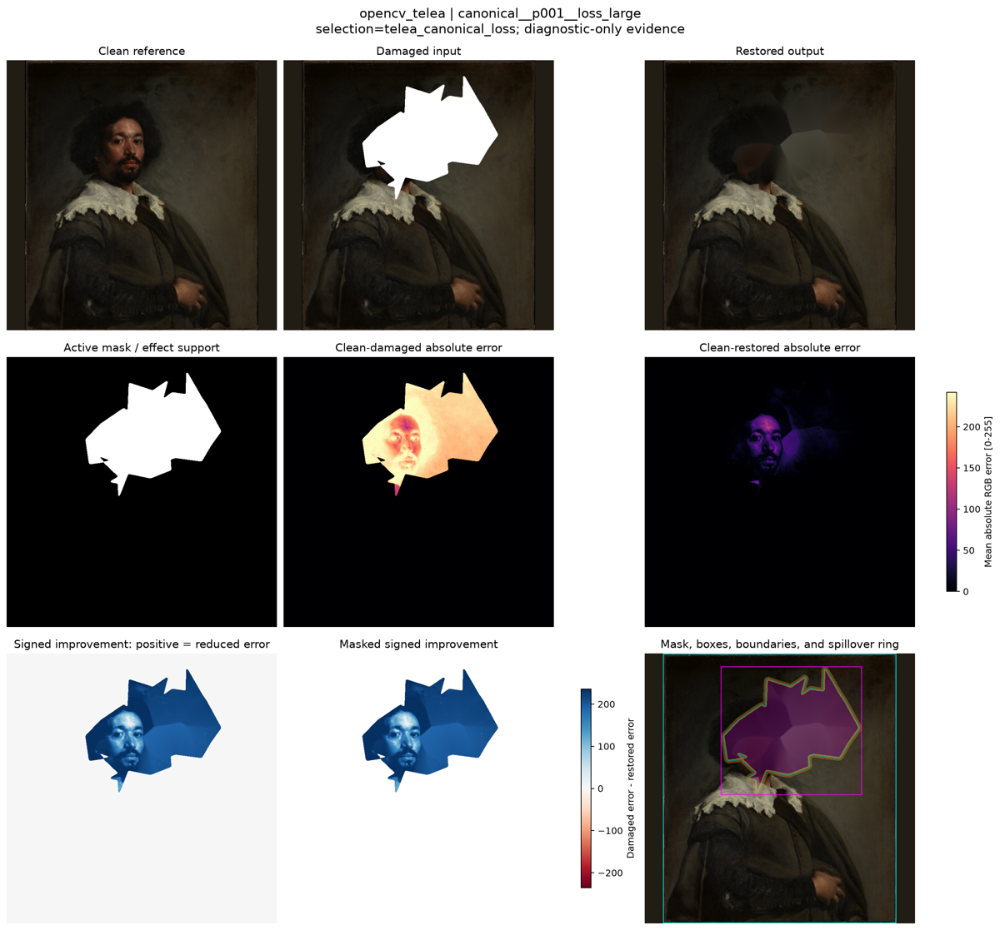

Smoke panel 2/7: lama_canonical_loss


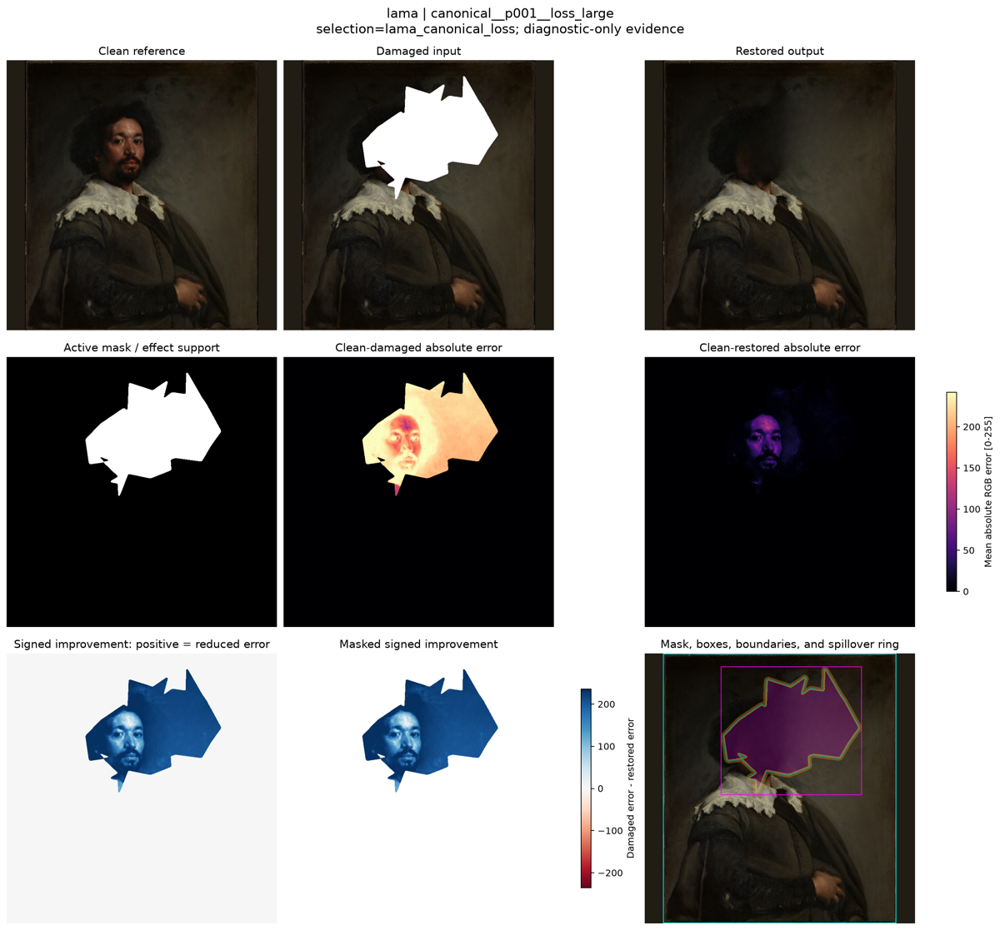

Smoke panel 3/7: hint_canonical_loss


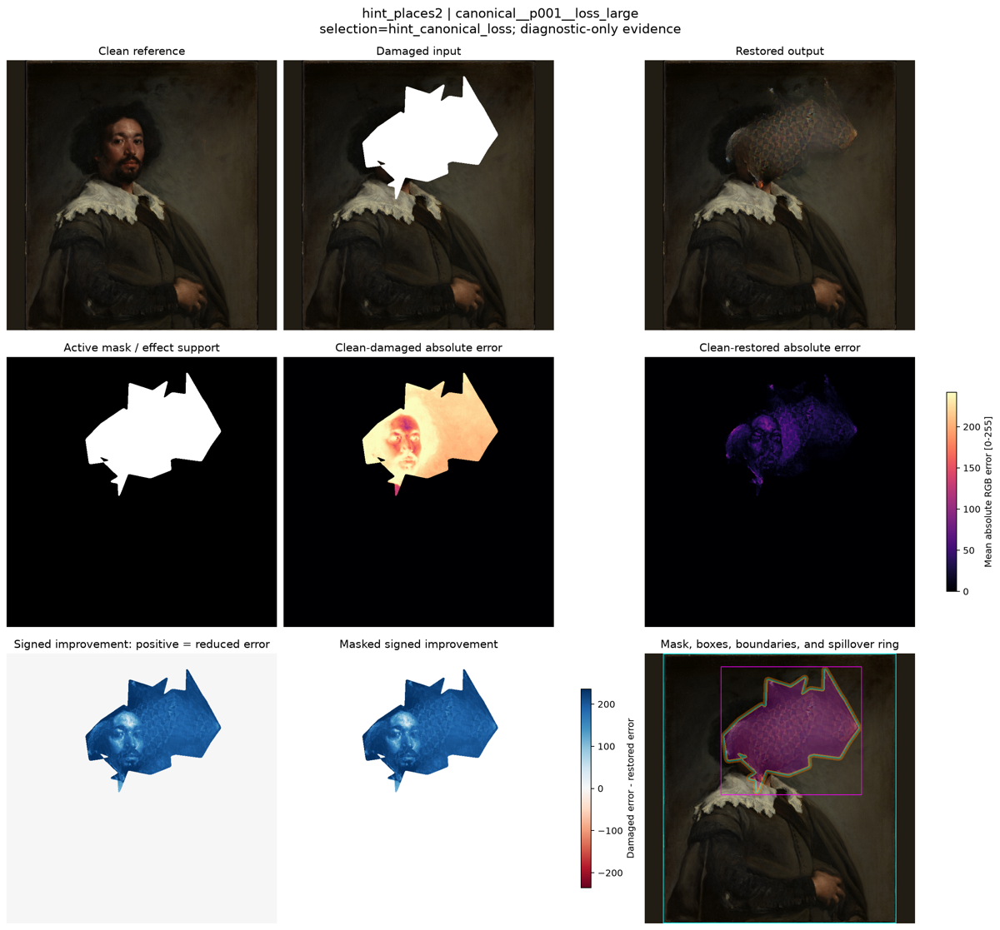

Smoke panel 4/7: stable_diffusion_scratch_generic


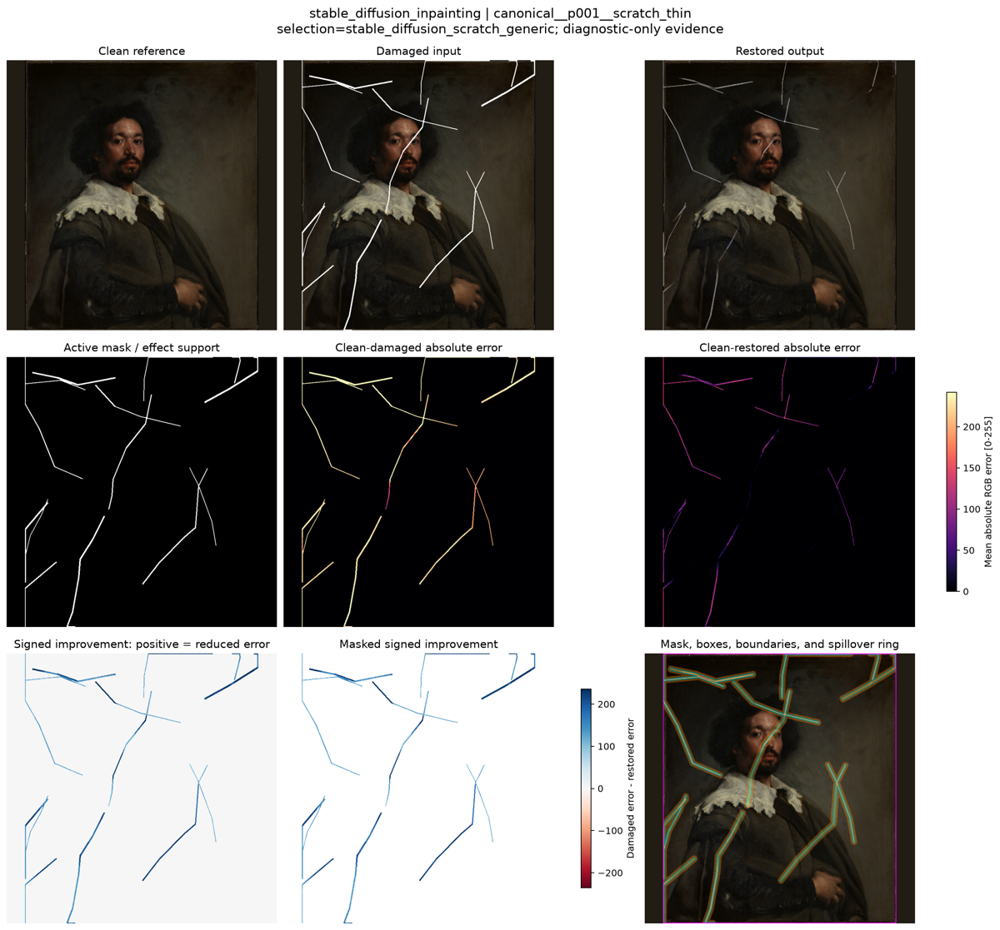

Smoke panel 5/7: stable_diffusion_scratch_aware


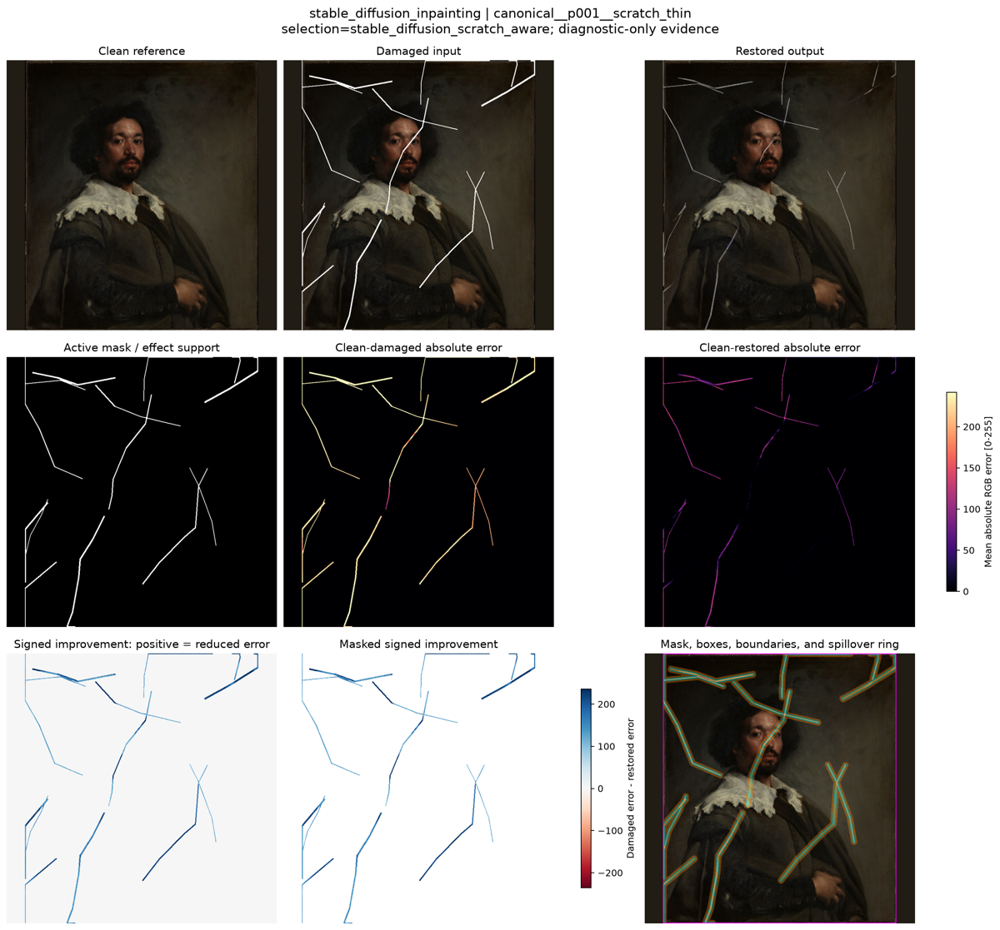

Smoke panel 6/7: sdxl_canonical_loss


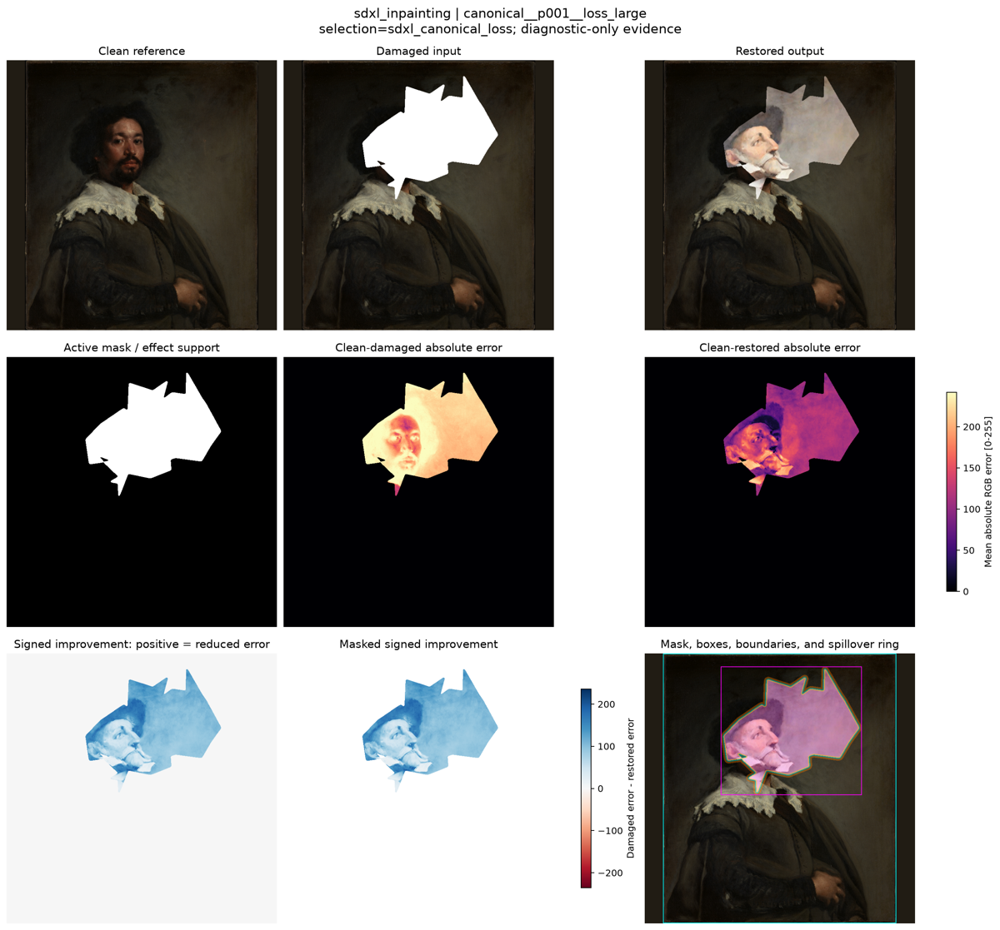

Smoke panel 7/7: lama_synthetic_water_stain


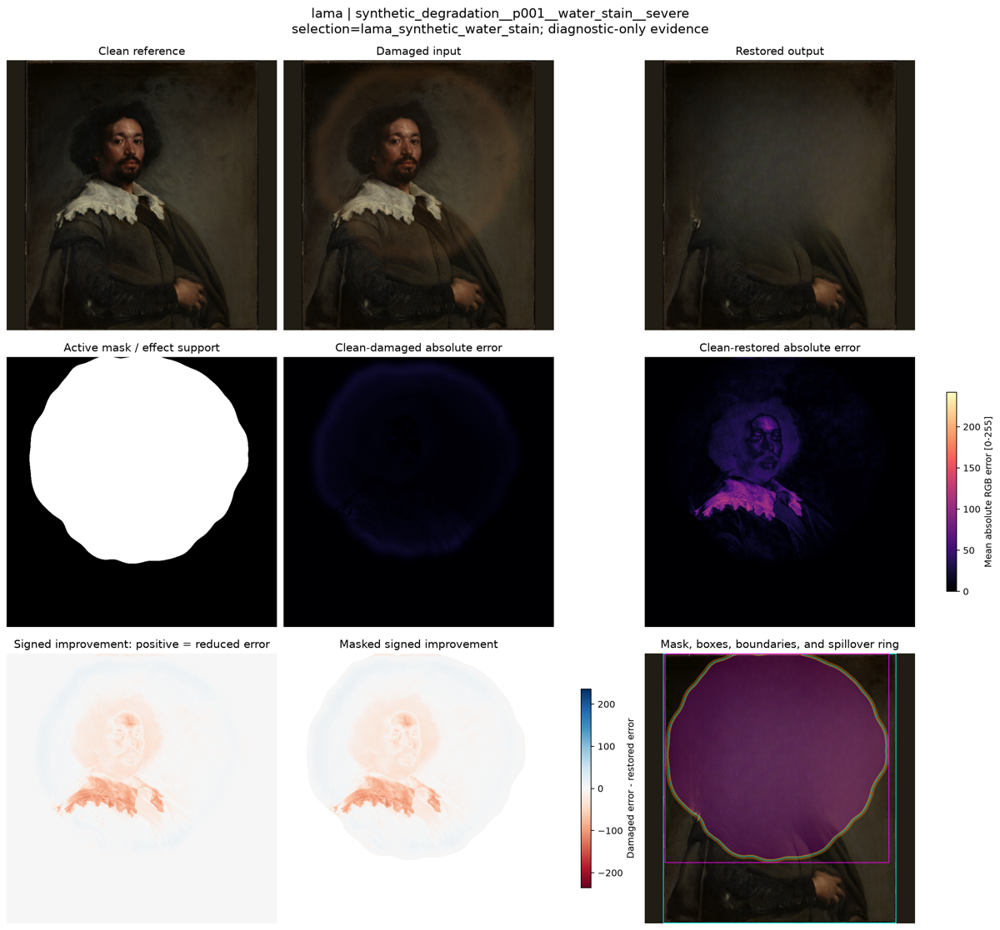

,smoke_role,candidate_id,model_id,case_id,relative_path,format,mode,width,height,size_bytes,sha256,status
0,telea_canonical_loss,candidate__opencv_telea__canonical__p001__loss...,opencv_telea,canonical__p001__loss_large,outputs/16_difference_maps_and_spatial_diagnos...,PNG,RGBA,2719,2532,2792009,8aed12a39ba9cbbfd8d934cab3bedf035486441fb029e0...,passed
1,lama_canonical_loss,candidate__lama__canonical__p001__loss_large__c00,lama,canonical__p001__loss_large,outputs/16_difference_maps_and_spatial_diagnos...,PNG,RGBA,2719,2532,2847533,a1e5df577ddf2df7019aebb5b41d0e30cbefdf0d1f34d9...,passed
2,hint_canonical_loss,candidate__hint_places2__canonical__p001__loss...,hint_places2,canonical__p001__loss_large,outputs/16_difference_maps_and_spatial_diagnos...,PNG,RGBA,2719,2532,2989020,0007269eee0a1efc30aa29001570215d729cb2b9f09744...,passed
3,stable_diffusion_scratch_generic,sd15__p00__s2026__b039817c7170,stable_diffusion_inpainting,canonical__p001__scratch_thin,outputs/16_difference_maps_and_spatial_diagnos...,PNG,RGBA,2719,2532,2814242,4814605bda03f87bee40a72b85e5f93b996dd30c03da53...,passed
4,stable_diffusion_scratch_aware,sd15__p05__s2026__b0c01d8159c0,stable_diffusion_inpainting,canonical__p001__scratch_thin,outputs/16_difference_maps_and_spatial_diagnos...,PNG,RGBA,2719,2532,2820215,266939ed6b27ae15eaff2f07909dc6a0789e79e985d661...,passed
5,sdxl_canonical_loss,sdxl__a502c0783c0a__p00_generic__seed2026,sdxl_inpainting,canonical__p001__loss_large,outputs/16_difference_maps_and_spatial_diagnos...,PNG,RGBA,2719,2532,2925340,8f8d82c7bb73b84876dde82375976d59c6f0b9476d54b2...,passed
6,lama_synthetic_water_stain,candidate__lama__synthetic_degradation__p001__...,lama,synthetic_degradation__p001__water_stain__severe,outputs/16_difference_maps_and_spatial_diagnos...,PNG,RGBA,2719,2532,3701143,eeacb882e66bc1b5c576fd8241887e2a2a09232a8d07b7...,passed


Smoke-panel rendering complete.
Rendered panels: 7
Temporary panel root: outputs/16_difference_maps_and_spatial_diagnostics/work/batch_3_smoke_panels
Zero-control panels intentionally omitted: 1


In [13]:
# ---------------------------------------------------------------------------
# Render nonzero smoke-test panels
# ---------------------------------------------------------------------------

SMOKE_WORK_ROOT = (
    OUTPUT_DIRECTORIES["work"]
    / "batch_3_smoke_panels"
)

SMOKE_WORK_ROOT.mkdir(
    parents=True,
    exist_ok=True,
)

nonzero_smoke_worklist_df = (
    smoke_worklist_df.loc[
        ~smoke_worklist_df[
            "is_zero_control"
        ]
    ]
    .reset_index(drop=True)
)

smoke_panel_records = []

for number, row in enumerate(
    nonzero_smoke_worklist_df.to_dict(
        "records"
    ),
    start=1,
):
    candidate_id = str(row["candidate_id"])
    smoke_role = str(row["smoke_role"])

    panel_path = (
        SMOKE_WORK_ROOT
        / (
            f"{make_map_id(candidate_id)}"
            "_smoke_panel.png"
        )
    )

    figure = render_candidate_spatial_panel(
        row,
        project_root=PROJECT_ROOT,
        config=SPATIAL_CONFIG,
        scales=smoke_scales,
        output_path=panel_path,
        selection_role=smoke_role,
    )

    plt.close(figure)

    with PILImage.open(panel_path) as image:
        panel_width, panel_height = image.size
        panel_mode = image.mode

        preview = image.copy()
        preview.thumbnail(
            (1200, 1200)
        )

    smoke_panel_records.append(
        {
            "smoke_role": smoke_role,
            "candidate_id": candidate_id,
            "model_id": row["model_id"],
            "case_id": row["case_id"],
            "relative_path": to_repo_relative(
                panel_path,
                PROJECT_ROOT,
            ),
            "format": "PNG",
            "mode": panel_mode,
            "width": panel_width,
            "height": panel_height,
            "size_bytes": panel_path.stat().st_size,
            "sha256": sha256_file(panel_path),
            "status": "passed",
        }
    )

    print(
        f"Smoke panel {number}/"
        f"{len(nonzero_smoke_worklist_df)}: "
        f"{smoke_role}"
    )

    display(preview)

smoke_panel_audit_df = pd.DataFrame(
    smoke_panel_records
)

display(smoke_panel_audit_df)

print("Smoke-panel rendering complete.")
print(
    "Rendered panels:",
    len(smoke_panel_audit_df),
)
print(
    "Temporary panel root:",
    to_repo_relative(
        SMOKE_WORK_ROOT,
        PROJECT_ROOT,
    ),
)
print(
    "Zero-control panels intentionally omitted:",
    int(
        smoke_worklist_df[
            "is_zero_control"
        ].sum()
    ),
)

In [14]:
# ---------------------------------------------------------------------------
# Batch 3 validation
# ---------------------------------------------------------------------------

preserved_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_3_smoke_test"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_3_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_3_smoke_test",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_3_check(
    "smoke_candidate_count",
    "The bounded smoke test contains all eight declared candidates.",
    len(SMOKE_CANDIDATE_ROLES),
    len(smoke_worklist_df),
    (
        len(smoke_worklist_df)
        == len(SMOKE_CANDIDATE_ROLES)
    ),
)

add_batch_3_check(
    "smoke_model_coverage",
    "The smoke test covers all five restoration models.",
    sorted(
        EXPECTED_COUNTS[
            "candidates_by_model"
        ]
    ),
    sorted(
        smoke_worklist_df[
            "model_id"
        ].unique()
    ),
    (
        set(
            smoke_worklist_df[
                "model_id"
            ]
        )
        == set(
            EXPECTED_COUNTS[
                "candidates_by_model"
            ]
        )
    ),
)

add_batch_3_check(
    "smoke_map_id_uniqueness",
    "Smoke candidates retain collision-free short map identifiers.",
    len(smoke_worklist_df),
    smoke_worklist_df[
        "candidate_id"
    ].map(make_map_id).nunique(),
    (
        smoke_worklist_df[
            "candidate_id"
        ].map(make_map_id).nunique()
        == len(smoke_worklist_df)
    ),
)

add_batch_3_check(
    "smoke_diagnostic_validation",
    "Smoke diagnostic arithmetic and schemas pass.",
    True,
    smoke_diagnostic_validation,
    smoke_diagnostic_validation["passed"],
)

add_batch_3_check(
    "smoke_region_plan",
    "Smoke candidate-region applicability matches Notebook 13.",
    len(expected_smoke_region_plan_df),
    len(observed_smoke_region_plan_df),
    smoke_region_plan_matches,
)

observed_degradation_support_candidates = set(
    smoke_diagnostics_df.loc[
        smoke_diagnostics_df[
            "region_id"
        ].eq("degradation_support"),
        "candidate_id",
    ].astype(str)
)

expected_degradation_support_candidates = set(
    smoke_worklist_df.loc[
        smoke_worklist_df[
            "experiment_id"
        ].eq("synthetic_degradation"),
        "candidate_id",
    ].astype(str)
)

add_batch_3_check(
    "synthetic_only_degradation_support",
    "Degradation support appears only for synthetic candidates.",
    sorted(
        expected_degradation_support_candidates
    ),
    sorted(
        observed_degradation_support_candidates
    ),
    (
        observed_degradation_support_candidates
        == expected_degradation_support_candidates
    ),
)

zero_candidate_id = (
    smoke_worklist_df.loc[
        smoke_worklist_df[
            "is_zero_control"
        ],
        "candidate_id",
    ].iloc[0]
)

zero_result = smoke_results[
    zero_candidate_id
]

zero_map_maxima = {
    map_name: float(
        np.abs(map_values).max()
    )
    for map_name, map_values
    in zero_result.maps.items()
}

zero_region_ids = set(
    zero_result.diagnostics[
        "region_id"
    ].astype(str)
)

add_batch_3_check(
    "zero_control_maps",
    "Every zero-control floating-point map is exactly zero.",
    {
        map_name: 0.0
        for map_name in zero_map_maxima
    },
    zero_map_maxima,
    all(
        value == 0.0
        for value in zero_map_maxima.values()
    ),
)

add_batch_3_check(
    "zero_control_regions",
    "Zero controls retain only valid non-mask regions.",
    {
        "full_image",
        "content_region",
        "outside_mask_content",
    },
    zero_region_ids,
    (
        zero_region_ids
        == {
            "full_image",
            "content_region",
            "outside_mask_content",
        }
    ),
)

absolute_scale = smoke_scales[
    "absolute_error"
]

signed_scale = smoke_scales[
    "signed_improvement"
]

smoke_scale_contract_passed = bool(
    absolute_scale["vmin"] == 0.0
    and 0.0 < absolute_scale["vmax"] <= 255.0
    and signed_scale["vmin"] < 0.0
    and signed_scale["vmax"] > 0.0
    and np.isclose(
        abs(signed_scale["vmin"]),
        signed_scale["vmax"],
    )
    and signed_scale["center"] == 0.0
)

add_batch_3_check(
    "smoke_scale_contract",
    "Smoke scales are positive, bounded, and signed-symmetric.",
    True,
    smoke_scales,
    smoke_scale_contract_passed,
)

expected_panel_count = len(
    nonzero_smoke_worklist_df
)

valid_panel_count = int(
    (
        smoke_panel_audit_df[
            "status"
        ].eq("passed")
        & smoke_panel_audit_df[
            "size_bytes"
        ].gt(0)
        & smoke_panel_audit_df[
            "width"
        ].gt(0)
        & smoke_panel_audit_df[
            "height"
        ].gt(0)
    ).sum()
)

add_batch_3_check(
    "smoke_panel_assets",
    "Every nonzero smoke candidate has one valid rendered panel.",
    expected_panel_count,
    valid_panel_count,
    valid_panel_count == expected_panel_count,
)

smoke_paths_owned = bool(
    smoke_panel_audit_df[
        "relative_path"
    ]
    .astype(str)
    .str.startswith(
        (
            f"outputs/{NOTEBOOK_STEM}/"
            "work/batch_3_smoke_panels/"
        )
    )
    .all()
)

add_batch_3_check(
    "smoke_panel_ownership",
    "Every temporary smoke panel is notebook-owned.",
    True,
    smoke_paths_owned,
    smoke_paths_owned,
)


# ---------------------------------------------------------------------------
# Batch gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_3_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq("batch_3_smoke_test")
    ]
    .reset_index(drop=True)
)

display(batch_3_validation_df)

VALIDATION.raise_for_blocking()

print("Batch 3 bounded scientific smoke test passed.")
print(
    "Batch 3 validation checks:",
    len(batch_3_validation_df),
)
print(
    "Blocking failures across Batches 1–3:",
    len(VALIDATION.blocking_failures),
)
print(
    "Smoke diagnostic rows:",
    len(smoke_diagnostics_df),
)
print(
    "Rendered smoke panels:",
    len(smoke_panel_audit_df),
)
print(
    "No canonical Notebook 16 artifacts were persisted in Batch 3."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_3_smoke_test,smoke_candidate_count,The bounded smoke test contains all eight decl...,blocking,8,8,True,
1,batch_3_smoke_test,smoke_model_coverage,The smoke test covers all five restoration mod...,blocking,"[""hint_places2"", ""lama"", ""opencv_telea"", ""sdxl...","[""hint_places2"", ""lama"", ""opencv_telea"", ""sdxl...",True,
2,batch_3_smoke_test,smoke_map_id_uniqueness,Smoke candidates retain collision-free short m...,blocking,8,8,True,
3,batch_3_smoke_test,smoke_diagnostic_validation,Smoke diagnostic arithmetic and schemas pass.,blocking,True,"{""fraction_bounds_valid"": true, ""fraction_part...",True,
4,batch_3_smoke_test,smoke_region_plan,Smoke candidate-region applicability matches N...,blocking,67,67,True,
5,batch_3_smoke_test,synthetic_only_degradation_support,Degradation support appears only for synthetic...,blocking,"[""candidate__lama__synthetic_degradation__p001...","[""candidate__lama__synthetic_degradation__p001...",True,
6,batch_3_smoke_test,zero_control_maps,Every zero-control floating-point map is exact...,blocking,"{""damaged_absolute_error"": 0.0, ""restoration_c...","{""damaged_absolute_error"": 0.0, ""restoration_c...",True,
7,batch_3_smoke_test,zero_control_regions,Zero controls retain only valid non-mask regions.,blocking,"""{'content_region', 'outside_mask_content', 'f...","""{'content_region', 'outside_mask_content', 'f...",True,
8,batch_3_smoke_test,smoke_scale_contract,"Smoke scales are positive, bounded, and signed...",blocking,True,"{""absolute_error"": {""center"": NaN, ""cmap"": ""ma...",True,
9,batch_3_smoke_test,smoke_panel_assets,Every nonzero smoke candidate has one valid re...,blocking,7,7,True,


Batch 3 bounded scientific smoke test passed.
Batch 3 validation checks: 11
Blocking failures across Batches 1–3: 0
Smoke diagnostic rows: 67
Rendered smoke panels: 7
No canonical Notebook 16 artifacts were persisted in Batch 3.


## Batch 4 — Full-population global scale calibration

Canonical spatial maps must use common colour scales so that colours remain comparable across:

- models;
- paintings;
- damage categories;
- experiments;
- prompts;
- seeds.

This batch derives two global display scales from all 16,404 completed and technically valid candidates across the five restoration methods:

1. a nonnegative scale for damaged and restored absolute-error maps;
2. a zero-centred symmetric scale for signed-improvement maps.

Both limits use the configured 99.5th percentile of deterministic content-region samples. Extreme values remain available in the canonical floating-point statistics even when PNG visualization values are clipped.

The resulting scale checkpoint is temporary execution state, not an additional canonical summary table. A successfully completed checkpoint can be reused only when the candidate population, configuration, helper version and renderer version match exactly.

In [15]:
import hashlib
import time

from restoration_eval.error_maps import (
    write_dataframe_atomic,
)


# ---------------------------------------------------------------------------
# Reproducible candidate-scope identity
# ---------------------------------------------------------------------------

scale_scope_payload = (
    evaluation_worklist_df[
        [
            "candidate_id",
            "restored_sha256",
        ]
    ]
    .sort_values(
        "candidate_id",
        kind="stable",
    )
    .to_csv(
        index=False,
        lineterminator="\n",
    )
    .encode("utf-8")
)

SCALE_CANDIDATE_SCOPE_SHA256 = (
    hashlib.sha256(
        scale_scope_payload
    ).hexdigest()
)

GLOBAL_SCALE_CHECKPOINT_PATH = (
    OUTPUT_DIRECTORIES["work"]
    / "global_visualization_scales.csv"
)

SCALE_PROGRESS_INTERVAL = int(
    SPATIAL_CONFIG[
        "execution"
    ][
        "progress_interval_candidates"
    ]
)

EXPECTED_MAXIMUM_SAMPLED_VALUES = (
    len(evaluation_worklist_df)
    * int(
        SPATIAL_CONFIG[
            "visualization"
        ][
            "maximum_sampled_pixels_per_candidate"
        ]
    )
)

print("Global scale-calibration contract prepared.")
print(
    "Candidates:",
    len(evaluation_worklist_df),
)
print(
    "Progress interval:",
    SCALE_PROGRESS_INTERVAL,
)
print(
    "Maximum sampled values per scale:",
    EXPECTED_MAXIMUM_SAMPLED_VALUES,
)
print(
    "Candidate-scope SHA-256:",
    SCALE_CANDIDATE_SCOPE_SHA256,
)
print(
    "Checkpoint:",
    to_repo_relative(
        GLOBAL_SCALE_CHECKPOINT_PATH,
        PROJECT_ROOT,
    ),
)

Global scale-calibration contract prepared.
Candidates: 16404
Progress interval: 10
Maximum sampled values per scale: 67190784
Candidate-scope SHA-256: aea8fa1b085b82d3fc2f3d93e4a950392dd9b6d6142e81cd12b80fc9c4b6043a
Checkpoint: outputs/16_difference_maps_and_spatial_diagnostics/work/global_visualization_scales.csv


In [16]:
# ---------------------------------------------------------------------------
# Validate and optionally reuse a completed scale checkpoint
# ---------------------------------------------------------------------------

SCALE_CHECKPOINT_COLUMNS = [
    "scale_id",
    "cmap",
    "vmin",
    "vmax",
    "center",
    "percentile",
    "scale_scope",
    "sampled_value_count",
    "candidate_count",
    "candidate_scope_sha256",
    "config_sha256",
    "helper_sha256",
    "renderer_version",
    "created_at_utc",
]

scale_checkpoint_reused = False
scale_checkpoint_issue = ""

if GLOBAL_SCALE_CHECKPOINT_PATH.is_file():
    try:
        scale_checkpoint_df = pd.read_csv(
            GLOBAL_SCALE_CHECKPOINT_PATH
        )

        checkpoint_columns_valid = (
            list(scale_checkpoint_df.columns)
            == SCALE_CHECKPOINT_COLUMNS
        )

        checkpoint_scale_ids_valid = (
            set(
                scale_checkpoint_df[
                    "scale_id"
                ].astype(str)
            )
            == {
                "absolute_error",
                "signed_improvement",
            }
        )

        checkpoint_scope_valid = bool(
            scale_checkpoint_df[
                "candidate_count"
            ].eq(
                len(evaluation_worklist_df)
            ).all()
            and scale_checkpoint_df[
                "candidate_scope_sha256"
            ].astype(str).eq(
                SCALE_CANDIDATE_SCOPE_SHA256
            ).all()
            and scale_checkpoint_df[
                "config_sha256"
            ].astype(str).eq(
                CONFIGURATION_CHECKSUMS[
                    "spatial_diagnostics"
                ]
            ).all()
            and scale_checkpoint_df[
                "helper_sha256"
            ].astype(str).eq(
                HELPER_CHECKSUMS[
                    "error_maps_helper"
                ]
            ).all()
            and scale_checkpoint_df[
                "renderer_version"
            ].astype(str).eq(
                SPATIAL_MAP_RENDERER_VERSION
            ).all()
        )

        checkpoint_numeric_valid = bool(
            np.isfinite(
                pd.to_numeric(
                    scale_checkpoint_df[
                        "vmin"
                    ],
                    errors="coerce",
                )
            ).all()
            and np.isfinite(
                pd.to_numeric(
                    scale_checkpoint_df[
                        "vmax"
                    ],
                    errors="coerce",
                )
            ).all()
            and (
                pd.to_numeric(
                    scale_checkpoint_df[
                        "vmax"
                    ],
                    errors="coerce",
                )
                > pd.to_numeric(
                    scale_checkpoint_df[
                        "vmin"
                    ],
                    errors="coerce",
                )
            ).all()
        )

        scale_checkpoint_reused = bool(
            checkpoint_columns_valid
            and checkpoint_scale_ids_valid
            and checkpoint_scope_valid
            and checkpoint_numeric_valid
        )

        if not scale_checkpoint_reused:
            scale_checkpoint_issue = (
                "Existing checkpoint did not match the "
                "current candidate/config/helper contract."
            )

    except Exception as error:
        scale_checkpoint_df = pd.DataFrame(
            columns=SCALE_CHECKPOINT_COLUMNS
        )
        scale_checkpoint_issue = (
            f"{type(error).__name__}: {error}"
        )

else:
    scale_checkpoint_df = pd.DataFrame(
        columns=SCALE_CHECKPOINT_COLUMNS
    )
    scale_checkpoint_issue = (
        "No completed checkpoint was present."
    )

print(
    "Completed scale checkpoint reusable:",
    scale_checkpoint_reused,
)

if scale_checkpoint_issue:
    print(
        "Checkpoint note:",
        scale_checkpoint_issue,
    )

Completed scale checkpoint reusable: True


In [17]:
# ---------------------------------------------------------------------------
# Compute or restore canonical global scales
# ---------------------------------------------------------------------------

if scale_checkpoint_reused:
    global_scale_df = (
        scale_checkpoint_df.copy()
    )

    print(
        "Reusing the validated global-scale checkpoint."
    )

else:
    scale_started_at = time.perf_counter()
    last_progress_at = scale_started_at
    last_progress_completed = 0

    def global_scale_progress(
        completed,
        total,
    ):
        global last_progress_at
        global last_progress_completed

        if (
            completed % SCALE_PROGRESS_INTERVAL != 0
            and completed != total
        ):
            return

        now = time.perf_counter()
        elapsed = now - scale_started_at
        interval_elapsed = (
            now - last_progress_at
        )
        interval_completed = (
            completed
            - last_progress_completed
        )

        throughput = (
            completed / elapsed
            if elapsed > 0
            else float("nan")
        )

        interval_throughput = (
            interval_completed
            / interval_elapsed
            if interval_elapsed > 0
            else float("nan")
        )

        remaining = total - completed

        eta_seconds = (
            remaining / throughput
            if throughput > 0
            else float("nan")
        )

        latest_row = (
            evaluation_worklist_df.iloc[
                completed - 1
            ]
        )

        print(
            f"Global scale progress: "
            f"{completed}/{total} "
            f"({100.0 * completed / total:.1f}%) | "
            f"elapsed={elapsed / 60.0:.1f} min | "
            f"rate={throughput:.2f} candidates/s | "
            f"recent={interval_throughput:.2f} candidates/s | "
            f"ETA={eta_seconds / 60.0:.1f} min | "
            f"model={latest_row['model_id']} | "
            f"candidate={latest_row['candidate_id']}"
        )

        last_progress_at = now
        last_progress_completed = completed

    print(
        "Starting full-population global scale calibration."
    )

    global_scales = (
        compute_global_visualization_scales(
            evaluation_worklist_df,
            project_root=PROJECT_ROOT,
            config=SPATIAL_CONFIG,
            progress_callback=(
                global_scale_progress
            ),
        )
    )

    scale_completed_at_utc = utc_now_iso()
    scale_elapsed_seconds = (
        time.perf_counter()
        - scale_started_at
    )

    global_scale_df = pd.DataFrame(
        [
            {
                "scale_id": scale_id,
                "cmap": scale_definition[
                    "cmap"
                ],
                "vmin": scale_definition[
                    "vmin"
                ],
                "vmax": scale_definition[
                    "vmax"
                ],
                "center": scale_definition[
                    "center"
                ],
                "percentile": (
                    scale_definition[
                        "percentile"
                    ]
                ),
                "scale_scope": (
                    scale_definition[
                        "scale_scope"
                    ]
                ),
                "sampled_value_count": int(
                    scale_definition[
                        "sampled_value_count"
                    ]
                ),
                "candidate_count": len(
                    evaluation_worklist_df
                ),
                "candidate_scope_sha256": (
                    SCALE_CANDIDATE_SCOPE_SHA256
                ),
                "config_sha256": (
                    CONFIGURATION_CHECKSUMS[
                        "spatial_diagnostics"
                    ]
                ),
                "helper_sha256": (
                    HELPER_CHECKSUMS[
                        "error_maps_helper"
                    ]
                ),
                "renderer_version": (
                    SPATIAL_MAP_RENDERER_VERSION
                ),
                "created_at_utc": (
                    scale_completed_at_utc
                ),
            }
            for scale_id, scale_definition
            in global_scales.items()
        ],
        columns=SCALE_CHECKPOINT_COLUMNS,
    )

    write_dataframe_atomic(
        global_scale_df,
        GLOBAL_SCALE_CHECKPOINT_PATH,
    )

    print("Global scale calibration completed.")
    print(
        "Elapsed minutes:",
        round(
            scale_elapsed_seconds / 60.0,
            3,
        ),
    )
    print(
        "Checkpoint saved:",
        to_repo_relative(
            GLOBAL_SCALE_CHECKPOINT_PATH,
            PROJECT_ROOT,
        ),
    )


# ---------------------------------------------------------------------------
# Reconstruct the in-memory canonical scale mapping
# ---------------------------------------------------------------------------

global_scales = {}

for record in global_scale_df.to_dict(
    "records"
):
    center_value = record["center"]

    global_scales[
        str(record["scale_id"])
    ] = {
        "cmap": str(record["cmap"]),
        "vmin": float(record["vmin"]),
        "vmax": float(record["vmax"]),
        "center": (
            float(center_value)
            if pd.notna(center_value)
            else np.nan
        ),
        "percentile": float(
            record["percentile"]
        ),
        "scale_scope": str(
            record["scale_scope"]
        ),
        "sampled_value_count": int(
            record["sampled_value_count"]
        ),
    }

display(global_scale_df)

print("Canonical global scales are available.")
print(
    "Absolute-error limit:",
    global_scales[
        "absolute_error"
    ]["vmax"],
)
print(
    "Signed-improvement limits:",
    (
        global_scales[
            "signed_improvement"
        ]["vmin"],
        global_scales[
            "signed_improvement"
        ]["vmax"],
    ),
)
print(
    "Checkpoint reused:",
    scale_checkpoint_reused,
)

Reusing the validated global-scale checkpoint.


,scale_id,cmap,vmin,vmax,center,percentile,scale_scope,sampled_value_count,candidate_count,candidate_scope_sha256,config_sha256,helper_sha256,renderer_version,created_at_utc
0,absolute_error,magma,0.0,210.666672,NaN,99.5,all completed technically valid candidates,67190784,16404,aea8fa1b085b82d3fc2f3d93e4a950392dd9b6d6142e81...,3952657b569849b4c6fc17d27cb599c64571dfb6f84766...,594e116fb5a03df3d3de4cb6300ed8dbbea72793941dc9...,spatial_map_renderer.v1,2026-09-14T21:57:06.315365Z
1,signed_improvement,RdBu,-213.0,213.000000,0.0,99.5,all completed technically valid candidates,67190784,16404,aea8fa1b085b82d3fc2f3d93e4a950392dd9b6d6142e81...,3952657b569849b4c6fc17d27cb599c64571dfb6f84766...,594e116fb5a03df3d3de4cb6300ed8dbbea72793941dc9...,spatial_map_renderer.v1,2026-09-14T21:57:06.315365Z


Canonical global scales are available.
Absolute-error limit: 210.6666717529297
Signed-improvement limits: (-213.0, 213.0)
Checkpoint reused: True


In [18]:
# ---------------------------------------------------------------------------
# Batch 4 validation
# ---------------------------------------------------------------------------

preserved_checks = tuple(
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != "batch_4_global_scale_calibration"
)

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_4_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_4_global_scale_calibration"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_4_check(
    "global_scale_rows",
    "Exactly two canonical global scales are defined.",
    {
        "absolute_error",
        "signed_improvement",
    },
    set(global_scale_df["scale_id"]),
    (
        set(global_scale_df["scale_id"])
        == {
            "absolute_error",
            "signed_improvement",
        }
    ),
)

add_batch_4_check(
    "global_scale_candidate_scope",
    "Scale calibration covers all evaluated candidates.",
    EXPECTED_COUNTS["evaluated_candidates"],
    set(
        pd.to_numeric(
            global_scale_df[
                "candidate_count"
            ],
            errors="raise",
        ).astype(int)
    ),
    (
        set(
            pd.to_numeric(
                global_scale_df[
                    "candidate_count"
                ],
                errors="raise",
            ).astype(int)
        )
        == {
            EXPECTED_COUNTS[
                "evaluated_candidates"
            ]
        }
    ),
)

add_batch_4_check(
    "global_scale_scope_identity",
    "Scale checkpoint matches the exact candidate population.",
    SCALE_CANDIDATE_SCOPE_SHA256,
    set(
        global_scale_df[
            "candidate_scope_sha256"
        ].astype(str)
    ),
    (
        set(
            global_scale_df[
                "candidate_scope_sha256"
            ].astype(str)
        )
        == {
            SCALE_CANDIDATE_SCOPE_SHA256
        }
    ),
)

add_batch_4_check(
    "global_scale_provenance",
    "Scale checkpoint matches current config and helper checksums.",
    {
        "config_sha256": (
            CONFIGURATION_CHECKSUMS[
                "spatial_diagnostics"
            ]
        ),
        "helper_sha256": (
            HELPER_CHECKSUMS[
                "error_maps_helper"
            ]
        ),
    },
    {
        "config_sha256": sorted(
            set(
                global_scale_df[
                    "config_sha256"
                ].astype(str)
            )
        ),
        "helper_sha256": sorted(
            set(
                global_scale_df[
                    "helper_sha256"
                ].astype(str)
            )
        ),
    },
    (
        global_scale_df[
            "config_sha256"
        ].astype(str).eq(
            CONFIGURATION_CHECKSUMS[
                "spatial_diagnostics"
            ]
        ).all()
        and global_scale_df[
            "helper_sha256"
        ].astype(str).eq(
            HELPER_CHECKSUMS[
                "error_maps_helper"
            ]
        ).all()
    ),
)

absolute_scale = global_scales[
    "absolute_error"
]

signed_scale = global_scales[
    "signed_improvement"
]

add_batch_4_check(
    "absolute_scale_contract",
    "Absolute-error scale is finite and bounded by the RGB data range.",
    {
        "vmin": 0.0,
        "vmax_range": "(0, 255]",
        "cmap": SPATIAL_CONFIG[
            "visualization"
        ][
            "absolute_error"
        ]["cmap"],
    },
    absolute_scale,
    (
        absolute_scale["vmin"] == 0.0
        and np.isfinite(
            absolute_scale["vmax"]
        )
        and 0.0
        < absolute_scale["vmax"]
        <= 255.0
        and absolute_scale["cmap"]
        == SPATIAL_CONFIG[
            "visualization"
        ][
            "absolute_error"
        ]["cmap"]
    ),
)

add_batch_4_check(
    "signed_scale_contract",
    "Signed scale is finite, zero-centred, and symmetric.",
    {
        "center": 0.0,
        "symmetric": True,
        "cmap": SPATIAL_CONFIG[
            "visualization"
        ][
            "signed_improvement"
        ]["cmap"],
    },
    signed_scale,
    (
        np.isfinite(
            signed_scale["vmin"]
        )
        and np.isfinite(
            signed_scale["vmax"]
        )
        and signed_scale["vmin"] < 0.0
        and signed_scale["vmax"] > 0.0
        and signed_scale["center"] == 0.0
        and np.isclose(
            abs(signed_scale["vmin"]),
            signed_scale["vmax"],
        )
        and signed_scale["cmap"]
        == SPATIAL_CONFIG[
            "visualization"
        ][
            "signed_improvement"
        ]["cmap"]
    ),
)

sample_counts = {
    str(record["scale_id"]): int(
        record["sampled_value_count"]
    )
    for record in global_scale_df.to_dict(
        "records"
    )
}

add_batch_4_check(
    "global_scale_sample_counts",
    "Both scales contain bounded nonempty deterministic samples.",
    (
        f"1 through "
        f"{EXPECTED_MAXIMUM_SAMPLED_VALUES}"
    ),
    sample_counts,
    all(
        0 < count
        <= EXPECTED_MAXIMUM_SAMPLED_VALUES
        for count in sample_counts.values()
    ),
)

checkpoint_owned = bool(
    GLOBAL_SCALE_CHECKPOINT_PATH
    .resolve()
    .is_relative_to(
        NOTEBOOK_OUTPUT_ROOT.resolve()
    )
)

add_batch_4_check(
    "global_scale_checkpoint",
    "The reusable scale checkpoint exists and is notebook-owned.",
    {
        "exists": True,
        "owned": True,
    },
    {
        "exists": (
            GLOBAL_SCALE_CHECKPOINT_PATH.is_file()
        ),
        "owned": checkpoint_owned,
        "size_bytes": (
            GLOBAL_SCALE_CHECKPOINT_PATH.stat().st_size
            if GLOBAL_SCALE_CHECKPOINT_PATH.is_file()
            else 0
        ),
    },
    (
        GLOBAL_SCALE_CHECKPOINT_PATH.is_file()
        and GLOBAL_SCALE_CHECKPOINT_PATH.stat().st_size
        > 0
        and checkpoint_owned
    ),
)


# ---------------------------------------------------------------------------
# Batch gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_4_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq(
            "batch_4_global_scale_calibration"
        )
    ]
    .reset_index(drop=True)
)

display(batch_4_validation_df)

VALIDATION.raise_for_blocking()

print(
    "Batch 4 full-population global scale calibration passed."
)
print(
    "Batch 4 validation checks:",
    len(batch_4_validation_df),
)
print(
    "Blocking failures across Batches 1–4:",
    len(VALIDATION.blocking_failures),
)
print(
    "Candidate population calibrated:",
    len(evaluation_worklist_df),
)
print(
    "Canonical outputs persisted:",
    0,
)
print(
    "Temporary scale checkpoint persisted:",
    to_repo_relative(
        GLOBAL_SCALE_CHECKPOINT_PATH,
        PROJECT_ROOT,
    ),
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_4_global_scale_calibration,global_scale_rows,Exactly two canonical global scales are defined.,blocking,"""{'signed_improvement', 'absolute_error'}""","""{'signed_improvement', 'absolute_error'}""",True,
1,batch_4_global_scale_calibration,global_scale_candidate_scope,Scale calibration covers all evaluated candida...,blocking,16404,"""{16404}""",True,
2,batch_4_global_scale_calibration,global_scale_scope_identity,Scale checkpoint matches the exact candidate p...,blocking,aea8fa1b085b82d3fc2f3d93e4a950392dd9b6d6142e81...,"""{'aea8fa1b085b82d3fc2f3d93e4a950392dd9b6d6142...",True,
3,batch_4_global_scale_calibration,global_scale_provenance,Scale checkpoint matches current config and he...,blocking,"{""config_sha256"": ""3952657b569849b4c6fc17d27cb...","{""config_sha256"": [""3952657b569849b4c6fc17d27c...",True,
4,batch_4_global_scale_calibration,absolute_scale_contract,Absolute-error scale is finite and bounded by ...,blocking,"{""cmap"": ""magma"", ""vmax_range"": ""(0, 255]"", ""v...","{""center"": NaN, ""cmap"": ""magma"", ""percentile"":...",True,
5,batch_4_global_scale_calibration,signed_scale_contract,"Signed scale is finite, zero-centred, and symm...",blocking,"{""center"": 0.0, ""cmap"": ""RdBu"", ""symmetric"": t...","{""center"": 0.0, ""cmap"": ""RdBu"", ""percentile"": ...",True,
6,batch_4_global_scale_calibration,global_scale_sample_counts,Both scales contain bounded nonempty determini...,blocking,1 through 67190784,"{""absolute_error"": 67190784, ""signed_improveme...",True,
7,batch_4_global_scale_calibration,global_scale_checkpoint,The reusable scale checkpoint exists and is no...,blocking,"{""exists"": true, ""owned"": true}","{""exists"": true, ""owned"": true, ""size_bytes"": ...",True,


Batch 4 full-population global scale calibration passed.
Batch 4 validation checks: 8
Blocking failures across Batches 1–4: 0
Candidate population calibrated: 16404
Canonical outputs persisted: 0
Temporary scale checkpoint persisted: outputs/16_difference_maps_and_spatial_diagnostics/work/global_visualization_scales.csv


## Batch 5 — Full spatial-diagnostic and map execution

This batch computes the canonical spatial evidence for all 16,404 completed and technically valid candidates.

For each valid candidate-region pair, it records:

- damaged absolute-error statistics;
- restored absolute-error statistics;
- signed-improvement statistics;
- improved, worsened, and unchanged pixel fractions;
- restoration-change magnitude;
- changed-pixel fraction.

For each of the 15,204 nonzero candidates, it writes:

1. damaged absolute-error map;
2. restored absolute-error map;
3. signed-improvement map;
4. masked signed-improvement map;
5. reusable spatial overlay.

The 1,200 zero controls retain numerical diagnostics but do not receive redundant all-zero image assets.

Progress is printed every 10 candidates. Resumable CSV checkpoints are written every 100 candidates to avoid excessive repeated disk writes. If execution is interrupted, rerunning the full-execution cell validates and resumes the checkpoint.

In [19]:
import shutil
import time

from restoration_eval.error_maps import (
    run_spatial_diagnostics,
    validate_map_image_manifest,
)

from restoration_eval.schemas import (
    SPATIAL_DIAGNOSTICS_COLUMNS,
    SPATIAL_MAP_IMAGE_MANIFEST_COLUMNS,
)


# ---------------------------------------------------------------------------
# Full-execution paths and capacity
# ---------------------------------------------------------------------------

DIAGNOSTICS_CHECKPOINT_PATH = (
    WORK_PATHS["diagnostics_checkpoint"]
)

MAP_MANIFEST_CHECKPOINT_PATH = (
    WORK_PATHS["map_manifest_checkpoint"]
)

CANONICAL_MAPS_ROOT = OUTPUTS["maps_root"]

disk_usage = shutil.disk_usage(
    NOTEBOOK_OUTPUT_ROOT
)

disk_capacity_df = pd.DataFrame(
    [
        {
            "path": str(
                NOTEBOOK_OUTPUT_ROOT
            ),
            "total_gb": (
                disk_usage.total / (1024 ** 3)
            ),
            "used_gb": (
                disk_usage.used / (1024 ** 3)
            ),
            "free_gb": (
                disk_usage.free / (1024 ** 3)
            ),
        }
    ]
)


# ---------------------------------------------------------------------------
# Inspect any resumable checkpoint state
# ---------------------------------------------------------------------------

if DIAGNOSTICS_CHECKPOINT_PATH.is_file():
    existing_diagnostics_checkpoint_df = (
        pd.read_csv(
            DIAGNOSTICS_CHECKPOINT_PATH,
            low_memory=False,
        )
    )
else:
    existing_diagnostics_checkpoint_df = (
        pd.DataFrame(
            columns=SPATIAL_DIAGNOSTICS_COLUMNS
        )
    )

if MAP_MANIFEST_CHECKPOINT_PATH.is_file():
    existing_map_checkpoint_df = pd.read_csv(
        MAP_MANIFEST_CHECKPOINT_PATH,
        low_memory=False,
    )
else:
    existing_map_checkpoint_df = pd.DataFrame(
        columns=(
            SPATIAL_MAP_IMAGE_MANIFEST_COLUMNS
        )
    )

if (
    list(
        existing_diagnostics_checkpoint_df.columns
    )
    != list(SPATIAL_DIAGNOSTICS_COLUMNS)
):
    raise ValueError(
        "Existing diagnostics checkpoint has an "
        "incompatible column contract. Inspect or remove "
        "the Notebook 16 work checkpoint before continuing."
    )

if (
    list(existing_map_checkpoint_df.columns)
    != list(
        SPATIAL_MAP_IMAGE_MANIFEST_COLUMNS
    )
):
    raise ValueError(
        "Existing map-manifest checkpoint has an "
        "incompatible column contract. Inspect or remove "
        "the Notebook 16 work checkpoint before continuing."
    )


# ---------------------------------------------------------------------------
# Estimate genuinely reusable candidates
# ---------------------------------------------------------------------------

checkpoint_diagnostic_ids = set(
    existing_diagnostics_checkpoint_df[
        "candidate_id"
    ].astype(str)
)

checkpoint_map_types_by_candidate = {
    str(candidate_id): set(
        group["map_type"].astype(str)
    )
    for candidate_id, group in (
        existing_map_checkpoint_df.groupby(
            "candidate_id",
            dropna=True,
        )
    )
}

reusable_checkpoint_candidate_ids = set()

for row in evaluation_worklist_df.to_dict(
    "records"
):
    candidate_id = str(row["candidate_id"])

    if candidate_id not in checkpoint_diagnostic_ids:
        continue

    if bool(row["is_zero_control"]):
        reusable_checkpoint_candidate_ids.add(
            candidate_id
        )
        continue

    observed_map_types = (
        checkpoint_map_types_by_candidate.get(
            candidate_id,
            set(),
        )
    )

    if observed_map_types != set(
        CANDIDATE_MAP_TYPES
    ):
        continue

    candidate_manifest_rows = (
        existing_map_checkpoint_df.loc[
            existing_map_checkpoint_df[
                "candidate_id"
            ].astype(str).eq(candidate_id)
        ]
    )

    candidate_files_exist = bool(
        candidate_manifest_rows[
            "relative_path"
        ].map(
            lambda path: (
                PROJECT_ROOT
                / str(path)
            ).is_file()
        ).all()
    )

    if candidate_files_exist:
        reusable_checkpoint_candidate_ids.add(
            candidate_id
        )


execution_contract_df = pd.DataFrame(
    [
        {
            "scope": "evaluated candidates",
            "expected": EXPECTED_COUNTS[
                "evaluated_candidates"
            ],
            "checkpoint_observed": len(
                checkpoint_diagnostic_ids
            ),
            "reusable": len(
                reusable_checkpoint_candidate_ids
            ),
        },
        {
            "scope": "diagnostic rows",
            "expected": EXPECTED_COUNTS[
                "spatial_diagnostic_rows"
            ],
            "checkpoint_observed": len(
                existing_diagnostics_checkpoint_df
            ),
            "reusable": "derived by candidate",
        },
        {
            "scope": "candidate map images",
            "expected": EXPECTED_COUNTS[
                "candidate_map_images"
            ],
            "checkpoint_observed": len(
                existing_map_checkpoint_df
            ),
            "reusable": (
                len(
                    existing_map_checkpoint_df
                )
            ),
        },
    ]
)

display(disk_capacity_df)
display(execution_contract_df)

print("Full execution contract prepared.")
print(
    "Checkpoint-reusable candidates:",
    len(
        reusable_checkpoint_candidate_ids
    ),
)
print(
    "Candidates requiring execution:",
    (
        len(evaluation_worklist_df)
        - len(
            reusable_checkpoint_candidate_ids
        )
    ),
)
print(
    "Checkpoint interval:",
    SPATIAL_CONFIG[
        "execution"
    ][
        "checkpoint_interval_candidates"
    ],
)
print(
    "Progress interval:",
    SPATIAL_CONFIG[
        "execution"
    ][
        "progress_interval_candidates"
    ],
)

,path,total_gb,used_gb,free_gb
0,D:\Masters\FH\Thesis\painting-restoration-eval...,931.511715,114.726978,816.784737


,scope,expected,checkpoint_observed,reusable
0,evaluated candidates,16404,13100,13100
1,diagnostic rows,143247,110700,derived by candidate
2,candidate map images,76020,59500,59500


Full execution contract prepared.
Checkpoint-reusable candidates: 13100
Candidates requiring execution: 3304
Checkpoint interval: 100
Progress interval: 10


In [20]:
# ---------------------------------------------------------------------------
# Resumable full execution
# ---------------------------------------------------------------------------

FULL_EXECUTION_STARTED_AT_UTC = (
    utc_now_iso()
)

full_execution_started_at = (
    time.perf_counter()
)

progress_state = {
    "last_time": full_execution_started_at,
    "last_completed": 0,
}

FULL_PROGRESS_INTERVAL = int(
    SPATIAL_CONFIG[
        "execution"
    ][
        "progress_interval_candidates"
    ]
)


def full_execution_progress(
    completed,
    total,
    reused,
):
    if (
        completed % FULL_PROGRESS_INTERVAL != 0
        and completed != total
    ):
        return

    now = time.perf_counter()
    elapsed = (
        now - full_execution_started_at
    )

    interval_elapsed = (
        now - progress_state["last_time"]
    )

    interval_completed = (
        completed
        - progress_state[
            "last_completed"
        ]
    )

    throughput = (
        completed / elapsed
        if elapsed > 0
        else float("nan")
    )

    recent_throughput = (
        interval_completed
        / interval_elapsed
        if interval_elapsed > 0
        else float("nan")
    )

    remaining = total - completed

    eta_seconds = (
        remaining / throughput
        if throughput > 0
        else float("nan")
    )

    latest_row = (
        evaluation_worklist_df.iloc[
            completed - 1
        ]
    )

    expected_maps_through_position = int(
        (
            ~evaluation_worklist_df.iloc[
                :completed
            ][
                "is_zero_control"
            ]
        ).sum()
        * len(CANDIDATE_MAP_TYPES)
    )

    print(
        f"Spatial execution progress: "
        f"{completed}/{total} "
        f"({100.0 * completed / total:.1f}%) | "
        f"elapsed={elapsed / 60.0:.1f} min | "
        f"rate={throughput:.2f} candidates/s | "
        f"recent={recent_throughput:.2f} candidates/s | "
        f"ETA={eta_seconds / 60.0:.1f} min | "
        f"reused_at_start={reused} | "
        f"expected_maps_through_position="
        f"{expected_maps_through_position} | "
        f"model={latest_row['model_id']} | "
        f"candidate={latest_row['candidate_id']}"
    )

    progress_state["last_time"] = now
    progress_state[
        "last_completed"
    ] = completed


try:
    print(
        "Starting/resuming full Notebook 16 execution."
    )

    full_execution_result = (
        run_spatial_diagnostics(
            evaluation_worklist_df,
            project_root=PROJECT_ROOT,
            maps_root=CANONICAL_MAPS_ROOT,
            config=SPATIAL_CONFIG,
            scales=global_scales,
            diagnostics_checkpoint_path=(
                DIAGNOSTICS_CHECKPOINT_PATH
            ),
            map_manifest_checkpoint_path=(
                MAP_MANIFEST_CHECKPOINT_PATH
            ),
            progress_callback=(
                full_execution_progress
            ),
        )
    )

except Exception as error:
    print(
        "Full execution stopped:",
        f"{type(error).__name__}: {error}",
    )

    if DIAGNOSTICS_CHECKPOINT_PATH.is_file():
        partial_diagnostics_df = pd.read_csv(
            DIAGNOSTICS_CHECKPOINT_PATH,
            low_memory=False,
        )

        print(
            "Checkpointed diagnostic rows:",
            len(partial_diagnostics_df),
        )

        print(
            "Checkpointed candidates:",
            partial_diagnostics_df[
                "candidate_id"
            ].nunique(),
        )

    if MAP_MANIFEST_CHECKPOINT_PATH.is_file():
        partial_map_manifest_df = (
            pd.read_csv(
                MAP_MANIFEST_CHECKPOINT_PATH,
                low_memory=False,
            )
        )

        print(
            "Checkpointed map rows:",
            len(partial_map_manifest_df),
        )

    print(
        "Rerun this cell to validate and resume "
        "the checkpointed execution."
    )

    raise


# ---------------------------------------------------------------------------
# Basic completion gate before canonical persistence
# ---------------------------------------------------------------------------

spatial_diagnostics_df = (
    full_execution_result.diagnostics
)

map_images_df = (
    full_execution_result.map_images
)

execution_diagnostic_validation = (
    validate_spatial_diagnostics(
        spatial_diagnostics_df,
        expected_candidate_ids=(
            evaluation_worklist_df[
                "candidate_id"
            ]
        ),
    )
)

execution_map_validation = (
    validate_map_image_manifest(
        map_images_df,
        project_root=PROJECT_ROOT,
        verify_checksums=False,
    )
)

basic_completion_errors = []

if (
    full_execution_result.completed_candidates
    != EXPECTED_COUNTS[
        "evaluated_candidates"
    ]
):
    basic_completion_errors.append(
        "candidate completion count mismatch"
    )

if (
    len(spatial_diagnostics_df)
    != EXPECTED_COUNTS[
        "spatial_diagnostic_rows"
    ]
):
    basic_completion_errors.append(
        "spatial diagnostic row-count mismatch"
    )

if (
    len(map_images_df)
    != EXPECTED_COUNTS[
        "candidate_map_images"
    ]
):
    basic_completion_errors.append(
        "candidate map row-count mismatch"
    )

if not execution_diagnostic_validation[
    "passed"
]:
    basic_completion_errors.append(
        "spatial diagnostic validation failed"
    )

if not execution_map_validation["passed"]:
    basic_completion_errors.append(
        "map manifest validation failed"
    )

if basic_completion_errors:
    raise RuntimeError(
        "Full execution did not pass its basic "
        f"completion gate: {basic_completion_errors}"
    )


# ---------------------------------------------------------------------------
# Persist canonical normalized tables only after success
# ---------------------------------------------------------------------------

write_dataframe_atomic(
    spatial_diagnostics_df,
    OUTPUTS["spatial_diagnostics"],
)

write_dataframe_atomic(
    map_images_df,
    OUTPUTS["map_manifest"],
)

FULL_EXECUTION_COMPLETED_AT_UTC = (
    utc_now_iso()
)

FULL_EXECUTION_ELAPSED_SECONDS = (
    time.perf_counter()
    - full_execution_started_at
)

print("Full Notebook 16 execution completed.")
print(
    "Completed candidates:",
    full_execution_result.completed_candidates,
)
print(
    "Candidates reused from checkpoint:",
    full_execution_result.reused_candidates,
)
print(
    "Spatial diagnostic rows:",
    len(spatial_diagnostics_df),
)
print(
    "Candidate map rows:",
    len(map_images_df),
)
print(
    "Elapsed minutes:",
    round(
        FULL_EXECUTION_ELAPSED_SECONDS
        / 60.0,
        3,
    ),
)
print(
    "Canonical diagnostics:",
    to_repo_relative(
        OUTPUTS["spatial_diagnostics"],
        PROJECT_ROOT,
    ),
)
print(
    "Canonical map manifest:",
    to_repo_relative(
        OUTPUTS["map_manifest"],
        PROJECT_ROOT,
    ),
)

Starting/resuming full Notebook 16 execution.
Spatial execution progress: 10/16404 (0.1%) | elapsed=6.2 min | rate=0.03 candidates/s | recent=0.03 candidates/s | ETA=10195.7 min | reused_at_start=13100 | expected_maps_through_position=50 | model=hint_places2 | candidate=candidate__hint_places2__canonical__p001__mixed_damage__c00
Spatial execution progress: 20/16404 (0.1%) | elapsed=6.2 min | rate=0.05 candidates/s | recent=6012.51 candidates/s | ETA=5094.8 min | reused_at_start=13100 | expected_maps_through_position=100 | model=opencv_telea | candidate=candidate__opencv_telea__canonical__p001__scratch_thin__c00
Spatial execution progress: 30/16404 (0.2%) | elapsed=6.2 min | rate=0.08 candidates/s | recent=5569.48 candidates/s | ETA=3394.5 min | reused_at_start=13100 | expected_maps_through_position=140 | model=lama | candidate=candidate__lama__canonical__p001__zero_control__c00
Spatial execution progress: 40/16404 (0.2%) | elapsed=6.2 min | rate=0.11 candidates/s | recent=8401.95 candi

In [21]:
# ---------------------------------------------------------------------------
# Reload canonical tables to validate serialization
# ---------------------------------------------------------------------------

spatial_diagnostics_df = pd.read_csv(
    OUTPUTS["spatial_diagnostics"],
    low_memory=False,
)

map_images_df = pd.read_csv(
    OUTPUTS["map_manifest"],
    low_memory=False,
)

reloaded_diagnostic_validation = (
    validate_spatial_diagnostics(
        spatial_diagnostics_df,
        expected_candidate_ids=(
            evaluation_worklist_df[
                "candidate_id"
            ]
        ),
    )
)

reloaded_map_validation = (
    validate_map_image_manifest(
        map_images_df,
        project_root=PROJECT_ROOT,
        verify_checksums=False,
    )
)


# ---------------------------------------------------------------------------
# Candidate-region reconciliation
# ---------------------------------------------------------------------------

observed_execution_region_plan_df = (
    spatial_diagnostics_df[
        [
            "candidate_id",
            "region_id",
            "region_pixel_count",
        ]
    ]
    .sort_values(
        [
            "candidate_id",
            "region_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

expected_execution_region_plan_df = (
    classical_region_plan_df[
        [
            "candidate_id",
            "region_id",
            "region_pixel_count",
        ]
    ]
    .sort_values(
        [
            "candidate_id",
            "region_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

execution_region_plan_matches = (
    observed_execution_region_plan_df.equals(
        expected_execution_region_plan_df
    )
)


# ---------------------------------------------------------------------------
# Map population and filesystem reconciliation
# ---------------------------------------------------------------------------

nonzero_candidate_ids = set(
    evaluation_worklist_df.loc[
        ~evaluation_worklist_df[
            "is_zero_control"
        ],
        "candidate_id",
    ].astype(str)
)

zero_candidate_ids = set(
    evaluation_worklist_df.loc[
        evaluation_worklist_df[
            "is_zero_control"
        ],
        "candidate_id",
    ].astype(str)
)

manifest_candidate_ids = set(
    map_images_df[
        "candidate_id"
    ].astype(str)
)

candidate_map_type_counts_df = (
    map_images_df
    .groupby(
        [
            "candidate_id",
            "model_id",
        ],
        as_index=False,
    )
    .agg(
        map_rows=(
            "map_image_id",
            "size",
        ),
        map_types=(
            "map_type",
            "nunique",
        ),
    )
)

map_type_summary_df = (
    map_images_df
    .groupby(
        [
            "map_type",
            "image_mode",
            "format",
        ],
        as_index=False,
    )
    .agg(
        images=(
            "map_image_id",
            "size",
        ),
        total_size_bytes=(
            "size_bytes",
            "sum",
        ),
    )
)

model_map_summary_df = (
    map_images_df
    .groupby(
        "model_id",
        as_index=False,
    )
    .agg(
        candidate_maps=(
            "map_image_id",
            "size",
        ),
        candidates=(
            "candidate_id",
            "nunique",
        ),
        total_size_bytes=(
            "size_bytes",
            "sum",
        ),
    )
    .sort_values(
        "model_id",
        kind="stable",
    )
    .reset_index(drop=True)
)

expected_maps_by_model = (
    evaluation_worklist_df.loc[
        ~evaluation_worklist_df[
            "is_zero_control"
        ]
    ]
    .groupby("model_id")
    .size()
    .mul(len(CANDIDATE_MAP_TYPES))
    .astype(int)
    .to_dict()
)

observed_maps_by_model = (
    map_images_df[
        "model_id"
    ]
    .value_counts()
    .astype(int)
    .to_dict()
)

manifest_relative_paths = set(
    map_images_df[
        "relative_path"
    ].astype(str)
)

disk_relative_paths = {
    path.relative_to(
        PROJECT_ROOT
    ).as_posix()
    for path in (
        CANONICAL_MAPS_ROOT.rglob("*.png")
    )
}


# ---------------------------------------------------------------------------
# Batch 5 validation
# ---------------------------------------------------------------------------

def add_batch_5_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            "batch_5_full_execution"
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_5_check(
    "canonical_diagnostic_rows",
    "Canonical diagnostics contain the approved candidate-region rows.",
    EXPECTED_COUNTS[
        "spatial_diagnostic_rows"
    ],
    len(spatial_diagnostics_df),
    (
        len(spatial_diagnostics_df)
        == EXPECTED_COUNTS[
            "spatial_diagnostic_rows"
        ]
    ),
)

add_batch_5_check(
    "canonical_diagnostic_validation",
    "Reloaded diagnostics satisfy schema and arithmetic checks.",
    True,
    reloaded_diagnostic_validation,
    reloaded_diagnostic_validation["passed"],
)

add_batch_5_check(
    "canonical_region_plan",
    "Notebook 16 reproduces Notebook 13’s valid-region plan exactly.",
    len(
        expected_execution_region_plan_df
    ),
    len(
        observed_execution_region_plan_df
    ),
    execution_region_plan_matches,
)

add_batch_5_check(
    "candidate_map_rows",
    "The normalized map manifest contains every expected candidate map.",
    EXPECTED_COUNTS[
        "candidate_map_images"
    ],
    len(map_images_df),
    (
        len(map_images_df)
        == EXPECTED_COUNTS[
            "candidate_map_images"
        ]
    ),
)

add_batch_5_check(
    "candidate_map_manifest_validation",
    "Map metadata and linked PNG assets satisfy their schema.",
    True,
    reloaded_map_validation,
    reloaded_map_validation["passed"],
)

add_batch_5_check(
    "nonzero_candidate_map_coverage",
    "Every nonzero candidate has map assets.",
    nonzero_candidate_ids,
    manifest_candidate_ids,
    (
        manifest_candidate_ids
        == nonzero_candidate_ids
    ),
)

add_batch_5_check(
    "zero_control_map_omission",
    "Zero controls have no redundant candidate-map assets.",
    set(),
    (
        manifest_candidate_ids
        & zero_candidate_ids
    ),
    not (
        manifest_candidate_ids
        & zero_candidate_ids
    ),
)

invalid_candidate_map_counts = (
    candidate_map_type_counts_df.loc[
        (
            candidate_map_type_counts_df[
                "map_rows"
            ].ne(
                len(CANDIDATE_MAP_TYPES)
            )
        )
        | (
            candidate_map_type_counts_df[
                "map_types"
            ].ne(
                len(CANDIDATE_MAP_TYPES)
            )
        )
    ]
)

add_batch_5_check(
    "five_maps_per_nonzero_candidate",
    "Every nonzero candidate has exactly five distinct map types.",
    0,
    len(invalid_candidate_map_counts),
    invalid_candidate_map_counts.empty,
)

add_batch_5_check(
    "map_counts_by_model",
    "Map-image counts reconcile with each model’s nonzero scope.",
    expected_maps_by_model,
    observed_maps_by_model,
    (
        observed_maps_by_model
        == expected_maps_by_model
    ),
)

add_batch_5_check(
    "map_filesystem_reconciliation",
    "Map manifest and on-disk PNG population match exactly.",
    manifest_relative_paths,
    disk_relative_paths,
    (
        manifest_relative_paths
        == disk_relative_paths
    ),
)

expected_image_mode_counts = {
    "P": (
        EXPECTED_COUNTS[
            "nonzero_candidates"
        ]
        * 4
    ),
    "RGBA": EXPECTED_COUNTS[
        "nonzero_candidates"
    ],
}

observed_image_mode_counts = (
    map_images_df[
        "image_mode"
    ]
    .value_counts()
    .astype(int)
    .to_dict()
)

add_batch_5_check(
    "map_image_modes",
    "Numeric maps are indexed and overlays retain RGBA transparency.",
    expected_image_mode_counts,
    observed_image_mode_counts,
    (
        observed_image_mode_counts
        == expected_image_mode_counts
    ),
)

invalid_manifest_sizes = int(
    (
        pd.to_numeric(
            map_images_df[
                "size_bytes"
            ],
            errors="coerce",
        )
        .fillna(0)
        .le(0)
    ).sum()
)

add_batch_5_check(
    "map_image_sizes",
    "Every persisted map has a positive file size.",
    0,
    invalid_manifest_sizes,
    invalid_manifest_sizes == 0,
)

maximum_absolute_path_length = max(
    len(
        str(
            (
                PROJECT_ROOT
                / relative_path
            ).resolve()
        )
    )
    for relative_path
    in manifest_relative_paths
)

add_batch_5_check(
    "map_path_lengths",
    "Canonical map paths remain below a conservative Windows limit.",
    "< 240 characters",
    maximum_absolute_path_length,
    maximum_absolute_path_length < 240,
)


# ---------------------------------------------------------------------------
# Batch gate and review tables
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_5_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq(
            "batch_5_full_execution"
        )
    ]
    .reset_index(drop=True)
)

display(model_map_summary_df)
display(map_type_summary_df)
display(batch_5_validation_df)

VALIDATION.raise_for_blocking()

print(
    "Batch 5 full spatial execution passed."
)
print(
    "Batch 5 validation checks:",
    len(batch_5_validation_df),
)
print(
    "Blocking failures across Batches 1–5:",
    len(VALIDATION.blocking_failures),
)
print(
    "Canonical diagnostic rows:",
    len(spatial_diagnostics_df),
)
print(
    "Canonical candidate-map images:",
    len(map_images_df),
)
print(
    "Candidates reused from checkpoint:",
    full_execution_result.reused_candidates,
)
print(
    "Maximum absolute map path length:",
    maximum_absolute_path_length,
)

,model_id,candidate_maps,candidates,total_size_bytes
0,hint_places2,11600,2320,353577276
1,lama,11600,2320,337284277
2,opencv_telea,11600,2320,326972232
3,sdxl_inpainting,120,24,5346182
4,stable_diffusion_inpainting,41100,8220,1257487854


,map_type,image_mode,format,images,total_size_bytes
0,damaged_absolute_error,P,PNG,15204,433534729
1,masked_signed_improvement,P,PNG,15204,524227103
2,restored_absolute_error,P,PNG,15204,606753602
3,signed_improvement,P,PNG,15204,534866991
4,spatial_overlay,RGBA,PNG,15204,181285396


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_5_full_execution,canonical_diagnostic_rows,Canonical diagnostics contain the approved can...,blocking,143247,143247,True,
1,batch_5_full_execution,canonical_diagnostic_validation,Reloaded diagnostics satisfy schema and arithm...,blocking,True,"{""fraction_bounds_valid"": true, ""fraction_part...",True,
2,batch_5_full_execution,canonical_region_plan,Notebook 16 reproduces Notebook 13’s valid-reg...,blocking,143247,143247,True,
3,batch_5_full_execution,candidate_map_rows,The normalized map manifest contains every exp...,blocking,76020,76020,True,
4,batch_5_full_execution,candidate_map_manifest_validation,Map metadata and linked PNG assets satisfy the...,blocking,True,"{""checksum_mismatch_count"": 0, ""checksum_misma...",True,
5,batch_5_full_execution,nonzero_candidate_map_coverage,Every nonzero candidate has map assets.,blocking,"""{'sd15__p00__s2026__1f4095f3b8de', 'sd15__p00...","""{'sd15__p00__s2026__1f4095f3b8de', 'sd15__p00...",True,
6,batch_5_full_execution,zero_control_map_omission,Zero controls have no redundant candidate-map ...,blocking,"""set()""","""set()""",True,
7,batch_5_full_execution,five_maps_per_nonzero_candidate,Every nonzero candidate has exactly five disti...,blocking,0,0,True,
8,batch_5_full_execution,map_counts_by_model,Map-image counts reconcile with each model’s n...,blocking,"{""hint_places2"": 11600, ""lama"": 11600, ""opencv...","{""hint_places2"": 11600, ""lama"": 11600, ""opencv...",True,
9,batch_5_full_execution,map_filesystem_reconciliation,Map manifest and on-disk PNG population match ...,blocking,"""{'outputs/16_difference_maps_and_spatial_diag...","""{'outputs/16_difference_maps_and_spatial_diag...",True,


Batch 5 full spatial execution passed.
Batch 5 validation checks: 13
Blocking failures across Batches 1–5: 0
Canonical diagnostic rows: 143247
Canonical candidate-map images: 76020
Candidates reused from checkpoint: 13100
Maximum absolute map path length: 188


## Batch 6 — Spatial evidence analysis and deterministic representative selection

This batch analyzes the canonical spatial diagnostics without converting diagnostic indicators into final trustworthiness decisions.

It:

- summarizes masked, boundary, and outside-boundary behaviour by model;
- identifies diagnostic-only QA indicators such as net masked worsening and spillover;
- summarizes the Stable Diffusion thin-scratch prompt ablation;
- selects two candidate-level representatives per model:
  - the candidate nearest the model’s median masked improvement;
  - the candidate with the highest masked worsened-pixel fraction;
- selects one cross-model case for each approved damage group:
  - small or localized loss;
  - thin scratch;
  - large or structural loss;
  - synthetic degradation.

Cross-model cases maximize the spread in primary-candidate masked signed improvement. Selection is deterministic, with case and candidate identifiers used as tie-breakers.

No new canonical output is persisted in this batch. The selected panels and their manifest records are generated in Batch 7.

In [22]:
import matplotlib.pyplot as plt


# ---------------------------------------------------------------------------
# Normalize numerical analysis columns
# ---------------------------------------------------------------------------

ANALYSIS_NUMERIC_COLUMNS = [
    "region_pixel_count",
    "damaged_error_mean",
    "restored_error_mean",
    "signed_improvement_mean",
    "improved_pixel_fraction",
    "worsened_pixel_fraction",
    "unchanged_pixel_fraction",
    "restoration_change_mean",
    "restoration_change_p95",
    "restoration_change_max",
    "restoration_changed_pixel_fraction",
]

analysis_diagnostics_df = (
    spatial_diagnostics_df.copy()
)

for column in ANALYSIS_NUMERIC_COLUMNS:
    analysis_diagnostics_df[column] = (
        pd.to_numeric(
            analysis_diagnostics_df[column],
            errors="raise",
        )
    )

primary_execution_roles = set(
    SPATIAL_CONFIG[
        "representative_panels"
    ][
        "primary_comparison_execution_roles"
    ]
)

primary_nonzero_diagnostics_df = (
    analysis_diagnostics_df.loc[
        analysis_diagnostics_df[
            "execution_role"
        ].astype(str).isin(
            primary_execution_roles
        )
        & analysis_diagnostics_df[
            "is_zero_control"
        ].eq(False)
    ]
    .copy()
)


# ---------------------------------------------------------------------------
# Region-level descriptive summaries
# ---------------------------------------------------------------------------

model_region_summary_df = (
    primary_nonzero_diagnostics_df
    .groupby(
        [
            "model_id",
            "region_id",
        ],
        as_index=False,
    )
    .agg(
        candidates=(
            "candidate_id",
            "nunique",
        ),
        cases=(
            "case_id",
            "nunique",
        ),
        median_damaged_error=(
            "damaged_error_mean",
            "median",
        ),
        median_restored_error=(
            "restored_error_mean",
            "median",
        ),
        mean_signed_improvement=(
            "signed_improvement_mean",
            "mean",
        ),
        median_signed_improvement=(
            "signed_improvement_mean",
            "median",
        ),
        median_improved_pixel_fraction=(
            "improved_pixel_fraction",
            "median",
        ),
        median_worsened_pixel_fraction=(
            "worsened_pixel_fraction",
            "median",
        ),
        median_changed_pixel_fraction=(
            "restoration_changed_pixel_fraction",
            "median",
        ),
    )
    .sort_values(
        [
            "model_id",
            "region_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Candidate-level diagnostic evidence
# ---------------------------------------------------------------------------

candidate_identity_columns = [
    "candidate_id",
    "case_id",
    "model_id",
    "painting_id",
    "dataset_scope",
    "experiment_id",
    "damage_or_degradation_type",
    "candidate_index",
    "seed",
    "prompt_policy_id",
    "prompt_variant_id",
    "execution_role",
]

masked_primary_df = (
    primary_nonzero_diagnostics_df.loc[
        primary_nonzero_diagnostics_df[
            "region_id"
        ].eq("masked_region"),
        candidate_identity_columns
        + [
            "region_pixel_count",
            "damaged_error_mean",
            "restored_error_mean",
            "signed_improvement_mean",
            "improved_pixel_fraction",
            "worsened_pixel_fraction",
            "unchanged_pixel_fraction",
            "restoration_change_mean",
            "restoration_changed_pixel_fraction",
        ],
    ]
    .rename(
        columns={
            "region_pixel_count": (
                "masked_region_pixel_count"
            ),
            "damaged_error_mean": (
                "masked_damaged_error_mean"
            ),
            "restored_error_mean": (
                "masked_restored_error_mean"
            ),
            "signed_improvement_mean": (
                "masked_signed_improvement_mean"
            ),
            "improved_pixel_fraction": (
                "masked_improved_pixel_fraction"
            ),
            "worsened_pixel_fraction": (
                "masked_worsened_pixel_fraction"
            ),
            "unchanged_pixel_fraction": (
                "masked_unchanged_pixel_fraction"
            ),
            "restoration_change_mean": (
                "masked_restoration_change_mean"
            ),
            "restoration_changed_pixel_fraction": (
                "masked_restoration_changed_pixel_fraction"
            ),
        }
    )
)

boundary_primary_df = (
    primary_nonzero_diagnostics_df.loc[
        primary_nonzero_diagnostics_df[
            "region_id"
        ].eq("boundary_ring"),
        [
            "candidate_id",
            "signed_improvement_mean",
            "worsened_pixel_fraction",
            "restoration_change_mean",
        ],
    ]
    .rename(
        columns={
            "signed_improvement_mean": (
                "boundary_signed_improvement_mean"
            ),
            "worsened_pixel_fraction": (
                "boundary_worsened_pixel_fraction"
            ),
            "restoration_change_mean": (
                "boundary_restoration_change_mean"
            ),
        }
    )
)

outside_boundary_primary_df = (
    primary_nonzero_diagnostics_df.loc[
        primary_nonzero_diagnostics_df[
            "region_id"
        ].eq("outside_boundary_ring"),
        [
            "candidate_id",
            "restoration_change_mean",
            "restoration_changed_pixel_fraction",
        ],
    ]
    .rename(
        columns={
            "restoration_change_mean": (
                "outside_boundary_change_mean"
            ),
            "restoration_changed_pixel_fraction": (
                "outside_boundary_changed_pixel_fraction"
            ),
        }
    )
)

candidate_spatial_evidence_df = (
    masked_primary_df
    .merge(
        boundary_primary_df,
        on="candidate_id",
        how="left",
        validate="one_to_one",
    )
    .merge(
        outside_boundary_primary_df,
        on="candidate_id",
        how="left",
        validate="one_to_one",
    )
)

candidate_spatial_evidence_df[
    "qa_masked_net_worsening"
] = (
    candidate_spatial_evidence_df[
        "masked_signed_improvement_mean"
    ] < 0.0
)

candidate_spatial_evidence_df[
    "qa_masked_majority_worsened"
] = (
    candidate_spatial_evidence_df[
        "masked_worsened_pixel_fraction"
    ] > 0.5
)

candidate_spatial_evidence_df[
    "qa_boundary_net_worsening"
] = (
    candidate_spatial_evidence_df[
        "boundary_signed_improvement_mean"
    ] < 0.0
)

candidate_spatial_evidence_df[
    "qa_outside_boundary_change_detected"
] = (
    candidate_spatial_evidence_df[
        "outside_boundary_changed_pixel_fraction"
    ] > 0.0
)

candidate_spatial_evidence_df[
    "evidence_role"
] = SPATIAL_CONFIG[
    "evidence_policy"
][
    "evidence_role"
]

candidate_spatial_evidence_df[
    "is_final_trustworthiness_flag"
] = False


# ---------------------------------------------------------------------------
# Model-level diagnostic summary
# ---------------------------------------------------------------------------

model_spatial_summary_df = (
    candidate_spatial_evidence_df
    .groupby(
        "model_id",
        as_index=False,
    )
    .agg(
        primary_nonzero_candidates=(
            "candidate_id",
            "nunique",
        ),
        evaluated_cases=(
            "case_id",
            "nunique",
        ),
        mean_masked_improvement=(
            "masked_signed_improvement_mean",
            "mean",
        ),
        median_masked_improvement=(
            "masked_signed_improvement_mean",
            "median",
        ),
        median_masked_worsened_fraction=(
            "masked_worsened_pixel_fraction",
            "median",
        ),
        masked_net_worsening_fraction=(
            "qa_masked_net_worsening",
            "mean",
        ),
        masked_majority_worsened_fraction=(
            "qa_masked_majority_worsened",
            "mean",
        ),
        boundary_net_worsening_fraction=(
            "qa_boundary_net_worsening",
            "mean",
        ),
        median_outside_boundary_change=(
            "outside_boundary_changed_pixel_fraction",
            "median",
        ),
    )
    .sort_values(
        "model_id",
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Stable Diffusion thin-scratch prompt evidence
# ---------------------------------------------------------------------------

sd_scratch_spatial_ablation_df = (
    analysis_diagnostics_df.loc[
        analysis_diagnostics_df[
            "model_id"
        ].eq("stable_diffusion_inpainting")
        & analysis_diagnostics_df[
            "case_id"
        ].astype(str).str.contains(
            "__scratch_thin",
            regex=False,
        )
        & analysis_diagnostics_df[
            "region_id"
        ].eq("masked_region")
        & analysis_diagnostics_df[
            "is_zero_control"
        ].eq(False)
    ]
    .groupby(
        [
            "prompt_variant_id",
            "execution_role",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        candidates=(
            "candidate_id",
            "nunique",
        ),
        cases=(
            "case_id",
            "nunique",
        ),
        seeds=(
            "seed",
            "nunique",
        ),
        mean_masked_improvement=(
            "signed_improvement_mean",
            "mean",
        ),
        median_masked_improvement=(
            "signed_improvement_mean",
            "median",
        ),
        median_worsened_pixel_fraction=(
            "worsened_pixel_fraction",
            "median",
        ),
        net_worsening_fraction=(
            "signed_improvement_mean",
            lambda values: float(
                (values < 0.0).mean()
            ),
        ),
    )
    .sort_values(
        [
            "execution_role",
            "prompt_variant_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

display(model_spatial_summary_df)
display(model_region_summary_df)
display(sd_scratch_spatial_ablation_df)

print("Diagnostic-only spatial analysis assembled.")
print(
    "Primary nonzero candidate evidence rows:",
    len(candidate_spatial_evidence_df),
)
print(
    "Model-region summary rows:",
    len(model_region_summary_df),
)
print(
    "Stable Diffusion scratch variants:",
    len(sd_scratch_spatial_ablation_df),
)
print(
    "Final trustworthiness flags created:",
    int(
        candidate_spatial_evidence_df[
            "is_final_trustworthiness_flag"
        ].sum()
    ),
)

,model_id,primary_nonzero_candidates,evaluated_cases,mean_masked_improvement,median_masked_improvement,median_masked_worsened_fraction,masked_net_worsening_fraction,masked_majority_worsened_fraction,boundary_net_worsening_fraction,median_outside_boundary_change
0,hint_places2,2320,2320,115.440073,130.707361,0.002527,0.133190,0.130603,0.140086,0.0
1,lama,2320,2320,119.764765,132.934073,0.001792,0.120690,0.118103,0.134914,0.0
2,opencv_telea,2320,2320,117.020450,130.536088,0.003107,0.125862,0.117672,0.133621,0.0
3,sdxl_inpainting,24,24,18.566589,61.220591,0.085740,0.458333,0.458333,0.458333,0.0
4,stable_diffusion_inpainting,2320,2320,103.989370,118.625531,0.011919,0.146983,0.141810,0.152155,0.0


,model_id,region_id,candidates,cases,median_damaged_error,median_restored_error,mean_signed_improvement,median_signed_improvement,median_improved_pixel_fraction,median_worsened_pixel_fraction,median_changed_pixel_fraction
0,hint_places2,boundary_ring,2320,2320,65.708617,4.258303,55.940149,61.293627,0.477791,0.000169,0.482948
1,hint_places2,content_region,2320,2320,7.369348,1.041856,7.271184,6.024176,0.044997,0.000139,0.070000
2,hint_places2,degradation_support,350,350,4.563714,28.907491,-17.898323,-20.561531,0.109584,0.782110,0.890298
3,hint_places2,full_image,2320,2320,5.416733,0.787966,5.500403,4.592610,0.034856,0.000107,0.049805
4,hint_places2,inner_boundary_band,2320,2320,150.027742,9.382749,124.391154,139.415795,0.999605,0.000374,1.000000
5,hint_places2,mask_bbox_crop,2320,2320,12.741360,1.697087,23.826910,10.670811,0.086135,0.000304,0.102789
6,hint_places2,masked_region,2320,2320,148.633425,16.104452,115.440073,130.707361,0.997435,0.002527,1.000000
7,hint_places2,outer_boundary_band,2320,2320,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,hint_places2,outside_boundary_ring,2320,2320,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,hint_places2,outside_mask_content,2320,2320,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,prompt_variant_id,execution_role,candidates,cases,seeds,mean_masked_improvement,median_masked_improvement,median_worsened_pixel_fraction,net_worsening_fraction
0,p00_generic,primary,475,475,1,120.067636,126.136579,0.007614,0.006316
1,p01_category,prompt_context,96,96,1,122.621637,125.168417,0.005098,0.000000
2,p02_artist,prompt_context,96,96,1,122.497267,125.393576,0.005404,0.000000
3,p03_artist_category,prompt_context,96,96,1,121.797199,125.529747,0.005210,0.000000
4,p04_full_context,prompt_context,96,96,1,122.188386,125.250617,0.005143,0.000000
5,p05_scratch_aware,prompt_context,1200,300,4,116.994554,125.234425,0.008418,0.010000
6,p00_generic,uncertainty_extension,900,300,3,117.511853,126.073863,0.009052,0.010000


Diagnostic-only spatial analysis assembled.
Primary nonzero candidate evidence rows: 9304
Model-region summary rows: 50
Stable Diffusion scratch variants: 7
Final trustworthiness flags created: 0


In [23]:
# ---------------------------------------------------------------------------
# Deterministic candidate-panel selection
# ---------------------------------------------------------------------------

MODEL_DISPLAY_NAMES = {
    "opencv_telea": "OpenCV Telea",
    "lama": "LaMa",
    "hint_places2": "HINT",
    "stable_diffusion_inpainting": (
        "Stable Diffusion"
    ),
    "sdxl_inpainting": "SDXL",
}

MODEL_ORDER = list(
    EXPECTED_COUNTS[
        "candidates_by_model"
    ].keys()
)

candidate_selection_records = []

for model_id in MODEL_ORDER:
    model_candidates_df = (
        candidate_spatial_evidence_df.loc[
            candidate_spatial_evidence_df[
                "model_id"
            ].eq(model_id)
        ]
        .copy()
    )

    if model_candidates_df.empty:
        raise RuntimeError(
            "No primary nonzero candidates were "
            f"available for {model_id}."
        )

    model_median = float(
        model_candidates_df[
            "masked_signed_improvement_mean"
        ].median()
    )

    model_candidates_df[
        "distance_from_model_median"
    ] = (
        model_candidates_df[
            "masked_signed_improvement_mean"
        ]
        .sub(model_median)
        .abs()
    )

    median_candidate = (
        model_candidates_df
        .sort_values(
            [
                "distance_from_model_median",
                "case_id",
                "candidate_id",
            ],
            ascending=[
                True,
                True,
                True,
            ],
            kind="stable",
        )
        .iloc[0]
    )

    candidate_selection_records.append(
        {
            **median_candidate.to_dict(),
            "selection_role": (
                "model_median_masked_improvement"
            ),
            "selection_metric": (
                "masked_signed_improvement_mean"
            ),
            "selection_value": float(
                median_candidate[
                    "masked_signed_improvement_mean"
                ]
            ),
            "selection_reference_value": (
                model_median
            ),
        }
    )

    highest_worsening_candidate = (
        model_candidates_df
        .sort_values(
            [
                "masked_worsened_pixel_fraction",
                "masked_signed_improvement_mean",
                "case_id",
                "candidate_id",
            ],
            ascending=[
                False,
                True,
                True,
                True,
            ],
            kind="stable",
        )
        .iloc[0]
    )

    candidate_selection_records.append(
        {
            **highest_worsening_candidate.to_dict(),
            "selection_role": (
                "model_highest_masked_worsened_fraction"
            ),
            "selection_metric": (
                "masked_worsened_pixel_fraction"
            ),
            "selection_value": float(
                highest_worsening_candidate[
                    "masked_worsened_pixel_fraction"
                ]
            ),
            "selection_reference_value": (
                np.nan
            ),
        }
    )

candidate_panel_selection_df = (
    pd.DataFrame(
        candidate_selection_records
    )
    .sort_values(
        [
            "model_id",
            "selection_role",
            "case_id",
            "candidate_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

candidate_panel_selection_df[
    "selection_is_same_candidate_as_another_role"
] = (
    candidate_panel_selection_df
    .duplicated(
        [
            "model_id",
            "candidate_id",
        ],
        keep=False,
    )
)

candidate_selection_review_columns = [
    "selection_role",
    "model_id",
    "painting_id",
    "case_id",
    "candidate_id",
    "experiment_id",
    "prompt_variant_id",
    "selection_metric",
    "selection_value",
    "selection_reference_value",
    "masked_signed_improvement_mean",
    "masked_worsened_pixel_fraction",
    "boundary_signed_improvement_mean",
    "outside_boundary_changed_pixel_fraction",
    "selection_is_same_candidate_as_another_role",
]

display(
    candidate_panel_selection_df[
        candidate_selection_review_columns
    ]
)

print("Candidate-level representatives selected.")
print(
    "Selected candidate panels:",
    len(candidate_panel_selection_df),
)
print(
    "Models represented:",
    candidate_panel_selection_df[
        "model_id"
    ].nunique(),
)
print(
    "Selection roles:",
    sorted(
        candidate_panel_selection_df[
            "selection_role"
        ].unique()
    ),
)
print(
    "Repeated candidate/role selections:",
    int(
        candidate_panel_selection_df[
            "selection_is_same_candidate_as_another_role"
        ].sum()
    ),
)

,selection_role,model_id,painting_id,case_id,candidate_id,experiment_id,prompt_variant_id,selection_metric,selection_value,selection_reference_value,masked_signed_improvement_mean,masked_worsened_pixel_fraction,boundary_signed_improvement_mean,outside_boundary_changed_pixel_fraction,selection_is_same_candidate_as_another_role
0,model_highest_masked_worsened_fraction,hint_places2,p235,synthetic_degradation__p235__water_stain__mild,candidate__hint_places2__synthetic_degradation...,synthetic_degradation,NaN,masked_worsened_pixel_fraction,0.999034,NaN,-34.004077,0.999034,-10.322029,0.0,False
1,model_median_masked_improvement,hint_places2,p153,canonical__p153__mixed_damage,candidate__hint_places2__canonical__p153__mixe...,canonical_missing_region,NaN,masked_signed_improvement_mean,130.620183,130.707361,130.620183,0.000442,63.277119,0.0,False
2,model_highest_masked_worsened_fraction,lama,p246,synthetic_degradation__p246__partial_transpare...,candidate__lama__synthetic_degradation__p246__...,synthetic_degradation,NaN,masked_worsened_pixel_fraction,0.998488,NaN,-38.797562,0.998488,-7.661130,0.0,False
3,model_median_masked_improvement,lama,p107,damage_size__p107__loss_large__size_06pct,candidate__lama__damage_size__p107__loss_large...,damage_size_sensitivity,NaN,masked_signed_improvement_mean,132.858178,132.934073,132.858178,0.014794,71.777422,0.0,False
4,model_highest_masked_worsened_fraction,opencv_telea,p009,synthetic_degradation__p009__partial_transpare...,candidate__opencv_telea__synthetic_degradation...,synthetic_degradation,NaN,masked_worsened_pixel_fraction,0.997897,NaN,-37.984201,0.997897,-5.611689,0.0,False
5,model_median_masked_improvement,opencv_telea,p033,canonical__p033__loss_small,candidate__opencv_telea__canonical__p033__loss...,canonical_missing_region,NaN,masked_signed_improvement_mean,130.570188,130.536088,130.570188,0.038276,67.258498,0.0,False
6,model_highest_masked_worsened_fraction,sdxl_inpainting,p181,synthetic_degradation__p181__water_stain__mode...,sdxl__2e517a80aacc__p00_generic__seed2026,synthetic_degradation,p00_generic,masked_worsened_pixel_fraction,0.999986,NaN,-99.980045,0.999986,-45.648221,0.0,False
7,model_median_masked_improvement,sdxl_inpainting,p051,canonical__p051__loss_small,sdxl__a74605091256__p00_generic__seed2026,canonical_missing_region,p00_generic,masked_signed_improvement_mean,68.394091,61.220591,68.394091,0.107503,41.027804,0.0,False
8,model_highest_masked_worsened_fraction,stable_diffusion_inpainting,p089,synthetic_degradation__p089__dirt_dust__mild,sd15__p00__s2026__eb7612c9bdf3,synthetic_degradation,p00_generic,masked_worsened_pixel_fraction,0.999070,NaN,-51.774574,0.999070,-13.270122,0.0,False
9,model_median_masked_improvement,stable_diffusion_inpainting,p086,canonical__p086__loss_small,sd15__p00__s2026__99f9f6f22237,canonical_missing_region,p00_generic,masked_signed_improvement_mean,118.673235,118.625531,118.673235,0.039468,59.021119,0.0,False


Candidate-level representatives selected.
Selected candidate panels: 10
Models represented: 5
Selection roles: ['model_highest_masked_worsened_fraction', 'model_median_masked_improvement']
Repeated candidate/role selections: 0


In [24]:
# ---------------------------------------------------------------------------
# Approved disjoint damage-group assignment
# ---------------------------------------------------------------------------

def assign_cross_model_damage_group(
    record,
):
    experiment_id = str(
        record["experiment_id"]
    )

    case_id = str(
        record["case_id"]
    )

    if experiment_id == "synthetic_degradation":
        return "synthetic_degradation"

    if "__scratch_thin" in case_id:
        return "thin_scratch"

    if "__loss_small" in case_id:
        return "small_or_localized_loss"

    if (
        "__loss_large" in case_id
        or "__mixed_damage" in case_id
    ):
        return "large_or_structural_loss"

    return pd.NA


cross_model_primary_df = (
    candidate_spatial_evidence_df.copy()
)

cross_model_primary_df[
    "damage_group"
] = cross_model_primary_df.apply(
    assign_cross_model_damage_group,
    axis=1,
)

unassigned_cross_model_rows = (
    cross_model_primary_df[
        "damage_group"
    ].isna()
)

if unassigned_cross_model_rows.any():
    unassigned_cases = sorted(
        cross_model_primary_df.loc[
            unassigned_cross_model_rows,
            "case_id",
        ]
        .astype(str)
        .unique()
    )

    raise RuntimeError(
        "Some primary candidates could not be assigned "
        f"to an approved damage group: {unassigned_cases[:10]}"
    )


# ---------------------------------------------------------------------------
# Candidate-to-case aggregation and performance spread
# ---------------------------------------------------------------------------

case_spread_df = (
    cross_model_primary_df
    .groupby(
        [
            "damage_group",
            "case_id",
            "painting_id",
            "experiment_id",
            "damage_or_degradation_type",
        ],
        as_index=False,
        dropna=False,
    )
    .agg(
        model_count=(
            "model_id",
            "nunique",
        ),
        candidate_count=(
            "candidate_id",
            "nunique",
        ),
        models_available=(
            "model_id",
            lambda values: "|".join(
                sorted(
                    set(
                        values.astype(str)
                    )
                )
            ),
        ),
        candidate_ids=(
            "candidate_id",
            lambda values: "|".join(
                sorted(
                    set(
                        values.astype(str)
                    )
                )
            ),
        ),
        minimum_masked_improvement=(
            "masked_signed_improvement_mean",
            "min",
        ),
        maximum_masked_improvement=(
            "masked_signed_improvement_mean",
            "max",
        ),
        median_masked_improvement=(
            "masked_signed_improvement_mean",
            "median",
        ),
    )
)

case_spread_df[
    "masked_improvement_spread"
] = (
    case_spread_df[
        "maximum_masked_improvement"
    ]
    - case_spread_df[
        "minimum_masked_improvement"
    ]
)

approved_damage_groups = list(
    SPATIAL_CONFIG[
        "representative_panels"
    ][
        "cross_model_damage_groups"
    ]
)

eligible_case_spread_df = (
    case_spread_df.loc[
        case_spread_df[
            "model_count"
        ].ge(3)
    ]
    .copy()
)

eligible_case_spread_df[
    "damage_group_order"
] = eligible_case_spread_df[
    "damage_group"
].map(
    {
        group: index
        for index, group
        in enumerate(
            approved_damage_groups
        )
    }
)

cross_model_panel_selection_df = (
    eligible_case_spread_df
    .sort_values(
        [
            "damage_group_order",
            "masked_improvement_spread",
            "case_id",
            "candidate_ids",
        ],
        ascending=[
            True,
            False,
            True,
            True,
        ],
        kind="stable",
    )
    .groupby(
        "damage_group",
        sort=False,
        as_index=False,
    )
    .head(1)
    .sort_values(
        "damage_group_order",
        kind="stable",
    )
    .reset_index(drop=True)
)

cross_model_panel_selection_df[
    "selection_role"
] = (
    "cross_model_"
    + cross_model_panel_selection_df[
        "damage_group"
    ].astype(str)
)

selected_cross_model_candidate_rows = []

for selection in (
    cross_model_panel_selection_df
    .to_dict("records")
):
    selected_case_candidates = (
        cross_model_primary_df.loc[
            cross_model_primary_df[
                "case_id"
            ].eq(selection["case_id"])
        ]
        .copy()
    )

    selected_case_candidates[
        "selection_role"
    ] = selection["selection_role"]

    selected_case_candidates[
        "damage_group"
    ] = selection["damage_group"]

    selected_case_candidates[
        "masked_improvement_spread"
    ] = selection[
        "masked_improvement_spread"
    ]

    selected_cross_model_candidate_rows.append(
        selected_case_candidates
    )

cross_model_candidate_selection_df = (
    pd.concat(
        selected_cross_model_candidate_rows,
        ignore_index=True,
    )
    .sort_values(
        [
            "damage_group",
            "model_id",
            "candidate_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

cross_model_review_columns = [
    "selection_role",
    "damage_group",
    "painting_id",
    "case_id",
    "experiment_id",
    "model_count",
    "models_available",
    "minimum_masked_improvement",
    "maximum_masked_improvement",
    "median_masked_improvement",
    "masked_improvement_spread",
]

display(
    cross_model_panel_selection_df[
        cross_model_review_columns
    ]
)

display(
    cross_model_candidate_selection_df[
        [
            "selection_role",
            "damage_group",
            "case_id",
            "model_id",
            "candidate_id",
            "masked_signed_improvement_mean",
            "masked_worsened_pixel_fraction",
        ]
    ]
)

print("Cross-model representatives selected.")
print(
    "Selected cross-model panels:",
    len(cross_model_panel_selection_df),
)
print(
    "Selected damage groups:",
    list(
        cross_model_panel_selection_df[
            "damage_group"
        ]
    ),
)
print(
    "Candidate rows across selected cases:",
    len(cross_model_candidate_selection_df),
)
print(
    "Minimum models in a selected case:",
    int(
        cross_model_panel_selection_df[
            "model_count"
        ].min()
    ),
)

,selection_role,damage_group,painting_id,case_id,experiment_id,model_count,models_available,minimum_masked_improvement,maximum_masked_improvement,median_masked_improvement,masked_improvement_spread
0,cross_model_small_or_localized_loss,small_or_localized_loss,p101,canonical__p101__loss_small,canonical_missing_region,5,hint_places2|lama|opencv_telea|sdxl_inpainting...,94.051148,179.644889,177.385173,85.593742
1,cross_model_thin_scratch,thin_scratch,p111,canonical__p111__scratch_thin,canonical_missing_region,5,hint_places2|lama|opencv_telea|sdxl_inpainting...,54.047090,186.678677,184.865887,132.631587
2,cross_model_large_or_structural_loss,large_or_structural_loss,p001,canonical__p001__loss_large,canonical_missing_region,5,hint_places2|lama|opencv_telea|sdxl_inpainting...,101.872858,207.291106,203.315257,105.418249
3,cross_model_synthetic_degradation,synthetic_degradation,p018,synthetic_degradation__p018__dirt_dust__severe,synthetic_degradation,5,hint_places2|lama|opencv_telea|sdxl_inpainting...,-109.320929,2.222666,1.198826,111.543596


,selection_role,damage_group,case_id,model_id,candidate_id,masked_signed_improvement_mean,masked_worsened_pixel_fraction
0,cross_model_large_or_structural_loss,large_or_structural_loss,canonical__p001__loss_large,hint_places2,candidate__hint_places2__canonical__p001__loss...,199.278445,0.000085
1,cross_model_large_or_structural_loss,large_or_structural_loss,canonical__p001__loss_large,lama,candidate__lama__canonical__p001__loss_large__c00,207.291106,0.000565
2,cross_model_large_or_structural_loss,large_or_structural_loss,canonical__p001__loss_large,opencv_telea,candidate__opencv_telea__canonical__p001__loss...,204.976292,0.000551
3,cross_model_large_or_structural_loss,large_or_structural_loss,canonical__p001__loss_large,sdxl_inpainting,sdxl__a502c0783c0a__p00_generic__seed2026,101.872858,0.000000
4,cross_model_large_or_structural_loss,large_or_structural_loss,canonical__p001__loss_large,stable_diffusion_inpainting,sd15__p00__s2026__b4e721b8c5b3,203.315257,0.000000
5,cross_model_small_or_localized_loss,small_or_localized_loss,canonical__p101__loss_small,hint_places2,candidate__hint_places2__canonical__p101__loss...,179.644889,0.000000
6,cross_model_small_or_localized_loss,small_or_localized_loss,canonical__p101__loss_small,lama,candidate__lama__canonical__p101__loss_small__c00,179.629282,0.000000
7,cross_model_small_or_localized_loss,small_or_localized_loss,canonical__p101__loss_small,opencv_telea,candidate__opencv_telea__canonical__p101__loss...,177.385173,0.000000
8,cross_model_small_or_localized_loss,small_or_localized_loss,canonical__p101__loss_small,sdxl_inpainting,sdxl__8a97c5d7d00f__p00_generic__seed2026,94.051148,0.000000
9,cross_model_small_or_localized_loss,small_or_localized_loss,canonical__p101__loss_small,stable_diffusion_inpainting,sd15__p00__s2026__f7da23c89295,169.964826,0.000000


Cross-model representatives selected.
Selected cross-model panels: 4
Selected damage groups: ['small_or_localized_loss', 'thin_scratch', 'large_or_structural_loss', 'synthetic_degradation']
Candidate rows across selected cases: 20
Minimum models in a selected case: 5


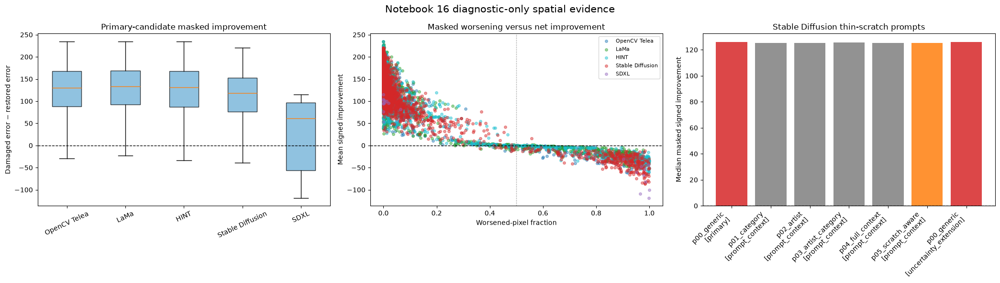

Batch 6 analytical overview rendered.
Model distributions shown: 5
Stable Diffusion prompt variants shown: 7
Selected candidate-panel records: 10
Selected cross-model records: 4


In [25]:
# ---------------------------------------------------------------------------
# Human-readable analytical overview
# ---------------------------------------------------------------------------

plot_model_order = [
    model_id
    for model_id in MODEL_ORDER
    if model_id
    in set(
        candidate_spatial_evidence_df[
            "model_id"
        ]
    )
]

plot_model_labels = [
    MODEL_DISPLAY_NAMES.get(
        model_id,
        model_id,
    )
    for model_id in plot_model_order
]

figure, axes = plt.subplots(
    1,
    3,
    figsize=(21, 6),
)

boxplot_values = [
    candidate_spatial_evidence_df.loc[
        candidate_spatial_evidence_df[
            "model_id"
        ].eq(model_id),
        "masked_signed_improvement_mean",
    ].to_numpy()
    for model_id in plot_model_order
]

boxplot = axes[0].boxplot(
    boxplot_values,
    tick_labels=plot_model_labels,
    showfliers=False,
    patch_artist=True,
)

for patch in boxplot["boxes"]:
    patch.set_facecolor("#6baed6")
    patch.set_alpha(0.75)

axes[0].axhline(
    0.0,
    color="black",
    linewidth=1.0,
    linestyle="--",
)

axes[0].set_title(
    "Primary-candidate masked improvement"
)

axes[0].set_ylabel(
    "Damaged error − restored error"
)

axes[0].tick_params(
    axis="x",
    rotation=25,
)


scatter_colours = {
    "opencv_telea": "#1f77b4",
    "lama": "#2ca02c",
    "hint_places2": "#17becf",
    "stable_diffusion_inpainting": "#d62728",
    "sdxl_inpainting": "#9467bd",
}

for model_id in plot_model_order:
    model_points = (
        candidate_spatial_evidence_df.loc[
            candidate_spatial_evidence_df[
                "model_id"
            ].eq(model_id)
        ]
    )

    axes[1].scatter(
        model_points[
            "masked_worsened_pixel_fraction"
        ],
        model_points[
            "masked_signed_improvement_mean"
        ],
        s=16,
        alpha=0.45,
        color=scatter_colours[
            model_id
        ],
        label=MODEL_DISPLAY_NAMES.get(
            model_id,
            model_id,
        ),
    )

axes[1].axhline(
    0.0,
    color="black",
    linewidth=1.0,
    linestyle="--",
)

axes[1].axvline(
    0.5,
    color="grey",
    linewidth=1.0,
    linestyle=":",
)

axes[1].set_title(
    "Masked worsening versus net improvement"
)

axes[1].set_xlabel(
    "Worsened-pixel fraction"
)

axes[1].set_ylabel(
    "Mean signed improvement"
)

axes[1].legend(
    fontsize=8,
)


prompt_plot_df = (
    sd_scratch_spatial_ablation_df
    .sort_values(
        [
            "execution_role",
            "prompt_variant_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

prompt_labels = prompt_plot_df.apply(
    lambda row: (
        f"{row['prompt_variant_id']}\n"
        f"[{row['execution_role']}]"
    ),
    axis=1,
)

prompt_colours = [
    (
        "#d62728"
        if prompt_id == "p00_generic"
        else "#ff7f0e"
        if prompt_id == "p05_scratch_aware"
        else "#7f7f7f"
    )
    for prompt_id in (
        prompt_plot_df[
            "prompt_variant_id"
        ].astype(str)
    )
]

axes[2].bar(
    np.arange(len(prompt_plot_df)),
    prompt_plot_df[
        "median_masked_improvement"
    ],
    color=prompt_colours,
    alpha=0.85,
)

axes[2].axhline(
    0.0,
    color="black",
    linewidth=1.0,
    linestyle="--",
)

axes[2].set_xticks(
    np.arange(len(prompt_plot_df))
)

axes[2].set_xticklabels(
    prompt_labels,
    rotation=45,
    ha="right",
)

axes[2].set_title(
    "Stable Diffusion thin-scratch prompts"
)

axes[2].set_ylabel(
    "Median masked signed improvement"
)

figure.suptitle(
    "Notebook 16 diagnostic-only spatial evidence",
    fontsize=15,
)

figure.tight_layout()
plt.show()

print("Batch 6 analytical overview rendered.")
print(
    "Model distributions shown:",
    len(plot_model_order),
)
print(
    "Stable Diffusion prompt variants shown:",
    len(prompt_plot_df),
)
print(
    "Selected candidate-panel records:",
    len(candidate_panel_selection_df),
)
print(
    "Selected cross-model records:",
    len(cross_model_panel_selection_df),
)

In [26]:
# ---------------------------------------------------------------------------
# Batch 6 validation
# ---------------------------------------------------------------------------

# Make this validation stage safely rerunnable.
BATCH_6_VALIDATION_STAGE = (
    "batch_6_analysis_and_selection"
)

BATCH_6_STAGE_ALIASES = {
    BATCH_6_VALIDATION_STAGE,
    "BATCH_6_VALIDATION_STAGE",
}

retained_validation_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    not in BATCH_6_STAGE_ALIASES
]

VALIDATION = ValidationCollector()
VALIDATION.extend(
    retained_validation_checks
)

def add_batch_6_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            BATCH_6_VALIDATION_STAGE
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


expected_primary_nonzero_by_model = (
    evaluation_worklist_df.loc[
        evaluation_worklist_df[
            "execution_role"
        ].astype(str).isin(
            primary_execution_roles
        )
        & evaluation_worklist_df[
            "is_zero_control"
        ].eq(False)
    ]
    .groupby("model_id")
    .size()
    .astype(int)
    .to_dict()
)

observed_primary_masked_by_model = (
    candidate_spatial_evidence_df[
        "model_id"
    ]
    .value_counts()
    .astype(int)
    .to_dict()
)

add_batch_6_check(
    "primary_masked_candidate_scope",
    "Primary nonzero masked evidence matches the worklist.",
    expected_primary_nonzero_by_model,
    observed_primary_masked_by_model,
    (
        observed_primary_masked_by_model
        == expected_primary_nonzero_by_model
    ),
)

add_batch_6_check(
    "candidate_evidence_uniqueness",
    "Candidate-level evidence contains one row per primary nonzero candidate.",
    0,
    int(
        candidate_spatial_evidence_df[
            "candidate_id"
        ].duplicated().sum()
    ),
    not candidate_spatial_evidence_df[
        "candidate_id"
    ].duplicated().any(),
)

add_batch_6_check(
    "diagnostic_evidence_policy",
    "Analysis rows remain diagnostic-only and are not final flags.",
    {
        "evidence_role": "diagnostic_only",
        "final_flags": 0,
    },
    {
        "evidence_roles": sorted(
            candidate_spatial_evidence_df[
                "evidence_role"
            ].unique()
        ),
        "final_flags": int(
            candidate_spatial_evidence_df[
                "is_final_trustworthiness_flag"
            ].sum()
        ),
    },
    (
        candidate_spatial_evidence_df[
            "evidence_role"
        ].eq("diagnostic_only").all()
        and candidate_spatial_evidence_df[
            "is_final_trustworthiness_flag"
        ].eq(False).all()
    ),
)

add_batch_6_check(
    "candidate_panel_count",
    "Exactly two candidate panels are selected for each model.",
    EXPECTED_COUNTS[
        "selected_candidate_panels"
    ],
    len(candidate_panel_selection_df),
    (
        len(candidate_panel_selection_df)
        == EXPECTED_COUNTS[
            "selected_candidate_panels"
        ]
    ),
)

observed_candidate_roles_by_model = (
    candidate_panel_selection_df
    .groupby("model_id")[
        "selection_role"
    ]
    .apply(
        lambda values: sorted(
            values.astype(str)
        )
    )
    .to_dict()
)

expected_candidate_roles_by_model = {
    model_id: sorted(
        SPATIAL_CONFIG[
            "representative_panels"
        ][
            "candidate_roles"
        ]
    )
    for model_id in MODEL_ORDER
}

add_batch_6_check(
    "candidate_role_coverage",
    "Every model receives both approved candidate-panel roles.",
    expected_candidate_roles_by_model,
    observed_candidate_roles_by_model,
    (
        observed_candidate_roles_by_model
        == expected_candidate_roles_by_model
    ),
)

selected_candidate_ids = set(
    candidate_panel_selection_df[
        "candidate_id"
    ].astype(str)
)

available_candidate_ids = set(
    evaluation_worklist_df[
        "candidate_id"
    ].astype(str)
)

add_batch_6_check(
    "selected_candidates_exist",
    "Every selected candidate exists in the normalized worklist.",
    set(),
    (
        selected_candidate_ids
        - available_candidate_ids
    ),
    selected_candidate_ids.issubset(
        available_candidate_ids
    ),
)

add_batch_6_check(
    "cross_model_panel_count",
    "Exactly four cross-model cases are selected.",
    EXPECTED_COUNTS[
        "selected_cross_model_panels"
    ],
    len(cross_model_panel_selection_df),
    (
        len(cross_model_panel_selection_df)
        == EXPECTED_COUNTS[
            "selected_cross_model_panels"
        ]
    ),
)

observed_cross_model_groups = set(
    cross_model_panel_selection_df[
        "damage_group"
    ].astype(str)
)

add_batch_6_check(
    "cross_model_damage_groups",
    "Every approved cross-model damage group is represented.",
    set(approved_damage_groups),
    observed_cross_model_groups,
    (
        observed_cross_model_groups
        == set(approved_damage_groups)
    ),
)

minimum_selected_model_count = int(
    cross_model_panel_selection_df[
        "model_count"
    ].min()
)

add_batch_6_check(
    "cross_model_comparability",
    "Each selected cross-model case contains at least three primary models.",
    "at least 3",
    minimum_selected_model_count,
    minimum_selected_model_count >= 3,
)

selected_case_model_duplicates = int(
    cross_model_candidate_selection_df
    .duplicated(
        [
            "case_id",
            "model_id",
        ]
    )
    .sum()
)

add_batch_6_check(
    "cross_model_primary_uniqueness",
    "Each selected case contains at most one primary candidate per model.",
    0,
    selected_case_model_duplicates,
    selected_case_model_duplicates == 0,
)

observed_scratch_prompt_variants = set(
    sd_scratch_spatial_ablation_df[
        "prompt_variant_id"
    ].dropna().astype(str)
)

required_scratch_prompt_variants = {
    "p00_generic",
    "p05_scratch_aware",
}

add_batch_6_check(
    "scratch_prompt_ablation_coverage",
    "Thin-scratch spatial analysis contains generic and scratch-aware prompts.",
    required_scratch_prompt_variants,
    observed_scratch_prompt_variants,
    required_scratch_prompt_variants.issubset(
        observed_scratch_prompt_variants
    ),
)

selection_numeric_columns = [
    "masked_signed_improvement_mean",
    "masked_worsened_pixel_fraction",
    "boundary_signed_improvement_mean",
    "outside_boundary_changed_pixel_fraction",
]

invalid_selection_numeric_values = int(
    (
        ~np.isfinite(
            candidate_panel_selection_df[
                selection_numeric_columns
            ].to_numpy(
                dtype=float
            )
        )
    ).sum()
)

add_batch_6_check(
    "selection_metrics_finite",
    "Candidate selections contain finite spatial evidence.",
    0,
    invalid_selection_numeric_values,
    invalid_selection_numeric_values == 0,
)


# ---------------------------------------------------------------------------
# Batch gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_6_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq(
            "batch_6_analysis_and_selection"
        )
    ]
    .reset_index(drop=True)
)

display(batch_6_validation_df)

VALIDATION.raise_for_blocking()

print(
    "Batch 6 spatial analysis and representative "
    "selection passed."
)
print(
    "Batch 6 validation checks:",
    len(batch_6_validation_df),
)
print(
    "Blocking failures across Batches 1–6:",
    len(VALIDATION.blocking_failures),
)
print(
    "Candidate panels selected:",
    len(candidate_panel_selection_df),
)
print(
    "Cross-model panels selected:",
    len(cross_model_panel_selection_df),
)
print(
    "Canonical files added in this batch:",
    0,
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_6_analysis_and_selection,primary_masked_candidate_scope,Primary nonzero masked evidence matches the wo...,blocking,"{""hint_places2"": 2320, ""lama"": 2320, ""opencv_t...","{""hint_places2"": 2320, ""lama"": 2320, ""opencv_t...",True,
1,batch_6_analysis_and_selection,candidate_evidence_uniqueness,Candidate-level evidence contains one row per ...,blocking,0,0,True,
2,batch_6_analysis_and_selection,diagnostic_evidence_policy,Analysis rows remain diagnostic-only and are n...,blocking,"{""evidence_role"": ""diagnostic_only"", ""final_fl...","{""evidence_roles"": [""diagnostic_only""], ""final...",True,
3,batch_6_analysis_and_selection,candidate_panel_count,Exactly two candidate panels are selected for ...,blocking,10,10,True,
4,batch_6_analysis_and_selection,candidate_role_coverage,Every model receives both approved candidate-p...,blocking,"{""hint_places2"": [""model_highest_masked_worsen...","{""hint_places2"": [""model_highest_masked_worsen...",True,
5,batch_6_analysis_and_selection,selected_candidates_exist,Every selected candidate exists in the normali...,blocking,"""set()""","""set()""",True,
6,batch_6_analysis_and_selection,cross_model_panel_count,Exactly four cross-model cases are selected.,blocking,4,4,True,
7,batch_6_analysis_and_selection,cross_model_damage_groups,Every approved cross-model damage group is rep...,blocking,"""{'synthetic_degradation', 'thin_scratch', 'sm...","""{'synthetic_degradation', 'thin_scratch', 'sm...",True,
8,batch_6_analysis_and_selection,cross_model_comparability,Each selected cross-model case contains at lea...,blocking,at least 3,5,True,
9,batch_6_analysis_and_selection,cross_model_primary_uniqueness,Each selected case contains at most one primar...,blocking,0,0,True,


Batch 6 spatial analysis and representative selection passed.
Batch 6 validation checks: 12
Blocking failures across Batches 1–6: 0
Candidate panels selected: 10
Cross-model panels selected: 4
Canonical files added in this batch: 0


## Batch 7 — Canonical representative spatial panels

This batch renders the 14 approved human-review figures:

- ten candidate-level nine-panel diagnostics:
  - median masked improvement for each of the five models;
  - highest masked worsened-pixel fraction for each of the five models;
- four cross-model comparison panels:
  - small or localized loss;
  - thin scratch;
  - large or structural loss;
  - synthetic degradation.

Every panel uses the canonical global absolute-error and signed-improvement scales established in Batch 4.

The panels are diagnostic-only evidence. Selection based on difficult or strongly worsened cases is intentional and must not be interpreted as an estimate of overall model performance.

In [27]:
from matplotlib.colors import TwoSlopeNorm
from PIL import Image as PILImage

from restoration_eval.error_maps import (
    load_candidate_arrays,
    make_map_image_id,
)


# ---------------------------------------------------------------------------
# Deterministic selected-panel output preparation
# ---------------------------------------------------------------------------

SELECTED_PANELS_ROOT = OUTPUTS[
    "selected_panels_root"
]

SELECTED_PANELS_ROOT.mkdir(
    parents=True,
    exist_ok=True,
)

existing_selected_panel_paths = list(
    SELECTED_PANELS_ROOT.glob("*.png")
)

for existing_path in existing_selected_panel_paths:
    existing_path.unlink()

candidate_lookup_df = (
    evaluation_worklist_df
    .set_index(
        "candidate_id",
        drop=False,
    )
)

if not candidate_lookup_df.index.is_unique:
    raise RuntimeError(
        "The evaluation worklist contains duplicate "
        "candidate identifiers."
    )


def build_selected_panel_manifest_record(
    *,
    map_id,
    candidate_id,
    case_id,
    model_id,
    painting_id,
    map_type,
    selection_role,
    panel_path,
):
    with PILImage.open(panel_path) as image:
        width, height = image.size
        image_mode = image.mode
        image_format = image.format

    return {
        "map_image_id": make_map_image_id(
            map_id,
            (
                f"{map_type}|"
                f"{selection_role}"
            ),
        ),
        "asset_kind": "selected_panel",
        "map_id": map_id,
        "candidate_id": candidate_id,
        "case_id": case_id,
        "model_id": model_id,
        "painting_id": painting_id,
        "map_type": map_type,
        "selection_role": selection_role,
        "relative_path": to_repo_relative(
            panel_path,
            PROJECT_ROOT,
        ),
        "sha256": sha256_file(panel_path),
        "size_bytes": panel_path.stat().st_size,
        "width": width,
        "height": height,
        "image_mode": image_mode,
        "format": image_format,
        "cmap": "",
        "vmin": np.nan,
        "vmax": np.nan,
        "center": np.nan,
        "scale_scope": (
            "global_absolute_and_signed_scales"
        ),
        "quantization_policy": (
            "matplotlib_rgba_composite_with_"
            "documented_global_scales"
        ),
        "no_data_policy": (
            "masked_panels_use_transparency"
        ),
        "renderer_version": (
            SPATIAL_MAP_RENDERER_VERSION
        ),
        "status": "passed",
        "issue": "",
    }


print("Selected-panel rendering target prepared.")
print(
    "Removed stale selected PNGs:",
    len(existing_selected_panel_paths),
)
print(
    "Selected-panel root:",
    to_repo_relative(
        SELECTED_PANELS_ROOT,
        PROJECT_ROOT,
    ),
)
print(
    "Candidate-panel selections:",
    len(candidate_panel_selection_df),
)
print(
    "Cross-model selections:",
    len(cross_model_panel_selection_df),
)

Selected-panel rendering target prepared.
Removed stale selected PNGs: 0
Selected-panel root: outputs/16_difference_maps_and_spatial_diagnostics/figures/selected_spatial_panels
Candidate-panel selections: 10
Cross-model selections: 4


In [28]:
# ---------------------------------------------------------------------------
# Render candidate-level representative panels
# ---------------------------------------------------------------------------

candidate_panel_manifest_records = []
candidate_panel_audit_records = []

candidate_panel_render_df = (
    candidate_panel_selection_df
    .sort_values(
        [
            "model_id",
            "selection_role",
            "candidate_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

for number, selection in enumerate(
    candidate_panel_render_df.to_dict(
        "records"
    ),
    start=1,
):
    candidate_id = str(
        selection["candidate_id"]
    )

    candidate_row = (
        candidate_lookup_df.loc[
            candidate_id
        ]
    )

    map_id = make_map_id(candidate_id)

    panel_path = (
        SELECTED_PANELS_ROOT
        / (
            f"candidate_{number:02d}_"
            f"{map_id}.png"
        )
    )

    figure = render_candidate_spatial_panel(
        candidate_row,
        project_root=PROJECT_ROOT,
        config=SPATIAL_CONFIG,
        scales=global_scales,
        output_path=panel_path,
        selection_role=str(
            selection["selection_role"]
        ),
    )

    plt.close(figure)

    manifest_record = (
        build_selected_panel_manifest_record(
            map_id=map_id,
            candidate_id=candidate_id,
            case_id=str(
                selection["case_id"]
            ),
            model_id=str(
                selection["model_id"]
            ),
            painting_id=str(
                selection["painting_id"]
            ),
            map_type=(
                "candidate_spatial_panel"
            ),
            selection_role=str(
                selection["selection_role"]
            ),
            panel_path=panel_path,
        )
    )

    candidate_panel_manifest_records.append(
        manifest_record
    )

    candidate_panel_audit_records.append(
        {
            "panel_number": number,
            "selection_role": selection[
                "selection_role"
            ],
            "model_id": selection[
                "model_id"
            ],
            "case_id": selection[
                "case_id"
            ],
            "candidate_id": candidate_id,
            "masked_signed_improvement_mean": (
                selection[
                    "masked_signed_improvement_mean"
                ]
            ),
            "masked_worsened_pixel_fraction": (
                selection[
                    "masked_worsened_pixel_fraction"
                ]
            ),
            "relative_path": manifest_record[
                "relative_path"
            ],
            "width": manifest_record[
                "width"
            ],
            "height": manifest_record[
                "height"
            ],
            "size_bytes": manifest_record[
                "size_bytes"
            ],
            "sha256": manifest_record[
                "sha256"
            ],
            "status": manifest_record[
                "status"
            ],
        }
    )

    print(
        f"Candidate panel {number}/"
        f"{len(candidate_panel_render_df)} | "
        f"{selection['model_id']} | "
        f"{selection['selection_role']} | "
        f"{candidate_id}"
    )

candidate_panel_audit_df = pd.DataFrame(
    candidate_panel_audit_records
)

display(candidate_panel_audit_df)

print("Candidate-panel rendering complete.")
print(
    "Candidate panels rendered:",
    len(candidate_panel_audit_df),
)
print(
    "Passed candidate panels:",
    int(
        candidate_panel_audit_df[
            "status"
        ].eq("passed").sum()
    ),
)

Candidate panel 1/10 | hint_places2 | model_highest_masked_worsened_fraction | candidate__hint_places2__synthetic_degradation__p235__water_stain__mild__c00
Candidate panel 2/10 | hint_places2 | model_median_masked_improvement | candidate__hint_places2__canonical__p153__mixed_damage__c00
Candidate panel 3/10 | lama | model_highest_masked_worsened_fraction | candidate__lama__synthetic_degradation__p246__partial_transparency__mild__c00
Candidate panel 4/10 | lama | model_median_masked_improvement | candidate__lama__damage_size__p107__loss_large__size_06pct__c00
Candidate panel 5/10 | opencv_telea | model_highest_masked_worsened_fraction | candidate__opencv_telea__synthetic_degradation__p009__partial_transparency__mild__c00
Candidate panel 6/10 | opencv_telea | model_median_masked_improvement | candidate__opencv_telea__canonical__p033__loss_small__c00
Candidate panel 7/10 | sdxl_inpainting | model_highest_masked_worsened_fraction | sdxl__2e517a80aacc__p00_generic__seed2026
Candidate panel 

,panel_number,selection_role,model_id,case_id,candidate_id,masked_signed_improvement_mean,masked_worsened_pixel_fraction,relative_path,width,height,size_bytes,sha256,status
0,1,model_highest_masked_worsened_fraction,hint_places2,synthetic_degradation__p235__water_stain__mild,candidate__hint_places2__synthetic_degradation...,-34.004077,0.999034,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,4278303,0d422e0a3dc7f5074db840878990bf7fe474e46b7243ab...,passed
1,2,model_median_masked_improvement,hint_places2,canonical__p153__mixed_damage,candidate__hint_places2__canonical__p153__mixe...,130.620183,0.000442,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,2973164,0af9772018b9ae028a596e988c375eb1ee2e3a69f4769d...,passed
2,3,model_highest_masked_worsened_fraction,lama,synthetic_degradation__p246__partial_transpare...,candidate__lama__synthetic_degradation__p246__...,-38.797562,0.998488,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,4240252,79a2881f45b1706a252659e464e8c0d577a165dc8da902...,passed
3,4,model_median_masked_improvement,lama,damage_size__p107__loss_large__size_06pct,candidate__lama__damage_size__p107__loss_large...,132.858178,0.014794,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,1644626,44d4e603a934ce4d3d569b60a81cd7eaf4738774a4d1d8...,passed
4,5,model_highest_masked_worsened_fraction,opencv_telea,synthetic_degradation__p009__partial_transpare...,candidate__opencv_telea__synthetic_degradation...,-37.984201,0.997897,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,4072063,7ba363448690d9d29783fe057609a768a2e2df328f49ca...,passed
5,6,model_median_masked_improvement,opencv_telea,canonical__p033__loss_small,candidate__opencv_telea__canonical__p033__loss...,130.570188,0.038276,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,4392484,34d4f3faa4c42389e47b1990a6ca219d0b0414eb41d070...,passed
6,7,model_highest_masked_worsened_fraction,sdxl_inpainting,synthetic_degradation__p181__water_stain__mode...,sdxl__2e517a80aacc__p00_generic__seed2026,-99.980045,0.999986,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,3619815,78f063ee9c0b3c780bbb023cce510ec5d0ec88373f3f2c...,passed
7,8,model_median_masked_improvement,sdxl_inpainting,canonical__p051__loss_small,sdxl__a74605091256__p00_generic__seed2026,68.394091,0.107503,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,3282456,c307409121ccb122a064039bc054bc88fd1fe1c9d42063...,passed
8,9,model_highest_masked_worsened_fraction,stable_diffusion_inpainting,synthetic_degradation__p089__dirt_dust__mild,sd15__p00__s2026__eb7612c9bdf3,-51.774574,0.999070,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,2544060,6b0e7b1f304d4049d5a250665f219c74eb90f1c32276f9...,passed
9,10,model_median_masked_improvement,stable_diffusion_inpainting,canonical__p086__loss_small,sd15__p00__s2026__99f9f6f22237,118.673235,0.039468,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,4249575,e7305bb233f1d2f83ae32131d6065a1a1feae5a39bb4eb...,passed


Candidate-panel rendering complete.
Candidate panels rendered: 10
Passed candidate panels: 10


In [29]:
# ---------------------------------------------------------------------------
# Cross-model spatial comparison renderer
# ---------------------------------------------------------------------------

# ---------------------------------------------------------------------------
# Cross-model spatial comparison renderer
# ---------------------------------------------------------------------------

def render_cross_model_spatial_panel(
    candidate_rows,
    *,
    project_root,
    config,
    scales,
    output_path,
    selection_role,
):
    rows = candidate_rows.copy()

    model_order_lookup = {
        model_id: index
        for index, model_id
        in enumerate(MODEL_ORDER)
    }

    rows["_model_order"] = (
        rows["model_id"].map(
            model_order_lookup
        )
    )

    rows = (
        rows
        .sort_values(
            [
                "_model_order",
                "candidate_id",
            ],
            kind="stable",
        )
        .reset_index(drop=True)
    )

    if len(rows) < 3:
        raise ValueError(
            "A cross-model panel requires at least "
            "three primary candidates."
        )

    rendered_candidates = []

    for row in rows.to_dict("records"):
        arrays = load_candidate_arrays(
            row,
            project_root=project_root,
        )

        result = (
            compute_candidate_spatial_diagnostics(
                row,
                project_root=project_root,
                config=config,
            )
        )

        rendered_candidates.append(
            {
                "row": row,
                "arrays": arrays,
                "result": result,
            }
        )

    reference = rendered_candidates[0]
    reference_arrays = reference["arrays"]
    reference_result = reference["result"]

    absolute_scale = scales[
        "absolute_error"
    ]

    signed_scale = scales[
        "signed_improvement"
    ]

    signed_norm = TwoSlopeNorm(
        vmin=signed_scale["vmin"],
        vcenter=signed_scale["center"],
        vmax=signed_scale["vmax"],
    )

    number_of_models = len(
        rendered_candidates
    )

    figure, axes = plt.subplots(
        number_of_models + 1,
        4,
        figsize=(
            18,
            4.5
            + 3.6 * number_of_models,
        ),
        constrained_layout=False,
    )

    title_options = {
        "fontsize": 11,
        "pad": 8,
    }

    axes[0, 0].imshow(
        reference_arrays[
            "clean"
        ].astype(np.uint8)
    )

    axes[0, 0].set_title(
        "Clean reference",
        **title_options,
    )

    axes[0, 1].imshow(
        reference_arrays[
            "damaged"
        ].astype(np.uint8)
    )

    axes[0, 1].set_title(
        "Damaged input",
        **title_options,
    )

    axes[0, 2].imshow(
        reference_result.regions[
            "masked_region"
        ].mask,
        cmap="gray",
        vmin=0,
        vmax=1,
    )

    axes[0, 2].set_title(
        "Active mask / effect support",
        **title_options,
    )

    damaged_artist = axes[0, 3].imshow(
        reference_result.maps[
            "damaged_absolute_error"
        ],
        cmap=absolute_scale["cmap"],
        vmin=absolute_scale["vmin"],
        vmax=absolute_scale["vmax"],
    )

    axes[0, 3].set_title(
        "Clean-damaged absolute error",
        **title_options,
    )

    signed_artist = None

    for row_number, rendered in enumerate(
        rendered_candidates,
        start=1,
    ):
        row = rendered["row"]
        arrays = rendered["arrays"]
        result = rendered["result"]

        model_id = str(
            row["model_id"]
        )

        model_label = MODEL_DISPLAY_NAMES.get(
            model_id,
            model_id,
        )

        axes[row_number, 0].imshow(
            arrays["restored"].astype(
                np.uint8
            )
        )

        axes[row_number, 0].set_title(
            f"{model_label}\nRestored output",
            **title_options,
        )

        axes[row_number, 1].imshow(
            result.maps[
                "restored_absolute_error"
            ],
            cmap=absolute_scale["cmap"],
            vmin=absolute_scale["vmin"],
            vmax=absolute_scale["vmax"],
        )

        axes[row_number, 1].set_title(
            "Clean-restored absolute error",
            **title_options,
        )

        signed_artist = axes[
            row_number,
            2,
        ].imshow(
            result.maps[
                "signed_improvement"
            ],
            cmap=signed_scale["cmap"],
            norm=signed_norm,
        )

        axes[row_number, 2].set_title(
            "Signed improvement",
            **title_options,
        )

        active_mask = result.regions[
            "masked_region"
        ].mask

        masked_signed_improvement = (
            np.ma.masked_where(
                ~active_mask,
                result.maps[
                    "signed_improvement"
                ],
            )
        )

        axes[row_number, 3].imshow(
            masked_signed_improvement,
            cmap=signed_scale["cmap"],
            norm=signed_norm,
        )

        axes[row_number, 3].set_title(
            "Masked signed improvement",
            **title_options,
        )

    for axis in axes.ravel():
        axis.set_xticks([])
        axis.set_yticks([])

        for spine in axis.spines.values():
            spine.set_visible(False)

    # Reserve independent areas below the grid for the two scales.
    figure.subplots_adjust(
        left=0.025,
        right=0.975,
        top=0.90,
        bottom=0.105,
        wspace=0.10,
        hspace=0.30,
    )

    absolute_colourbar_axis = (
        figure.add_axes(
            [
                0.12,
                0.035,
                0.32,
                0.014,
            ]
        )
    )

    signed_colourbar_axis = (
        figure.add_axes(
            [
                0.56,
                0.035,
                0.32,
                0.014,
            ]
        )
    )

    absolute_colourbar = figure.colorbar(
        damaged_artist,
        cax=absolute_colourbar_axis,
        orientation="horizontal",
    )

    absolute_colourbar.set_label(
        "Mean absolute RGB error [0–255]",
        fontsize=10,
    )

    signed_colourbar = figure.colorbar(
        signed_artist,
        cax=signed_colourbar_axis,
        orientation="horizontal",
    )

    signed_colourbar.set_label(
        "Damaged error − restored error",
        fontsize=10,
    )

    case_id = str(
        rows.iloc[0]["case_id"]
    )

    figure.suptitle(
        (
            f"Cross-model spatial comparison | "
            f"{case_id}\n"
            f"selection={selection_role}; "
            "diagnostic-only evidence"
        ),
        fontsize=15,
        y=0.975,
    )

    output = Path(output_path)

    output.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    figure.savefig(
        output,
        dpi=180,
        bbox_inches="tight",
        facecolor="white",
    )

    return figure


print("Cross-model panel renderer defined.")
print(
    "Global absolute-error limit:",
    global_scales[
        "absolute_error"
    ]["vmax"],
)
print(
    "Global signed limits:",
    (
        global_scales[
            "signed_improvement"
        ]["vmin"],
        global_scales[
            "signed_improvement"
        ]["vmax"],
    ),
)

Cross-model panel renderer defined.
Global absolute-error limit: 210.6666717529297
Global signed limits: (-213.0, 213.0)


Cross-model panel 1/4 | small_or_localized_loss | canonical__p101__loss_small | models=5


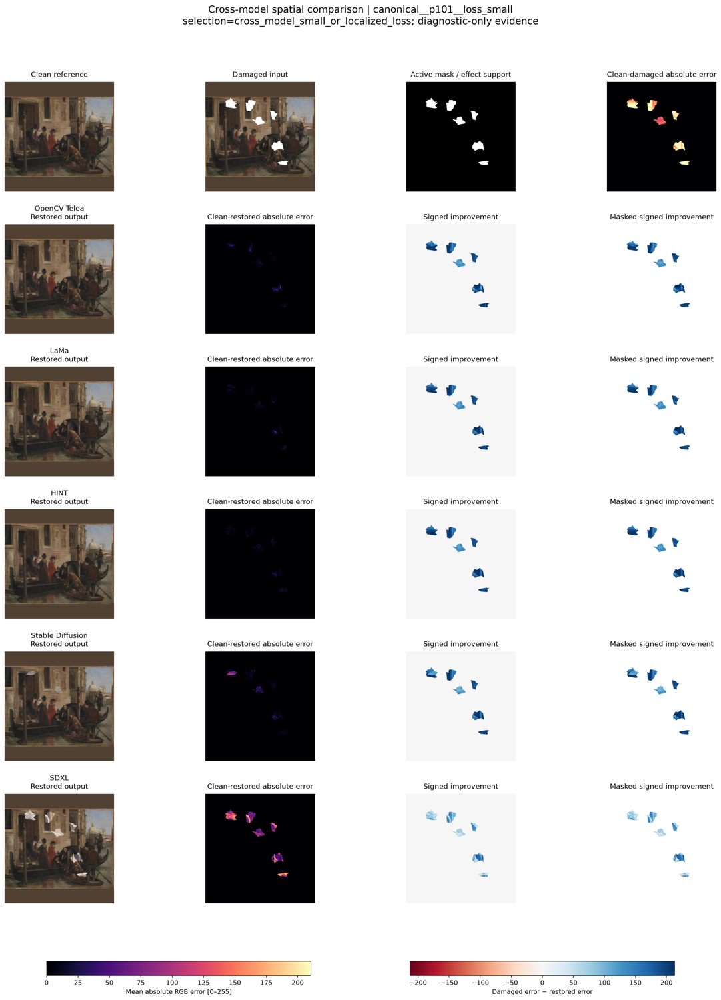

Cross-model panel 2/4 | thin_scratch | canonical__p111__scratch_thin | models=5


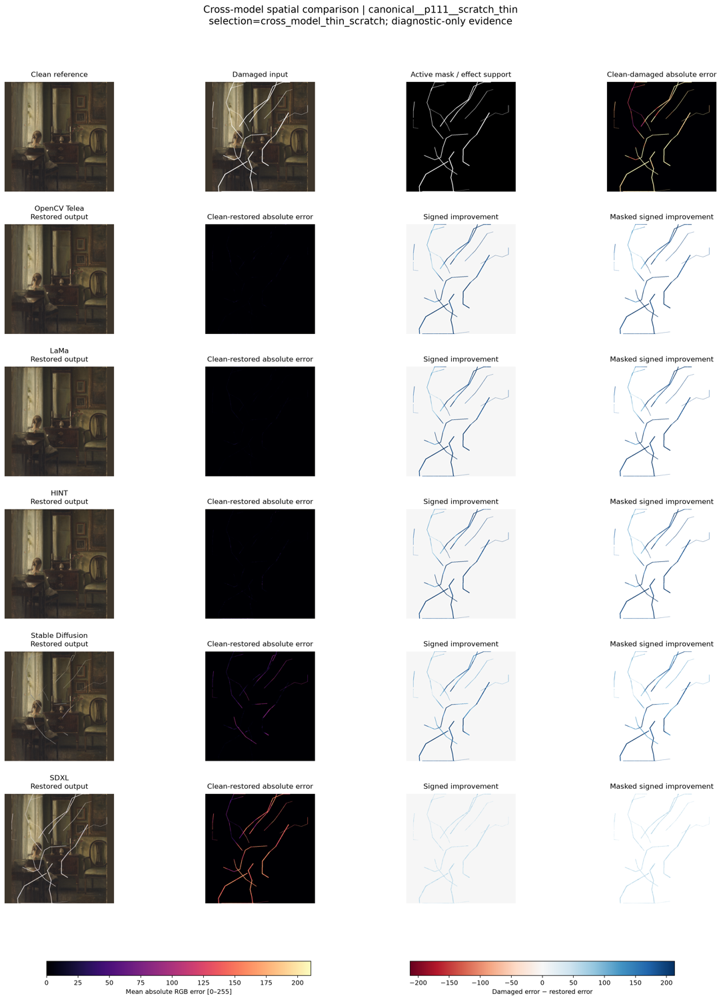

Cross-model panel 3/4 | large_or_structural_loss | canonical__p001__loss_large | models=5


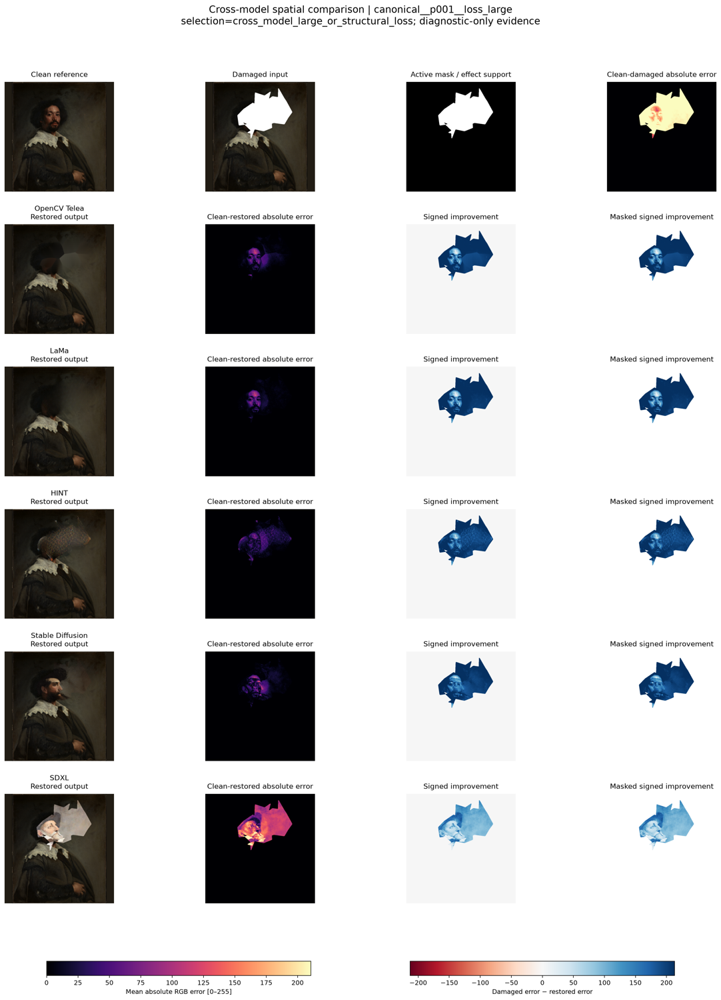

Cross-model panel 4/4 | synthetic_degradation | synthetic_degradation__p018__dirt_dust__severe | models=5


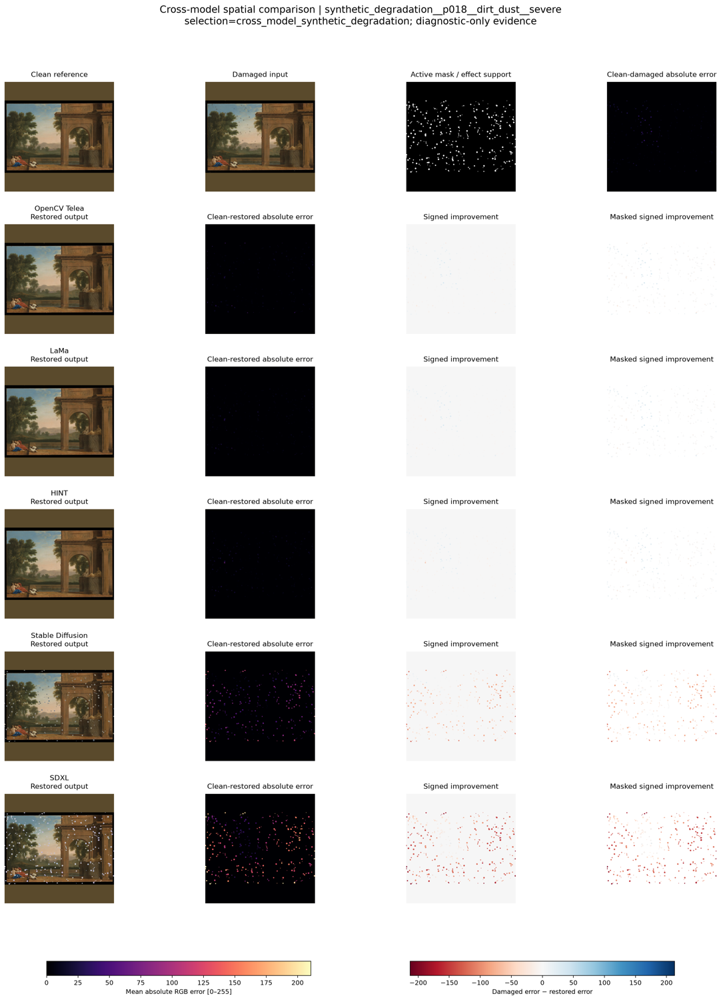

,panel_number,selection_role,damage_group,case_id,painting_id,model_count,models_available,masked_improvement_spread,relative_path,width,height,size_bytes,sha256,status
0,1,cross_model_small_or_localized_loss,small_or_localized_loss,canonical__p101__loss_small,p101,5,hint_places2|lama|opencv_telea|sdxl_inpainting...,85.593742,outputs/16_difference_maps_and_spatial_diagnos...,2827,3920,2198332,6efa7aa7d50f1e579adb3f6ef8c4333923668eca95308e...,passed
1,2,cross_model_thin_scratch,thin_scratch,canonical__p111__scratch_thin,p111,5,hint_places2|lama|opencv_telea|sdxl_inpainting...,132.631587,outputs/16_difference_maps_and_spatial_diagnos...,2827,3920,2737521,93fcc12296dd4fa6831a02ccf67837c62fac36b8e17ee5...,passed
2,3,cross_model_large_or_structural_loss,large_or_structural_loss,canonical__p001__loss_large,p001,5,hint_places2|lama|opencv_telea|sdxl_inpainting...,105.418249,outputs/16_difference_maps_and_spatial_diagnos...,2827,3920,2649704,c53304dcf1e47237aef21297fa7155bf003f75974331dd...,passed
3,4,cross_model_synthetic_degradation,synthetic_degradation,synthetic_degradation__p018__dirt_dust__severe,p018,5,hint_places2|lama|opencv_telea|sdxl_inpainting...,111.543596,outputs/16_difference_maps_and_spatial_diagnos...,2827,3920,2163511,a6fbdb8954b720dd8c5e03c793f709557d00056129c3e2...,passed


Cross-model panel rendering complete.
Cross-model panels rendered: 4
Inline previews rendered: 4


In [30]:
# ---------------------------------------------------------------------------
# Render cross-model comparison panels
# ---------------------------------------------------------------------------

cross_model_panel_manifest_records = []
cross_model_panel_audit_records = []

cross_model_render_df = (
    cross_model_panel_selection_df
    .sort_values(
        "damage_group_order",
        kind="stable",
    )
    .reset_index(drop=True)
)

for number, selection in enumerate(
    cross_model_render_df.to_dict(
        "records"
    ),
    start=1,
):
    case_id = str(
        selection["case_id"]
    )

    selection_role = str(
        selection["selection_role"]
    )

    selected_candidate_ids_for_case = (
        cross_model_candidate_selection_df.loc[
            cross_model_candidate_selection_df[
                "selection_role"
            ].eq(selection_role),
            "candidate_id",
        ]
        .astype(str)
        .tolist()
    )

    selected_worklist_rows = (
        evaluation_worklist_df.loc[
            evaluation_worklist_df[
                "candidate_id"
            ].astype(str).isin(
                selected_candidate_ids_for_case
            )
        ]
        .copy()
    )

    if (
        len(selected_worklist_rows)
        != len(
            selected_candidate_ids_for_case
        )
    ):
        raise RuntimeError(
            "Cross-model candidate lookup failed "
            f"for {selection_role}."
        )

    panel_map_id = make_map_id(
        (
            f"cross_model|"
            f"{selection_role}|"
            f"{case_id}"
        )
    )

    panel_path = (
        SELECTED_PANELS_ROOT
        / (
            f"cross_{number:02d}_"
            f"{panel_map_id}.png"
        )
    )

    figure = (
        render_cross_model_spatial_panel(
            selected_worklist_rows,
            project_root=PROJECT_ROOT,
            config=SPATIAL_CONFIG,
            scales=global_scales,
            output_path=panel_path,
            selection_role=selection_role,
        )
    )

    plt.close(figure)

    manifest_record = (
        build_selected_panel_manifest_record(
            map_id=panel_map_id,
            candidate_id="",
            case_id=case_id,
            model_id="",
            painting_id=str(
                selection["painting_id"]
            ),
            map_type=(
                "cross_model_spatial_panel"
            ),
            selection_role=selection_role,
            panel_path=panel_path,
        )
    )

    cross_model_panel_manifest_records.append(
        manifest_record
    )

    cross_model_panel_audit_records.append(
        {
            "panel_number": number,
            "selection_role": selection_role,
            "damage_group": selection[
                "damage_group"
            ],
            "case_id": case_id,
            "painting_id": selection[
                "painting_id"
            ],
            "model_count": selection[
                "model_count"
            ],
            "models_available": selection[
                "models_available"
            ],
            "masked_improvement_spread": (
                selection[
                    "masked_improvement_spread"
                ]
            ),
            "relative_path": manifest_record[
                "relative_path"
            ],
            "width": manifest_record[
                "width"
            ],
            "height": manifest_record[
                "height"
            ],
            "size_bytes": manifest_record[
                "size_bytes"
            ],
            "sha256": manifest_record[
                "sha256"
            ],
            "status": manifest_record[
                "status"
            ],
        }
    )

    with PILImage.open(
        panel_path
    ) as image:
        preview = image.copy()
        preview.thumbnail(
            (1500, 1500)
        )

    print(
        f"Cross-model panel {number}/"
        f"{len(cross_model_render_df)} | "
        f"{selection['damage_group']} | "
        f"{case_id} | "
        f"models={selection['model_count']}"
    )

    display(preview)

cross_model_panel_audit_df = (
    pd.DataFrame(
        cross_model_panel_audit_records
    )
)

display(cross_model_panel_audit_df)

print("Cross-model panel rendering complete.")
print(
    "Cross-model panels rendered:",
    len(cross_model_panel_audit_df),
)
print(
    "Inline previews rendered:",
    len(cross_model_panel_audit_df),
)

In [31]:
# ---------------------------------------------------------------------------
# Assemble selected-panel manifest records
# ---------------------------------------------------------------------------

candidate_panel_manifest_df = pd.DataFrame(
    candidate_panel_manifest_records,
    columns=map_images_df.columns,
)

cross_model_panel_manifest_df = pd.DataFrame(
    cross_model_panel_manifest_records,
    columns=map_images_df.columns,
)

new_selected_panel_manifest_df = (
    pd.concat(
        [
            candidate_panel_manifest_df,
            cross_model_panel_manifest_df,
        ],
        ignore_index=True,
    )
)

candidate_map_manifest_df = (
    map_images_df.loc[
        map_images_df[
            "asset_kind"
        ].eq("candidate_map")
    ]
    .copy()
    .reset_index(drop=True)
)

selected_manifest_validation = (
    validate_map_image_manifest(
        new_selected_panel_manifest_df,
        project_root=PROJECT_ROOT,
        verify_checksums=True,
    )
)

if not selected_manifest_validation[
    "passed"
]:
    raise RuntimeError(
        "Selected-panel manifest validation "
        f"failed: {selected_manifest_validation}"
    )

combined_map_images_df = (
    pd.concat(
        [
            candidate_map_manifest_df,
            new_selected_panel_manifest_df,
        ],
        ignore_index=True,
    )
)

combined_manifest_validation = (
    validate_map_image_manifest(
        combined_map_images_df,
        project_root=PROJECT_ROOT,
        verify_checksums=False,
    )
)

if not combined_manifest_validation[
    "passed"
]:
    raise RuntimeError(
        "Combined map manifest validation "
        f"failed: {combined_manifest_validation}"
    )

write_dataframe_atomic(
    combined_map_images_df,
    OUTPUTS["map_manifest"],
)


# ---------------------------------------------------------------------------
# Reload the canonical serialized manifest
# ---------------------------------------------------------------------------

map_images_df = pd.read_csv(
    OUTPUTS["map_manifest"],
    low_memory=False,
)

reloaded_combined_manifest_validation = (
    validate_map_image_manifest(
        map_images_df,
        project_root=PROJECT_ROOT,
        verify_checksums=False,
    )
)

selected_panel_manifest_df = (
    map_images_df.loc[
        map_images_df[
            "asset_kind"
        ].eq("selected_panel")
    ]
    .copy()
    .reset_index(drop=True)
)

selected_panel_type_summary_df = (
    selected_panel_manifest_df
    .groupby(
        [
            "map_type",
            "status",
            "format",
            "image_mode",
        ],
        as_index=False,
    )
    .agg(
        panels=(
            "map_image_id",
            "size",
        ),
        total_size_bytes=(
            "size_bytes",
            "sum",
        ),
    )
)

display(selected_panel_type_summary_df)
display(
    selected_panel_manifest_df[
        [
            "map_image_id",
            "map_type",
            "selection_role",
            "case_id",
            "model_id",
            "relative_path",
            "width",
            "height",
            "size_bytes",
            "status",
        ]
    ]
)

print("Selected panels added to the canonical manifest.")
print(
    "Candidate-map rows retained:",
    len(candidate_map_manifest_df),
)
print(
    "Selected-panel rows added:",
    len(selected_panel_manifest_df),
)
print(
    "Canonical map-manifest rows:",
    len(map_images_df),
)
print(
    "Reloaded manifest validation passed:",
    reloaded_combined_manifest_validation[
        "passed"
    ],
)

,map_type,status,format,image_mode,panels,total_size_bytes
0,candidate_spatial_panel,passed,PNG,RGBA,10,35296798
1,cross_model_spatial_panel,passed,PNG,RGBA,4,9749068


,map_image_id,map_type,selection_role,case_id,model_id,relative_path,width,height,size_bytes,status
0,smi_2fc3b4b0550ee3806525,candidate_spatial_panel,model_highest_masked_worsened_fraction,synthetic_degradation__p235__water_stain__mild,hint_places2,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,4278303,passed
1,smi_75d524811a0c42ee1fee,candidate_spatial_panel,model_median_masked_improvement,canonical__p153__mixed_damage,hint_places2,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,2973164,passed
2,smi_799a1d8136a2ae65bf67,candidate_spatial_panel,model_highest_masked_worsened_fraction,synthetic_degradation__p246__partial_transpare...,lama,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,4240252,passed
3,smi_5e1fc8e93e0097b97f29,candidate_spatial_panel,model_median_masked_improvement,damage_size__p107__loss_large__size_06pct,lama,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,1644626,passed
4,smi_906edc11907239290e6a,candidate_spatial_panel,model_highest_masked_worsened_fraction,synthetic_degradation__p009__partial_transpare...,opencv_telea,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,4072063,passed
5,smi_19a60d312f8d862d13a4,candidate_spatial_panel,model_median_masked_improvement,canonical__p033__loss_small,opencv_telea,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,4392484,passed
6,smi_54d43b959c08084632fd,candidate_spatial_panel,model_highest_masked_worsened_fraction,synthetic_degradation__p181__water_stain__mode...,sdxl_inpainting,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,3619815,passed
7,smi_aa54e3e82718f057e50f,candidate_spatial_panel,model_median_masked_improvement,canonical__p051__loss_small,sdxl_inpainting,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,3282456,passed
8,smi_919358b47ecfe44af230,candidate_spatial_panel,model_highest_masked_worsened_fraction,synthetic_degradation__p089__dirt_dust__mild,stable_diffusion_inpainting,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,2544060,passed
9,smi_674c3d63bef1a908d27f,candidate_spatial_panel,model_median_masked_improvement,canonical__p086__loss_small,stable_diffusion_inpainting,outputs/16_difference_maps_and_spatial_diagnos...,2719,2532,4249575,passed


Selected panels added to the canonical manifest.
Candidate-map rows retained: 76020
Selected-panel rows added: 14
Canonical map-manifest rows: 76034
Reloaded manifest validation passed: True


In [32]:
# ---------------------------------------------------------------------------
# Filesystem and checksum reconciliation
# ---------------------------------------------------------------------------

selected_manifest_paths = set(
    selected_panel_manifest_df[
        "relative_path"
    ].astype(str)
)

selected_disk_paths = {
    path.relative_to(
        PROJECT_ROOT
    ).as_posix()
    for path in (
        SELECTED_PANELS_ROOT.glob("*.png")
    )
}

selected_checksum_mismatches = []

for record in (
    selected_panel_manifest_df
    .to_dict("records")
):
    panel_path = (
        PROJECT_ROOT
        / str(record["relative_path"])
    )

    observed_checksum = (
        sha256_file(panel_path)
    )

    if (
        observed_checksum
        != str(record["sha256"])
    ):
        selected_checksum_mismatches.append(
            str(record["relative_path"])
        )

observed_panel_type_counts = (
    selected_panel_manifest_df[
        "map_type"
    ]
    .value_counts()
    .astype(int)
    .to_dict()
)

expected_panel_type_counts = {
    "candidate_spatial_panel": (
        EXPECTED_COUNTS[
            "selected_candidate_panels"
        ]
    ),
    "cross_model_spatial_panel": (
        EXPECTED_COUNTS[
            "selected_cross_model_panels"
        ]
    ),
}

candidate_role_counts = (
    selected_panel_manifest_df.loc[
        selected_panel_manifest_df[
            "map_type"
        ].eq("candidate_spatial_panel"),
        "selection_role",
    ]
    .value_counts()
    .astype(int)
    .to_dict()
)

expected_candidate_role_counts = {
    role: len(MODEL_ORDER)
    for role in SPATIAL_CONFIG[
        "representative_panels"
    ][
        "candidate_roles"
    ]
}

expected_cross_model_roles = {
    f"cross_model_{group}"
    for group in approved_damage_groups
}

observed_cross_model_roles = set(
    selected_panel_manifest_df.loc[
        selected_panel_manifest_df[
            "map_type"
        ].eq(
            "cross_model_spatial_panel"
        ),
        "selection_role",
    ].astype(str)
)

maximum_selected_filename_length = max(
    len(Path(path).name)
    for path in selected_manifest_paths
)


# ---------------------------------------------------------------------------
# Batch 7 validation
# ---------------------------------------------------------------------------

# Make this validation stage safely rerunnable.
BATCH_7_VALIDATION_STAGE = (
    "batch_7_representative_panels"
)

retained_validation_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_7_VALIDATION_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(
    retained_validation_checks
)

def add_batch_7_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            BATCH_7_VALIDATION_STAGE
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_7_check(
    "selected_panel_count",
    "Exactly 14 canonical representative panels exist.",
    EXPECTED_COUNTS[
        "selected_panels_total"
    ],
    len(selected_panel_manifest_df),
    (
        len(selected_panel_manifest_df)
        == EXPECTED_COUNTS[
            "selected_panels_total"
        ]
    ),
)

add_batch_7_check(
    "selected_panel_type_counts",
    "Candidate and cross-model panel counts match the contract.",
    expected_panel_type_counts,
    observed_panel_type_counts,
    (
        observed_panel_type_counts
        == expected_panel_type_counts
    ),
)

add_batch_7_check(
    "candidate_selection_roles",
    "Each candidate selection role occurs once per model.",
    expected_candidate_role_counts,
    candidate_role_counts,
    (
        candidate_role_counts
        == expected_candidate_role_counts
    ),
)

add_batch_7_check(
    "cross_model_selection_roles",
    "Every approved cross-model damage group has one panel.",
    expected_cross_model_roles,
    observed_cross_model_roles,
    (
        observed_cross_model_roles
        == expected_cross_model_roles
    ),
)

add_batch_7_check(
    "selected_panel_filesystem",
    "Selected-panel manifest and PNG directory match exactly.",
    selected_manifest_paths,
    selected_disk_paths,
    (
        selected_manifest_paths
        == selected_disk_paths
    ),
)

add_batch_7_check(
    "selected_panel_checksums",
    "Every selected-panel checksum matches its PNG.",
    [],
    selected_checksum_mismatches,
    not selected_checksum_mismatches,
)

invalid_panel_metadata = int(
    (
        pd.to_numeric(
            selected_panel_manifest_df[
                "size_bytes"
            ],
            errors="coerce",
        ).le(0)
        | pd.to_numeric(
            selected_panel_manifest_df[
                "width"
            ],
            errors="coerce",
        ).le(0)
        | pd.to_numeric(
            selected_panel_manifest_df[
                "height"
            ],
            errors="coerce",
        ).le(0)
        | ~selected_panel_manifest_df[
            "format"
        ].eq("PNG")
        | ~selected_panel_manifest_df[
            "status"
        ].eq("passed")
    ).sum()
)

add_batch_7_check(
    "selected_panel_metadata",
    "Every panel has valid dimensions, size, format, and status.",
    0,
    invalid_panel_metadata,
    invalid_panel_metadata == 0,
)

add_batch_7_check(
    "selected_panel_identifiers",
    "Selected-panel manifest identifiers are unique.",
    0,
    int(
        selected_panel_manifest_df[
            "map_image_id"
        ].duplicated().sum()
    ),
    not selected_panel_manifest_df[
        "map_image_id"
    ].duplicated().any(),
)

add_batch_7_check(
    "selected_panel_filename_lengths",
    "Selected-panel filenames satisfy the configured short-name policy.",
    (
        "<= "
        f"{SPATIAL_CONFIG['execution']['maximum_map_filename_characters']}"
    ),
    maximum_selected_filename_length,
    (
        maximum_selected_filename_length
        <= SPATIAL_CONFIG[
            "execution"
        ][
            "maximum_map_filename_characters"
        ]
    ),
)

add_batch_7_check(
    "canonical_map_manifest_rows",
    "Candidate maps and selected panels produce the approved manifest size.",
    EXPECTED_COUNTS[
        "map_manifest_rows"
    ],
    len(map_images_df),
    (
        len(map_images_df)
        == EXPECTED_COUNTS[
            "map_manifest_rows"
        ]
    ),
)

add_batch_7_check(
    "canonical_map_manifest_validation",
    "The reloaded canonical map manifest satisfies its schema.",
    True,
    reloaded_combined_manifest_validation,
    reloaded_combined_manifest_validation[
        "passed"
    ],
)

add_batch_7_check(
    "inline_preview_count",
    "The approved four cross-model panels were previewed in the notebook.",
    SPATIAL_CONFIG[
        "representative_panels"
    ][
        "preview_panel_count"
    ],
    len(cross_model_panel_audit_df),
    (
        len(cross_model_panel_audit_df)
        == SPATIAL_CONFIG[
            "representative_panels"
        ][
            "preview_panel_count"
        ]
    ),
)


# ---------------------------------------------------------------------------
# Batch gate
# ---------------------------------------------------------------------------

all_validation_df = VALIDATION.to_dataframe()

batch_7_validation_df = (
    all_validation_df.loc[
        all_validation_df[
            "validation_stage"
        ].eq(
            "batch_7_representative_panels"
        )
    ]
    .reset_index(drop=True)
)

display(batch_7_validation_df)

VALIDATION.raise_for_blocking()

print(
    "Batch 7 canonical representative-panel "
    "generation passed."
)
print(
    "Batch 7 validation checks:",
    len(batch_7_validation_df),
)
print(
    "Blocking failures across Batches 1–7:",
    len(VALIDATION.blocking_failures),
)
print(
    "Candidate panels:",
    observed_panel_type_counts.get(
        "candidate_spatial_panel",
        0,
    ),
)
print(
    "Cross-model panels:",
    observed_panel_type_counts.get(
        "cross_model_spatial_panel",
        0,
    ),
)
print(
    "Canonical map-manifest rows:",
    len(map_images_df),
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_7_representative_panels,selected_panel_count,Exactly 14 canonical representative panels exist.,blocking,14,14,True,
1,batch_7_representative_panels,selected_panel_type_counts,Candidate and cross-model panel counts match t...,blocking,"{""candidate_spatial_panel"": 10, ""cross_model_s...","{""candidate_spatial_panel"": 10, ""cross_model_s...",True,
2,batch_7_representative_panels,candidate_selection_roles,Each candidate selection role occurs once per ...,blocking,"{""model_highest_masked_worsened_fraction"": 5, ...","{""model_highest_masked_worsened_fraction"": 5, ...",True,
3,batch_7_representative_panels,cross_model_selection_roles,Every approved cross-model damage group has on...,blocking,"""{'cross_model_large_or_structural_loss', 'cro...","""{'cross_model_large_or_structural_loss', 'cro...",True,
4,batch_7_representative_panels,selected_panel_filesystem,Selected-panel manifest and PNG directory matc...,blocking,"""{'outputs/16_difference_maps_and_spatial_diag...","""{'outputs/16_difference_maps_and_spatial_diag...",True,
5,batch_7_representative_panels,selected_panel_checksums,Every selected-panel checksum matches its PNG.,blocking,[],[],True,
6,batch_7_representative_panels,selected_panel_metadata,"Every panel has valid dimensions, size, format...",blocking,0,0,True,
7,batch_7_representative_panels,selected_panel_identifiers,Selected-panel manifest identifiers are unique.,blocking,0,0,True,
8,batch_7_representative_panels,selected_panel_filename_lengths,Selected-panel filenames satisfy the configure...,blocking,<= 40,37,True,
9,batch_7_representative_panels,canonical_map_manifest_rows,Candidate maps and selected panels produce the...,blocking,76034,76034,True,


Batch 7 canonical representative-panel generation passed.
Batch 7 validation checks: 12
Blocking failures across Batches 1–7: 0
Candidate panels: 10
Cross-model panels: 4
Canonical map-manifest rows: 76034


## Batch 8 — Final handoff, provenance, and completion gate

This batch completes Notebook 16 by:

- persisting one consolidated validation table;
- writing the universal artifact and run manifests;
- registering the canonical diagnostics, map collections, representative panels, and validation evidence;
- updating the authoritative JSON and Markdown project-path registries;
- removing only the validated temporary checkpoints and smoke-test files;
- independently reloading and validating the complete handoff.

The final completion gate requires:

- 143,247 normalized spatial-diagnostic rows;
- 76,020 canonical candidate-map images;
- 14 representative spatial panels;
- 76,034 normalized map-manifest rows;
- exactly 76,039 Notebook 16 canonical files;
- zero remaining temporary work files;
- zero blocking or warning validation failures;
- complete artifact-checksum and project-registry agreement.

The project inventory is refreshed externally only after the completed notebook has been saved and independently inspected.

In [33]:
import os
import time

from uuid import uuid4

from restoration_eval.manifests import (
    artifact_records_dataframe,
    build_artifact_record,
    build_run_manifest,
    sha256_path,
)

from restoration_eval.paths import (
    upsert_project_path_artifacts,
    write_project_paths_registry,
)

from restoration_eval.schemas import (
    VALIDATION_CHECKS_SCHEMA,
    validate_dataframe,
)


FINAL_ARTIFACT_RECORD_COUNT = 5

FINAL_CANONICAL_FILE_COUNT = (
    EXPECTED_COUNTS[
        "map_manifest_rows"
    ]
    + 5
)

FINAL_RUN_ID = (
    f"run_{uuid4().hex}"
)


# ---------------------------------------------------------------------------
# Windows-safe JSON persistence
# ---------------------------------------------------------------------------

def write_json_atomic_retry(
    payload,
    destination,
    attempts=8,
    initial_retry_seconds=0.125,
):
    destination = Path(destination)

    destination.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    retry_seconds = (
        initial_retry_seconds
    )

    last_error = None

    for attempt_number in range(
        1,
        attempts + 1,
    ):
        temporary_path = (
            destination.parent
            / (
                "."
                + destination.name
                + "."
                + uuid4().hex
                + ".tmp"
            )
        )

        try:
            temporary_path.write_text(
                json.dumps(
                    payload,
                    indent=2,
                    ensure_ascii=False,
                )
                + "\n",
                encoding="utf-8",
                newline="\n",
            )

            os.replace(
                temporary_path,
                destination,
            )

            return {
                "path": destination,
                "attempts": attempt_number,
            }

        except PermissionError as error:
            last_error = error

            temporary_path.unlink(
                missing_ok=True
            )

            if attempt_number < attempts:
                time.sleep(
                    retry_seconds
                )

                retry_seconds = min(
                    retry_seconds * 2,
                    2.0,
                )

        except Exception:
            temporary_path.unlink(
                missing_ok=True
            )
            raise

    raise PermissionError(
        "Could not atomically persist JSON "
        f"after {attempts} attempts: "
        f"{last_error}"
    )


def call_with_permission_retry(
    function,
    *args,
    attempts=8,
    initial_retry_seconds=0.125,
    **kwargs,
):
    retry_seconds = (
        initial_retry_seconds
    )

    last_error = None

    for attempt_number in range(
        1,
        attempts + 1,
    ):
        try:
            return {
                "result": function(
                    *args,
                    **kwargs,
                ),
                "attempts": attempt_number,
            }

        except PermissionError as error:
            last_error = error

            if attempt_number < attempts:
                time.sleep(
                    retry_seconds
                )

                retry_seconds = min(
                    retry_seconds * 2,
                    2.0,
                )

    raise PermissionError(
        "Operation remained unavailable after "
        f"{attempts} attempts: {last_error}"
    )


# ---------------------------------------------------------------------------
# Validation summary for the run manifest
# ---------------------------------------------------------------------------

def validation_stage_summary():
    validation_frame = (
        VALIDATION.to_dataframe()
    )

    stage_records = []

    for stage_name, stage_frame in (
        validation_frame.groupby(
            "validation_stage",
            sort=False,
        )
    ):
        stage_records.append(
            {
                "validation_stage": str(
                    stage_name
                ),
                "check_count": int(
                    len(stage_frame)
                ),
                "passed_count": int(
                    stage_frame[
                        "passed"
                    ].astype(bool).sum()
                ),
                "failed_count": int(
                    (
                        ~stage_frame[
                            "passed"
                        ].astype(bool)
                    ).sum()
                ),
                "blocking_failure_count": int(
                    (
                        ~stage_frame[
                            "passed"
                        ].astype(bool)
                        & stage_frame[
                            "severity"
                        ].eq("blocking")
                    ).sum()
                ),
                "warning_failure_count": int(
                    (
                        ~stage_frame[
                            "passed"
                        ].astype(bool)
                        & stage_frame[
                            "severity"
                        ].eq("warning")
                    ).sum()
                ),
            }
        )

    return {
        **VALIDATION.summary(),
        "warning_failure_count": int(
            (
                ~validation_frame[
                    "passed"
                ].astype(bool)
                & validation_frame[
                    "severity"
                ].eq("warning")
            ).sum()
        ),
        "stages": stage_records,
    }


# ---------------------------------------------------------------------------
# Exact expected canonical file population
# ---------------------------------------------------------------------------

def expected_notebook_16_owned_files():
    image_files = {
        (
            PROJECT_ROOT
            / str(relative_path)
        ).resolve()
        for relative_path in (
            map_images_df[
                "relative_path"
            ].astype(str)
        )
    }

    single_file_outputs = {
        OUTPUTS[
            "spatial_diagnostics"
        ].resolve(),
        OUTPUTS[
            "map_manifest"
        ].resolve(),
        OUTPUTS[
            "validation"
        ].resolve(),
        OUTPUTS[
            "artifacts"
        ].resolve(),
        OUTPUTS[
            "run_manifest"
        ].resolve(),
    }

    return (
        image_files
        | single_file_outputs
    )


print("Batch 8 handoff utilities prepared.")
print(
    "Expected canonical files:",
    FINAL_CANONICAL_FILE_COUNT,
)
print(
    "Expected registered artifacts:",
    FINAL_ARTIFACT_RECORD_COUNT,
)
print(
    "Final run ID:",
    FINAL_RUN_ID,
)

Batch 8 handoff utilities prepared.
Expected canonical files: 76039
Expected registered artifacts: 5
Final run ID: run_99b0d8d1af1b43bd8e8cb3d6ae754868


In [34]:
# ---------------------------------------------------------------------------
# Registered downstream artifacts
# ---------------------------------------------------------------------------

def build_notebook_16_artifact_records():
    validation_rows = len(
        VALIDATION.to_dataframe()
    )

    return [
        build_artifact_record(
            artifact_key=(
                "spatial_diagnostics.metrics"
            ),
            producer_notebook=NOTEBOOK_STEM,
            path=OUTPUTS[
                "spatial_diagnostics"
            ],
            artifact_type="table",
            artifact_role=(
                "primary_downstream_evidence"
            ),
            schema_version=(
                SPATIAL_DIAGNOSTIC_VERSION
            ),
            dataset_scope="controlled_300",
            experiment_id=(
                "cross_model_spatial_diagnostics"
            ),
            validation_status="passed",
            row_count=len(
                spatial_diagnostics_df
            ),
            project_root=PROJECT_ROOT,
        ),
        build_artifact_record(
            artifact_key=(
                "spatial_diagnostics.candidate_maps"
            ),
            producer_notebook=NOTEBOOK_STEM,
            path=OUTPUTS["maps_root"],
            artifact_type="image_collection",
            artifact_role=(
                "reusable_spatial_map_evidence"
            ),
            schema_version=(
                SPATIAL_MAP_RENDERER_VERSION
            ),
            dataset_scope="controlled_300",
            experiment_id=(
                "cross_model_spatial_diagnostics"
            ),
            validation_status="passed",
            row_count=EXPECTED_COUNTS[
                "candidate_map_images"
            ],
            project_root=PROJECT_ROOT,
        ),
        build_artifact_record(
            artifact_key=(
                "spatial_diagnostics.selected_panels"
            ),
            producer_notebook=NOTEBOOK_STEM,
            path=OUTPUTS[
                "selected_panels_root"
            ],
            artifact_type="figure_collection",
            artifact_role=(
                "human_review_figures"
            ),
            schema_version=(
                SPATIAL_MAP_RENDERER_VERSION
            ),
            dataset_scope="controlled_300",
            experiment_id=(
                "cross_model_spatial_diagnostics"
            ),
            validation_status="passed",
            row_count=EXPECTED_COUNTS[
                "selected_panels_total"
            ],
            project_root=PROJECT_ROOT,
        ),
        build_artifact_record(
            artifact_key=(
                "spatial_diagnostics.map_manifest"
            ),
            producer_notebook=NOTEBOOK_STEM,
            path=OUTPUTS[
                "map_manifest"
            ],
            artifact_type="table",
            artifact_role=(
                "normalized_spatial_image_index"
            ),
            schema_version=(
                SPATIAL_MAP_MANIFEST_VERSION
            ),
            dataset_scope="controlled_300",
            experiment_id=(
                "cross_model_spatial_diagnostics"
            ),
            validation_status="passed",
            row_count=len(
                map_images_df
            ),
            project_root=PROJECT_ROOT,
        ),
        build_artifact_record(
            artifact_key=(
                "validation."
                "16_difference_maps_and_"
                "spatial_diagnostics"
            ),
            producer_notebook=NOTEBOOK_STEM,
            path=OUTPUTS["validation"],
            artifact_type=(
                "validation_table"
            ),
            artifact_role=(
                "validation_evidence"
            ),
            schema_version=(
                VALIDATION_CHECKS_SCHEMA.version
            ),
            dataset_scope="controlled_300",
            experiment_id=(
                "cross_model_spatial_diagnostics"
            ),
            validation_status="passed",
            row_count=validation_rows,
            project_root=PROJECT_ROOT,
        ),
    ]


# ---------------------------------------------------------------------------
# Universal run-manifest output contract
# ---------------------------------------------------------------------------

def build_notebook_16_run_outputs(
    validation_rows,
):
    return [
        {
            "artifact_key": (
                "spatial_diagnostics.metrics"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS[
                    "spatial_diagnostics"
                ],
                PROJECT_ROOT,
            ),
            "artifact_type": "table",
            "artifact_role": (
                "primary_downstream_evidence"
            ),
            "schema_version": (
                SPATIAL_DIAGNOSTIC_VERSION
            ),
            "expected_row_count": (
                EXPECTED_COUNTS[
                    "spatial_diagnostic_rows"
                ]
            ),
        },
        {
            "artifact_key": (
                "spatial_diagnostics.candidate_maps"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS["maps_root"],
                PROJECT_ROOT,
            ),
            "artifact_type": (
                "image_collection"
            ),
            "artifact_role": (
                "reusable_spatial_map_evidence"
            ),
            "schema_version": (
                SPATIAL_MAP_RENDERER_VERSION
            ),
            "expected_row_count": (
                EXPECTED_COUNTS[
                    "candidate_map_images"
                ]
            ),
        },
        {
            "artifact_key": (
                "spatial_diagnostics.selected_panels"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS[
                    "selected_panels_root"
                ],
                PROJECT_ROOT,
            ),
            "artifact_type": (
                "figure_collection"
            ),
            "artifact_role": (
                "human_review_figures"
            ),
            "schema_version": (
                SPATIAL_MAP_RENDERER_VERSION
            ),
            "expected_row_count": (
                EXPECTED_COUNTS[
                    "selected_panels_total"
                ]
            ),
        },
        {
            "artifact_key": (
                "spatial_diagnostics.map_manifest"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS[
                    "map_manifest"
                ],
                PROJECT_ROOT,
            ),
            "artifact_type": "table",
            "artifact_role": (
                "normalized_spatial_image_index"
            ),
            "schema_version": (
                SPATIAL_MAP_MANIFEST_VERSION
            ),
            "expected_row_count": (
                EXPECTED_COUNTS[
                    "map_manifest_rows"
                ]
            ),
        },
        {
            "artifact_key": (
                "validation."
                "16_difference_maps_and_"
                "spatial_diagnostics"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS["validation"],
                PROJECT_ROOT,
            ),
            "artifact_type": (
                "validation_table"
            ),
            "artifact_role": (
                "validation_evidence"
            ),
            "schema_version": (
                VALIDATION_CHECKS_SCHEMA.version
            ),
            "expected_row_count": int(
                validation_rows
            ),
        },
        {
            "artifact_key": (
                "spatial_diagnostics.artifacts"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS["artifacts"],
                PROJECT_ROOT,
            ),
            "artifact_type": "manifest",
            "artifact_role": (
                "artifact_discovery"
            ),
            "schema_version": (
                ARTIFACT_MANIFEST_SCHEMA.version
            ),
            "expected_row_count": (
                FINAL_ARTIFACT_RECORD_COUNT
            ),
        },
        {
            "artifact_key": (
                "spatial_diagnostics.run_manifest"
            ),
            "relative_path": to_repo_relative(
                OUTPUTS["run_manifest"],
                PROJECT_ROOT,
            ),
            "artifact_type": "manifest",
            "artifact_role": (
                "run_provenance"
            ),
            "schema_version": (
                "run_manifest.v1"
            ),
            "expected_row_count": 1,
        },
    ]


# ---------------------------------------------------------------------------
# Universal run-manifest builder
# ---------------------------------------------------------------------------

def build_notebook_16_run_manifest(
    run_status,
    completion_gate_passed,
):
    validation_rows = len(
        VALIDATION.to_dataframe()
    )

    configuration_paths = [
        to_repo_relative(
            SPATIAL_CONFIG_PATH,
            PROJECT_ROOT,
        ),
        to_repo_relative(
            INPUTS[
                "evaluation_contract_config"
            ],
            PROJECT_ROOT,
        ),
    ]

    configuration_checksums = {
        relative_path: sha256_file(
            PROJECT_ROOT
            / relative_path
        )
        for relative_path
        in configuration_paths
    }

    manifest_inputs = json.loads(
        input_contract_df.to_json(
            orient="records"
        )
    )

    candidate_map_rows = int(
        map_images_df[
            "asset_kind"
        ].eq("candidate_map").sum()
    )

    selected_panel_rows = int(
        map_images_df[
            "asset_kind"
        ].eq("selected_panel").sum()
    )

    observed_regions = {
        str(key): int(value)
        for key, value in (
            spatial_diagnostics_df[
                "region_id"
            ].value_counts().items()
        )
    }

    observed_models = {
        str(key): int(value)
        for key, value in (
            spatial_diagnostics_df[
                [
                    "model_id",
                    "candidate_id",
                ]
            ]
            .drop_duplicates()[
                "model_id"
            ]
            .value_counts()
            .items()
        )
    }

    observed_map_types = {
        str(key): int(value)
        for key, value in (
            map_images_df[
                "map_type"
            ].value_counts().items()
        )
    }

    work_root = (
        NOTEBOOK_OUTPUT_ROOT
        / "work"
    )

    current_work_files = (
        [
            path
            for path in work_root.rglob("*")
            if path.is_file()
        ]
        if work_root.exists()
        else []
    )

    expected_counts = {
        **EXPECTED_COUNTS,
        "canonical_file_count": (
            FINAL_CANONICAL_FILE_COUNT
        ),
        "artifact_record_count": (
            FINAL_ARTIFACT_RECORD_COUNT
        ),
        "validation_row_count": int(
            validation_rows
        ),
        "temporary_work_file_count": 0,
        "blocking_validation_failures": 0,
        "warning_validation_failures": 0,
    }

    observed_counts = {
        "evaluated_unique_cases": int(
            spatial_diagnostics_df[
                "case_id"
            ].nunique()
        ),
        "evaluated_candidates": int(
            spatial_diagnostics_df[
                "candidate_id"
            ].nunique()
        ),
        "spatial_diagnostic_rows": int(
            len(spatial_diagnostics_df)
        ),
        "diagnostic_rows_by_region": (
            observed_regions
        ),
        "candidates_by_model": (
            observed_models
        ),
        "candidate_map_images": (
            candidate_map_rows
        ),
        "selected_panels_total": (
            selected_panel_rows
        ),
        "map_manifest_rows": int(
            len(map_images_df)
        ),
        "map_rows_by_type": (
            observed_map_types
        ),
        "selected_candidate_panels": int(
            selected_panel_rows
            and map_images_df[
                "map_type"
            ].eq(
                "candidate_spatial_panel"
            ).sum()
        ),
        "selected_cross_model_panels": int(
            map_images_df[
                "map_type"
            ].eq(
                "cross_model_spatial_panel"
            ).sum()
        ),
        "canonical_file_count": (
            FINAL_CANONICAL_FILE_COUNT
        ),
        "artifact_record_count": (
            FINAL_ARTIFACT_RECORD_COUNT
        ),
        "validation_row_count": int(
            validation_rows
        ),
        "temporary_work_file_count": len(
            current_work_files
        ),
        "blocking_validation_failures": int(
            len(
                VALIDATION.blocking_failures
            )
        ),
        "warning_validation_failures": int(
            (
                ~VALIDATION.to_dataframe()[
                    "passed"
                ].astype(bool)
                & VALIDATION.to_dataframe()[
                    "severity"
                ].eq("warning")
            ).sum()
        ),
    }

    manifest = build_run_manifest(
        notebook_id=NOTEBOOK_ID,
        notebook_name=NOTEBOOK_STEM,
        origin=SPATIAL_CONFIG["origin"],
        run_status=run_status,
        started_at_utc=RUN_STARTED_AT_UTC,
        completed_at_utc=utc_now_iso(),
        inventory_run_id=(
            inventory_run[
                "inventory_run_id"
            ]
        ),
        dataset_versions={
            "preprocessed_images": (
                PREPROCESSED_IMAGES_SCHEMA.version
            ),
            "case_registry": (
                CASE_REGISTRY_SCHEMA.version
            ),
            "model_eligibility": (
                MODEL_ELIGIBILITY_SCHEMA.version
            ),
            "region_policy": (
                REGION_POLICY_SCHEMA.version
            ),
            "restorations": (
                RESTORATIONS_SCHEMA.version
            ),
            "stable_diffusion_candidates": (
                STABLE_DIFFUSION_CANDIDATES_SCHEMA.version
            ),
            "sdxl_partial_candidates": (
                SDXL_PARTIAL_CANDIDATES_SCHEMA.version
            ),
            "classical_metrics": (
                CLASSICAL_METRICS_SCHEMA.version
            ),
            "evaluation_worklist": (
                EVALUATION_WORKLIST_SCHEMA_VERSION
            ),
            "spatial_diagnostics": (
                SPATIAL_DIAGNOSTIC_VERSION
            ),
            "spatial_map_images": (
                SPATIAL_MAP_MANIFEST_VERSION
            ),
        },
        configuration_paths=(
            configuration_paths
        ),
        configuration_checksums_by_path=(
            configuration_checksums
        ),
        helper_versions={
            "restoration_eval": (
                PACKAGE_VERSION
            ),
            "error_maps": (
                ERROR_MAP_VERSION
            ),
            "evaluation_inputs": (
                EVALUATION_INPUTS_MODULE_VERSION
            ),
            "manifests": (
                MANIFESTS_MODULE_VERSION
            ),
            "paths": PATHS_MODULE_VERSION,
            "regions": REGIONS_MODULE_VERSION,
            "schemas": SCHEMAS_MODULE_VERSION,
            "validation": (
                VALIDATION_MODULE_VERSION
            ),
            "map_renderer": (
                SPATIAL_MAP_RENDERER_VERSION
            ),
        },
        inputs=manifest_inputs,
        outputs=(
            build_notebook_16_run_outputs(
                validation_rows
            )
        ),
        expected_counts=expected_counts,
        observed_counts=observed_counts,
        validation_summary=(
            validation_stage_summary()
        ),
        known_limitations=list(
            SPATIAL_CONFIG[
                "known_limitations"
            ]
        )
        + [
            (
                "Highest-worsening representative "
                "panels are deliberately difficult "
                "examples and are not estimates of "
                "population-average performance."
            ),
            (
                "Cross-model panels include SDXL "
                "only when a selected case belongs to the "
                "24 completed cases within its "
                "predeclared 35-case bounded "
                "feasibility attempt."
            ),
        ],
        project_root=PROJECT_ROOT,
        package_names=(
            "numpy",
            "pandas",
            "matplotlib",
            "Pillow",
            "PyYAML",
        ),
        hardware={
            "execution_role": (
                "CPU spatial analysis and rendering"
            ),
            "upstream_restoration_hardware": (
                "recorded in upstream run manifests"
            ),
        },
        run_id=FINAL_RUN_ID,
    )

    manifest.update(
        {
            "refactor_status": (
                "refactored"
                if completion_gate_passed
                else "in_progress"
            ),
            "validation_status": (
                "passed"
                if completion_gate_passed
                else "pending"
            ),
            "completion_gate_passed": bool(
                completion_gate_passed
            ),
            "scientific_validation_passed": bool(
                reloaded_diagnostic_validation[
                    "passed"
                ]
                and reloaded_combined_manifest_validation[
                    "passed"
                ]
            ),
            "depends_on": [
                "02_image_preprocessing",
                (
                    "08_experiment_contracts_"
                    "and_region_policy"
                ),
                "09_opencv_telea_restoration",
                "10_lama_restoration",
                (
                    "11_stable_diffusion_"
                    "restoration"
                ),
                (
                    "12_sdxl_feasibility_"
                    "or_restoration"
                ),
                "12a_hint_restoration",
                "13_classical_metrics",
            ],
            "applicable_dataset_scopes": [
                "controlled_300",
            ],
            "applicable_experiment_scopes": [
                "canonical_missing_region",
                "damage_size_sensitivity",
                "mask_robustness",
                "synthetic_degradation",
                "scratch_prompt_ablation",
                "sdxl_partial_feasibility",
            ],
            "visualization_scales": (
                json.loads(
                    global_scale_df.to_json(
                        orient="records"
                    )
                )
            ),
            "representative_selection": {
                "candidate_panels": (
                    json.loads(
                        candidate_panel_selection_df[
                            [
                                "selection_role",
                                "model_id",
                                "case_id",
                                "candidate_id",
                            ]
                        ].to_json(
                            orient="records"
                        )
                    )
                ),
                "cross_model_panels": (
                    json.loads(
                        cross_model_panel_selection_df[
                            [
                                "selection_role",
                                "damage_group",
                                "case_id",
                                "models_available",
                                "masked_improvement_spread",
                            ]
                        ].to_json(
                            orient="records"
                        )
                    )
                ),
            },
            "evidence_policy": dict(
                SPATIAL_CONFIG[
                    "evidence_policy"
                ]
            ),
        }
    )

    return manifest


print("Notebook 16 handoff builders prepared.")
print(
    "Registered artifact records:",
    FINAL_ARTIFACT_RECORD_COUNT,
)
print(
    "Run-manifest output records:",
    len(
        build_notebook_16_run_outputs(
            len(
                VALIDATION.to_dataframe()
            )
        )
    ),
)

Notebook 16 handoff builders prepared.
Registered artifact records: 5
Run-manifest output records: 7


In [35]:
# ---------------------------------------------------------------------------
# Stage consolidated validation
# ---------------------------------------------------------------------------

staged_validation_df = (
    VALIDATION.to_dataframe()
)

write_dataframe_atomic(
    staged_validation_df,
    OUTPUTS["validation"],
)


# ---------------------------------------------------------------------------
# Stage artifact and partial run manifests
# ---------------------------------------------------------------------------

staged_artifact_records = (
    build_notebook_16_artifact_records()
)

staged_artifacts_df = (
    artifact_records_dataframe(
        staged_artifact_records
    )
)

write_dataframe_atomic(
    staged_artifacts_df,
    OUTPUTS["artifacts"],
)

staged_run_manifest = (
    build_notebook_16_run_manifest(
        run_status="partial",
        completion_gate_passed=False,
    )
)

staged_run_manifest_write = (
    write_json_atomic_retry(
        staged_run_manifest,
        OUTPUTS["run_manifest"],
    )
)


# ---------------------------------------------------------------------------
# Strictly identify the approved temporary work files
# ---------------------------------------------------------------------------

work_root = (
    NOTEBOOK_OUTPUT_ROOT
    / "work"
)

expected_smoke_panel_paths = {
    (
        PROJECT_ROOT
        / str(relative_path)
    ).resolve()
    for relative_path in (
        smoke_panel_audit_df[
            "relative_path"
        ].astype(str)
    )
}

expected_work_files = {
    GLOBAL_SCALE_CHECKPOINT_PATH.resolve(),
    DIAGNOSTICS_CHECKPOINT_PATH.resolve(),
    MAP_MANIFEST_CHECKPOINT_PATH.resolve(),
    *expected_smoke_panel_paths,
}

work_files_before_cleanup = (
    {
        path.resolve()
        for path in work_root.rglob("*")
        if path.is_file()
    }
    if work_root.exists()
    else set()
)

unexpected_work_files = sorted(
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in (
        work_files_before_cleanup
        - expected_work_files
    )
)

missing_expected_work_files = sorted(
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in (
        expected_work_files
        - work_files_before_cleanup
    )
)

# A completely absent work population means this cell is
# being safely rerun after a successful prior cleanup.
if (
    work_files_before_cleanup
    and (
        unexpected_work_files
        or missing_expected_work_files
    )
):
    raise RuntimeError(
        "Notebook 16 work cleanup contract "
        "does not match the observed files. "
        f"Unexpected={unexpected_work_files}; "
        f"missing={missing_expected_work_files}"
    )

for temporary_path in sorted(
    work_files_before_cleanup
):
    temporary_path.unlink()

for directory in sorted(
    (
        path
        for path in work_root.rglob("*")
        if path.is_dir()
    ),
    key=lambda path: len(path.parts),
    reverse=True,
):
    if not any(directory.iterdir()):
        directory.rmdir()

if (
    work_root.exists()
    and not any(work_root.iterdir())
):
    work_root.rmdir()

remaining_work_files = (
    sorted(
        path
        for path in work_root.rglob("*")
        if path.is_file()
    )
    if work_root.exists()
    else []
)


# ---------------------------------------------------------------------------
# Build, but do not yet write, the registry proposal
# ---------------------------------------------------------------------------

proposed_project_paths_registry = (
    upsert_project_path_artifacts(
        project_paths_registry,
        staged_artifact_records,
    )
)

proposed_registry_errors = (
    validate_project_paths_registry(
        proposed_project_paths_registry
    )
)

print("Notebook 16 handoff staged.")
print(
    "Staged validation rows:",
    len(staged_validation_df),
)
print(
    "Staged artifact records:",
    len(staged_artifacts_df),
)
print(
    "Run-manifest write attempts:",
    staged_run_manifest_write[
        "attempts"
    ],
)
print(
    "Temporary files removed:",
    len(work_files_before_cleanup),
)
print(
    "Expected temporary files:",
    len(expected_work_files),
)
print(
    "Temporary work files remaining:",
    len(remaining_work_files),
)
print(
    "Registry proposal errors:",
    proposed_registry_errors,
)
print(
    "Project-path registry has not yet been mutated."
)

Notebook 16 handoff staged.
Staged validation rows: 125
Staged artifact records: 5
Run-manifest write attempts: 1
Temporary files removed: 10
Expected temporary files: 10
Temporary work files remaining: 0
Registry proposal errors: []
Project-path registry has not yet been mutated.


In [36]:
# ---------------------------------------------------------------------------
# Reload and inspect the staged artifact manifest
# ---------------------------------------------------------------------------

staged_artifacts_reloaded_df = pd.read_csv(
    OUTPUTS["artifacts"],
    keep_default_na=False,
)

staged_artifact_schema = (
    validate_dataframe(
        staged_artifacts_reloaded_df,
        ARTIFACT_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

staged_artifact_checksum_failures = []

for record in (
    staged_artifacts_reloaded_df
    .to_dict("records")
):
    artifact_path = resolve_repo_path(
        record["relative_path"],
        PROJECT_ROOT,
        must_exist=True,
    )

    if (
        sha256_path(artifact_path)
        != record["checksum"]
    ):
        staged_artifact_checksum_failures.append(
            record["artifact_key"]
        )


# ---------------------------------------------------------------------------
# Exact owned-file and registry proposal
# ---------------------------------------------------------------------------

expected_owned_files = (
    expected_notebook_16_owned_files()
)

observed_owned_files = {
    path.resolve()
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if path.is_file()
}

proposed_registry_records = {
    record["artifact_key"]: record
    for record in (
        proposed_project_paths_registry[
            "artifacts"
        ]
    )
}

required_registry_keys = {
    record["artifact_key"]
    for record in staged_artifact_records
}

registry_proposal_matches = all(
    (
        artifact_key
        in proposed_registry_records
        and proposed_registry_records[
            artifact_key
        ][
            "validation_status"
        ]
        == "passed"
        and proposed_registry_records[
            artifact_key
        ][
            "checksum"
        ]
        == next(
            record["checksum"]
            for record in staged_artifact_records
            if record[
                "artifact_key"
            ]
            == artifact_key
        )
    )
    for artifact_key
    in required_registry_keys
)

completed_manifest_preview = (
    build_notebook_16_run_manifest(
        run_status="completed",
        completion_gate_passed=True,
    )
)


# ---------------------------------------------------------------------------
# Make Batch 8 validation safely rerunnable
# ---------------------------------------------------------------------------

BATCH_8_VALIDATION_STAGE = (
    "batch_8_completion_gate"
)

retained_validation_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_8_VALIDATION_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(
    retained_validation_checks
)


def add_batch_8_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage=(
            BATCH_8_VALIDATION_STAGE
        ),
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Completion checks
# ---------------------------------------------------------------------------

add_batch_8_check(
    "artifact_manifest_schema",
    "The five-record artifact manifest satisfies artifact_manifest.v1.",
    True,
    staged_artifact_schema.to_dict(),
    staged_artifact_schema.passed,
)

add_batch_8_check(
    "artifact_record_count",
    "Exactly five downstream artifacts are registered.",
    FINAL_ARTIFACT_RECORD_COUNT,
    len(staged_artifacts_reloaded_df),
    (
        len(staged_artifacts_reloaded_df)
        == FINAL_ARTIFACT_RECORD_COUNT
    ),
)

add_batch_8_check(
    "artifact_checksums",
    "Every staged artifact checksum matches its persisted target.",
    [],
    staged_artifact_checksum_failures,
    not staged_artifact_checksum_failures,
)

canonical_diagnostic_validation = (
    validate_spatial_diagnostics(
        spatial_diagnostics_df,
        expected_candidate_ids=(
            evaluation_worklist_df[
                "candidate_id"
            ]
        ),
    )
)

canonical_map_manifest_validation = (
    validate_map_image_manifest(
        map_images_df,
        project_root=PROJECT_ROOT,
        verify_checksums=False,
    )
)

add_batch_8_check(
    "canonical_spatial_validation",
    "Canonical diagnostics and map metadata remain scientifically valid.",
    True,
    {
        "diagnostics": (
            canonical_diagnostic_validation[
                "passed"
            ]
        ),
        "map_manifest": (
            canonical_map_manifest_validation[
                "passed"
            ]
        ),
    },
    (
        canonical_diagnostic_validation[
            "passed"
        ]
        and canonical_map_manifest_validation[
            "passed"
        ]
    ),
)

add_batch_8_check(
    "canonical_output_contract",
    "Exactly the approved Notebook 16 canonical files exist.",
    FINAL_CANONICAL_FILE_COUNT,
    len(observed_owned_files),
    (
        observed_owned_files
        == expected_owned_files
        and len(observed_owned_files)
        == FINAL_CANONICAL_FILE_COUNT
    ),
    details={
        "missing": sorted(
            to_repo_relative(
                path,
                PROJECT_ROOT,
            )
            for path in (
                expected_owned_files
                - observed_owned_files
            )
        ),
        "unexpected": sorted(
            to_repo_relative(
                path,
                PROJECT_ROOT,
            )
            for path in (
                observed_owned_files
                - expected_owned_files
            )
        ),
    },
)

add_batch_8_check(
    "temporary_work_cleanup",
    "All validated temporary checkpoints and smoke panels are absent.",
    [],
    [
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in remaining_work_files
    ],
    not remaining_work_files,
)

validation_files = sorted(
    path.resolve()
    for path in (
        NOTEBOOK_OUTPUT_ROOT
        / "validation"
    ).rglob("*")
    if path.is_file()
)

add_batch_8_check(
    "consolidated_validation_only",
    "Exactly one consolidated validation CSV exists.",
    [
        to_repo_relative(
            OUTPUTS["validation"],
            PROJECT_ROOT,
        )
    ],
    [
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in validation_files
    ],
    (
        validation_files
        == [
            OUTPUTS[
                "validation"
            ].resolve()
        ]
    ),
)

manifest_status_preview = {
    "run_status": (
        completed_manifest_preview[
            "run_status"
        ]
    ),
    "validation_status": (
        completed_manifest_preview[
            "validation_status"
        ]
    ),
    "refactor_status": (
        completed_manifest_preview[
            "refactor_status"
        ]
    ),
    "completion_gate_passed": (
        completed_manifest_preview[
            "completion_gate_passed"
        ]
    ),
}

add_batch_8_check(
    "run_manifest_contract",
    "The final manifest records completed, passed, and refactored status.",
    {
        "run_status": "completed",
        "validation_status": "passed",
        "refactor_status": "refactored",
        "completion_gate_passed": True,
    },
    manifest_status_preview,
    (
        manifest_status_preview
        == {
            "run_status": "completed",
            "validation_status": "passed",
            "refactor_status": "refactored",
            "completion_gate_passed": True,
        }
    ),
)

add_batch_8_check(
    "registry_proposal_valid",
    "The proposed project-path registry satisfies its schema.",
    [],
    proposed_registry_errors,
    not proposed_registry_errors,
)

add_batch_8_check(
    "registry_artifact_handoff",
    "All passed downstream artifacts appear in the registry proposal.",
    sorted(required_registry_keys),
    sorted(
        required_registry_keys.intersection(
            proposed_registry_records
        )
    ),
    registry_proposal_matches,
)

warning_failures = int(
    (
        ~VALIDATION.to_dataframe()[
            "passed"
        ].astype(bool)
        & VALIDATION.to_dataframe()[
            "severity"
        ].eq("warning")
    ).sum()
)

add_batch_8_check(
    "zero_warning_failures",
    "No warning-level validation failure remains.",
    0,
    warning_failures,
    warning_failures == 0,
)

add_batch_8_check(
    "zero_blocking_failures",
    "No blocking validation failure exists before final persistence.",
    0,
    len(VALIDATION.blocking_failures),
    len(VALIDATION.blocking_failures) == 0,
)

VALIDATION.raise_for_blocking()


# ---------------------------------------------------------------------------
# Persist the checksum-consistent final handoff
# ---------------------------------------------------------------------------

final_validation_df = (
    VALIDATION.to_dataframe()
)

write_dataframe_atomic(
    final_validation_df,
    OUTPUTS["validation"],
)

final_artifact_records = (
    build_notebook_16_artifact_records()
)

final_artifacts_df = (
    artifact_records_dataframe(
        final_artifact_records
    )
)

write_dataframe_atomic(
    final_artifacts_df,
    OUTPUTS["artifacts"],
)

final_run_manifest = (
    build_notebook_16_run_manifest(
        run_status="completed",
        completion_gate_passed=True,
    )
)

final_run_manifest_write = (
    write_json_atomic_retry(
        final_run_manifest,
        OUTPUTS["run_manifest"],
    )
)

final_project_paths_registry = (
    upsert_project_path_artifacts(
        project_paths_registry,
        final_artifact_records,
    )
)

registry_write_result = (
    call_with_permission_retry(
        write_project_paths_registry,
        final_project_paths_registry,
        PROJECT_ROOT,
    )
)

print("Notebook 16 final handoff persisted.")
print(
    "Final validation rows:",
    len(final_validation_df),
)
print(
    "Final artifact records:",
    len(final_artifacts_df),
)
print(
    "Run-manifest write attempts:",
    final_run_manifest_write[
        "attempts"
    ],
)
print(
    "Project-path registry write attempts:",
    registry_write_result[
        "attempts"
    ],
)
print(
    "Blocking failures:",
    len(VALIDATION.blocking_failures),
)

Notebook 16 final handoff persisted.
Final validation rows: 137
Final artifact records: 5
Run-manifest write attempts: 1
Project-path registry write attempts: 1
Blocking failures: 0


In [37]:
# ---------------------------------------------------------------------------
# Independent final reload
# ---------------------------------------------------------------------------

persisted_diagnostics_df = pd.read_csv(
    OUTPUTS["spatial_diagnostics"],
    low_memory=False,
)

persisted_map_images_df = pd.read_csv(
    OUTPUTS["map_manifest"],
    low_memory=False,
)

persisted_validation_df = pd.read_csv(
    OUTPUTS["validation"],
    keep_default_na=False,
)

persisted_artifacts_df = pd.read_csv(
    OUTPUTS["artifacts"],
    keep_default_na=False,
)

with OUTPUTS[
    "run_manifest"
].open(
    "r",
    encoding="utf-8",
) as manifest_handle:
    persisted_run_manifest = json.load(
        manifest_handle
    )

persisted_registry = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)


# ---------------------------------------------------------------------------
# Schema and scientific reload validation
# ---------------------------------------------------------------------------

persisted_validation_schema = (
    validate_dataframe(
        persisted_validation_df,
        VALIDATION_CHECKS_SCHEMA,
        allow_extra_columns=False,
    )
)

persisted_artifact_schema = (
    validate_dataframe(
        persisted_artifacts_df,
        ARTIFACT_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

persisted_diagnostic_validation = (
    validate_spatial_diagnostics(
        persisted_diagnostics_df,
        expected_candidate_ids=(
            evaluation_worklist_df[
                "candidate_id"
            ]
        ),
    )
)

persisted_map_validation = (
    validate_map_image_manifest(
        persisted_map_images_df,
        project_root=PROJECT_ROOT,
        verify_checksums=False,
    )
)

persisted_registry_errors = (
    validate_project_paths_registry(
        persisted_registry
    )
)

persisted_registry_records = {
    record["artifact_key"]: record
    for record in persisted_registry[
        "artifacts"
    ]
}


# ---------------------------------------------------------------------------
# Independent checksums and registry verification
# ---------------------------------------------------------------------------

final_checksum_failures = []

for record in (
    persisted_artifacts_df
    .to_dict("records")
):
    artifact_path = resolve_repo_path(
        record["relative_path"],
        PROJECT_ROOT,
        must_exist=True,
    )

    if (
        sha256_path(artifact_path)
        != record["checksum"]
    ):
        final_checksum_failures.append(
            record["artifact_key"]
        )

final_registry_failures = []

for record in final_artifact_records:
    registry_record = (
        persisted_registry_records.get(
            record["artifact_key"]
        )
    )

    if (
        registry_record is None
        or registry_record[
            "relative_path"
        ]
        != record["relative_path"]
        or registry_record[
            "validation_status"
        ]
        != "passed"
        or registry_record[
            "checksum"
        ]
        != record["checksum"]
    ):
        final_registry_failures.append(
            record["artifact_key"]
        )


# ---------------------------------------------------------------------------
# Exact final state
# ---------------------------------------------------------------------------

final_expected_owned_files = {
    (
        PROJECT_ROOT
        / str(relative_path)
    ).resolve()
    for relative_path in (
        persisted_map_images_df[
            "relative_path"
        ].astype(str)
    )
} | {
    OUTPUTS[
        "spatial_diagnostics"
    ].resolve(),
    OUTPUTS[
        "map_manifest"
    ].resolve(),
    OUTPUTS[
        "validation"
    ].resolve(),
    OUTPUTS[
        "artifacts"
    ].resolve(),
    OUTPUTS[
        "run_manifest"
    ].resolve(),
}

final_owned_files = {
    path.resolve()
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if path.is_file()
}

persisted_passed_values = (
    persisted_validation_df[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

persisted_blocking_failures = int(
    (
        ~persisted_passed_values
        & persisted_validation_df[
            "severity"
        ].eq("blocking")
    ).sum()
)

persisted_warning_failures = int(
    (
        ~persisted_passed_values
        & persisted_validation_df[
            "severity"
        ].eq("warning")
    ).sum()
)

final_failures = []

if not persisted_validation_schema.passed:
    final_failures.append(
        "validation schema"
    )

if not persisted_artifact_schema.passed:
    final_failures.append(
        "artifact schema"
    )

if not persisted_diagnostic_validation[
    "passed"
]:
    final_failures.append(
        "spatial diagnostics"
    )

if not persisted_map_validation[
    "passed"
]:
    final_failures.append(
        "map manifest"
    )

if (
    len(persisted_diagnostics_df)
    != EXPECTED_COUNTS[
        "spatial_diagnostic_rows"
    ]
):
    final_failures.append(
        "diagnostic row count"
    )

if (
    len(persisted_map_images_df)
    != EXPECTED_COUNTS[
        "map_manifest_rows"
    ]
):
    final_failures.append(
        "map-manifest row count"
    )

if (
    len(persisted_artifacts_df)
    != FINAL_ARTIFACT_RECORD_COUNT
):
    final_failures.append(
        "artifact record count"
    )

if (
    final_owned_files
    != final_expected_owned_files
    or len(final_owned_files)
    != FINAL_CANONICAL_FILE_COUNT
):
    final_failures.append(
        "canonical output contract"
    )

if final_checksum_failures:
    final_failures.append(
        "artifact checksums"
    )

if final_registry_failures:
    final_failures.append(
        "registry records"
    )

if persisted_registry_errors:
    final_failures.append(
        "registry schema"
    )

if (
    len(persisted_validation_df)
    != len(final_validation_df)
):
    final_failures.append(
        "validation row count"
    )

if persisted_blocking_failures:
    final_failures.append(
        "blocking validation failures"
    )

if persisted_warning_failures:
    final_failures.append(
        "warning validation failures"
    )

if (
    persisted_run_manifest[
        "run_status"
    ]
    != "completed"
    or persisted_run_manifest[
        "validation_status"
    ]
    != "passed"
    or persisted_run_manifest[
        "refactor_status"
    ]
    != "refactored"
    or not persisted_run_manifest[
        "completion_gate_passed"
    ]
):
    final_failures.append(
        "run-manifest completion status"
    )

if (
    int(
        persisted_run_manifest[
            "validation_summary"
        ][
            "check_count"
        ]
    )
    != len(persisted_validation_df)
):
    final_failures.append(
        "run-manifest validation count"
    )

if (
    NOTEBOOK_OUTPUT_ROOT
    / "work"
).exists():
    final_failures.append(
        "temporary work directory"
    )

if final_failures:
    raise RuntimeError(
        "Notebook 16 final completion "
        "assertion failed: "
        + ", ".join(final_failures)
    )


# ---------------------------------------------------------------------------
# Final human-readable summaries
# ---------------------------------------------------------------------------

final_validation_stage_summary_df = (
    persisted_validation_df
    .groupby(
        "validation_stage",
        as_index=False,
    )
    .agg(
        checks=(
            "check_id",
            "size",
        ),
        passed=(
            "passed",
            lambda values: int(
                values.astype(str)
                .str.lower()
                .eq("true")
                .sum()
            ),
        ),
    )
)

registered_notebook_16_artifacts_df = (
    pd.DataFrame(
        [
            persisted_registry_records[
                artifact_key
            ]
            for artifact_key in sorted(
                {
                    record["artifact_key"]
                    for record
                    in final_artifact_records
                }
            )
        ]
    )
)

display(
    final_validation_stage_summary_df
)

display(persisted_artifacts_df)

display(
    registered_notebook_16_artifacts_df
)

print("Notebook 16 completion gate passed.")
print(
    "Final validation rows:",
    len(persisted_validation_df),
)
print(
    "Blocking failures:",
    persisted_blocking_failures,
)
print(
    "Warning failures:",
    persisted_warning_failures,
)
print(
    "Spatial diagnostic rows:",
    len(persisted_diagnostics_df),
)
print(
    "Map-manifest rows:",
    len(persisted_map_images_df),
)
print(
    "Canonical files:",
    len(final_owned_files),
)
print(
    "Registered downstream artifacts:",
    len(
        registered_notebook_16_artifacts_df
    ),
)
print(
    "Artifact checksum failures:",
    final_checksum_failures,
)
print(
    "Registry failures:",
    final_registry_failures,
)
print(
    "Run status:",
    persisted_run_manifest[
        "run_status"
    ],
)
print(
    "Validation status:",
    persisted_run_manifest[
        "validation_status"
    ],
)
print(
    "Refactor status:",
    persisted_run_manifest[
        "refactor_status"
    ],
)
print(
    "Completion gate:",
    persisted_run_manifest[
        "completion_gate_passed"
    ],
)
print(
    "Temporary work directory exists:",
    (
        NOTEBOOK_OUTPUT_ROOT
        / "work"
    ).exists(),
)

,validation_stage,checks,passed
0,batch_1_preflight,23,23
1,batch_2_input_loading,46,46
2,batch_3_smoke_test,11,11
3,batch_4_global_scale_calibration,8,8
4,batch_5_full_execution,13,13
5,batch_6_analysis_and_selection,12,12
6,batch_7_representative_panels,12,12
7,batch_8_completion_gate,12,12


,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_cf6cb51ad973d020a7a9,spatial_diagnostics.metrics,16_difference_maps_and_spatial_diagnostics,table,primary_downstream_evidence,outputs/16_difference_maps_and_spatial_diagnos...,csv,controlled_300,cross_model_spatial_diagnostics,spatial_diagnostics.v1,143247,1,81938963,7f8155aaee2b4eaaad7cba004bf28f38500fc45c4f3690...,passed
1,artifact_913603c6f804195cbff4,spatial_diagnostics.candidate_maps,16_difference_maps_and_spatial_diagnostics,image_collection,reusable_spatial_map_evidence,outputs/16_difference_maps_and_spatial_diagnos...,directory,controlled_300,cross_model_spatial_diagnostics,spatial_map_renderer.v1,76020,76020,2280667821,7d317392a163475e9e36e03fabac6f39ae7ea4e96d8a40...,passed
2,artifact_a6e2548f9caefa59ed68,spatial_diagnostics.selected_panels,16_difference_maps_and_spatial_diagnostics,figure_collection,human_review_figures,outputs/16_difference_maps_and_spatial_diagnos...,directory,controlled_300,cross_model_spatial_diagnostics,spatial_map_renderer.v1,14,14,45045866,15dee9110e50368faeb835d4e6a37f6410ddcf008cfc44...,passed
3,artifact_d43e31033583953fc367,spatial_diagnostics.map_manifest,16_difference_maps_and_spatial_diagnostics,table,normalized_spatial_image_index,outputs/16_difference_maps_and_spatial_diagnos...,csv,controlled_300,cross_model_spatial_diagnostics,spatial_map_images.v1,76034,1,41754229,e2e9c519e975b99e673da0963a6c466ae4a61be4cbaa71...,passed
4,artifact_6276531f5a5080add068,validation.16_difference_maps_and_spatial_diag...,16_difference_maps_and_spatial_diagnostics,validation_table,validation_evidence,outputs/16_difference_maps_and_spatial_diagnos...,csv,controlled_300,cross_model_spatial_diagnostics,validation_checks.v1,137,1,23433148,ac95a80a05877d264b1c408ddd6e64848c5db4c50e19e9...,passed


,artifact_key,producer_notebook,relative_path,artifact_type,artifact_role,schema_version,dataset_scope,experiment_scope,validation_status,row_count,file_count,checksum
0,spatial_diagnostics.candidate_maps,16_difference_maps_and_spatial_diagnostics,outputs/16_difference_maps_and_spatial_diagnos...,image_collection,reusable_spatial_map_evidence,spatial_map_renderer.v1,controlled_300,cross_model_spatial_diagnostics,passed,76020,76020,7d317392a163475e9e36e03fabac6f39ae7ea4e96d8a40...
1,spatial_diagnostics.map_manifest,16_difference_maps_and_spatial_diagnostics,outputs/16_difference_maps_and_spatial_diagnos...,table,normalized_spatial_image_index,spatial_map_images.v1,controlled_300,cross_model_spatial_diagnostics,passed,76034,1,e2e9c519e975b99e673da0963a6c466ae4a61be4cbaa71...
2,spatial_diagnostics.metrics,16_difference_maps_and_spatial_diagnostics,outputs/16_difference_maps_and_spatial_diagnos...,table,primary_downstream_evidence,spatial_diagnostics.v1,controlled_300,cross_model_spatial_diagnostics,passed,143247,1,7f8155aaee2b4eaaad7cba004bf28f38500fc45c4f3690...
3,spatial_diagnostics.selected_panels,16_difference_maps_and_spatial_diagnostics,outputs/16_difference_maps_and_spatial_diagnos...,figure_collection,human_review_figures,spatial_map_renderer.v1,controlled_300,cross_model_spatial_diagnostics,passed,14,14,15dee9110e50368faeb835d4e6a37f6410ddcf008cfc44...
4,validation.16_difference_maps_and_spatial_diag...,16_difference_maps_and_spatial_diagnostics,outputs/16_difference_maps_and_spatial_diagnos...,validation_table,validation_evidence,validation_checks.v1,controlled_300,cross_model_spatial_diagnostics,passed,137,1,ac95a80a05877d264b1c408ddd6e64848c5db4c50e19e9...


Notebook 16 completion gate passed.
Final validation rows: 137
Blocking failures: 0
Warning failures: 0
Spatial diagnostic rows: 143247
Map-manifest rows: 76034
Canonical files: 76039
Registered downstream artifacts: 5
Artifact checksum failures: []
Registry failures: []
Run status: completed
Validation status: passed
Refactor status: refactored
Completion gate: True
Temporary work directory exists: False
